In [1]:
# Set up autoreload
%load_ext autoreload
%autoreload 2

In [2]:
# Sys Imports
import sys
from pathlib import Path

github_root = Path.cwd().resolve().parents[3]
sys.path.append(str(github_root))


In [3]:
# Self-def imports
from src.dl.data import get_data
from src.dl.loaders import *
from src.dl.train import train_model

In [4]:
# Package imports
import torch
import torch.nn as nn
import numpy as np

In [5]:
# Get device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [6]:
# Data hyperparams
save_path = rf"{github_root}\data\simpler_data_rwc.csv"
batch_size = 20
epoch = 80
n_train = 100
n_val = 24
n_test = 20
n_tb_epoch = n_train // batch_size

# Model hyperparam and weights
cfg_p = {'in_channels': 1, 'out_channels': 128, 'hidden_channels': [8, 32], 'dropout': 0.05,'act_fn': 'gelu'}
cfg_q = {'in_channels': 128, 'out_channels': 32, 'hidden_channels': [128, 64], 'dropout': 0.05,'act_fn': 'gelu'}
model_cfg = {'fb_hidden_channels': [128,128,128,128,128], 'fb_modes': [[40], [40], [40], [40], [40], [40]], 'fb_kernel': [3, 3, 3, 3, 3, 3], 'cfg_p': cfg_p, 'cfg_q': cfg_q }
statedict_path = rf"{github_root}\runs\dl\simpler_data\fno\fno_128\model_weights.pth"

# Training hyperparams
lr = 1e-4
weight_decay = 1e-2

# Global hyperparams
n_randoms = 50 # Number of random seeds to use to split the data, and to train on. The metrics will be
               # recrded for each random seed, to create distributions of metrics.
master_seed = 1878439041 # The master seed to use to generate the random seeds for data splitting and training. This is used to ensure reproducibility.
seed_generator = np.random.default_rng(master_seed)
mccv_seeds = seed_generator.integers(low=0, high=2**32 - 1, size=n_randoms).tolist()

In [7]:
for i in mccv_seeds:
    save_dir = github_root / 'runs' / 'dl' / 'atmo_data' / 'fno_128' / 'results' /str(i)
    save_dir.mkdir(parents=True, exist_ok=True)

C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.008265
Epoch 1/80, Step 2/5, Train Loss: 0.007566
Epoch 1/80, Step 3/5, Train Loss: 0.009707
Epoch 1/80, Step 4/5, Train Loss: 0.022217
Epoch 1/80, Step 5/5, Train Loss: 0.014520
Epoch 1/80 complete. Train Loss: 0.012455, Val Loss: 0.007097
Epoch 2/80, Step 1/5, Train Loss: 0.024965
Epoch 2/80, Step 2/5, Train Loss: 0.011529
Epoch 2/80, Step 3/5, Train Loss: 0.006745
Epoch 2/80, Step 4/5, Train Loss: 0.016199
Epoch 2/80, Step 5/5, Train Loss: 0.007703
Epoch 2/80 complete. Train Loss: 0.013428, Val Loss: 0.006446
Epoch 3/80, Step 1/5, Train Loss: 0.007548
Epoch 3/80, Step 2/5, Train Loss: 0.003604
Epoch 3/80, Step 3/5, Train Loss: 0.010157
Epoch 3/80, Step 4/5, Train Loss: 0.006730
Epoch 3/80, Step 5/5, Train Loss: 0.005613
Epoch 3/80 complete. Train Loss: 0.006731, Val Loss: 0.006500
Epoch 4/80, Step 1/5, Train Loss: 0.009637
Epoch 4/80, Step 2/5, Train Loss: 0.008492
Epoch 4/80, Step 3/5, Train Loss: 0.009467
Epoch 4/80, Step 4/5, Train Loss: 0.0195

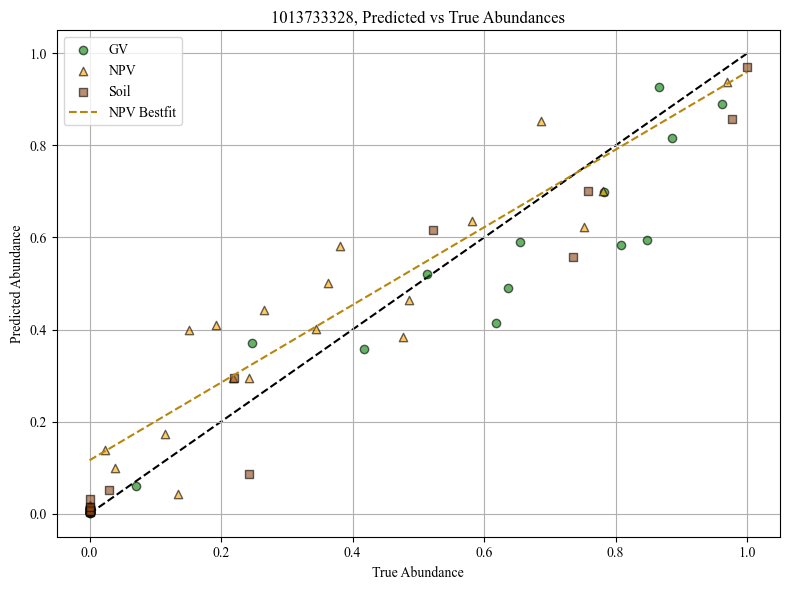

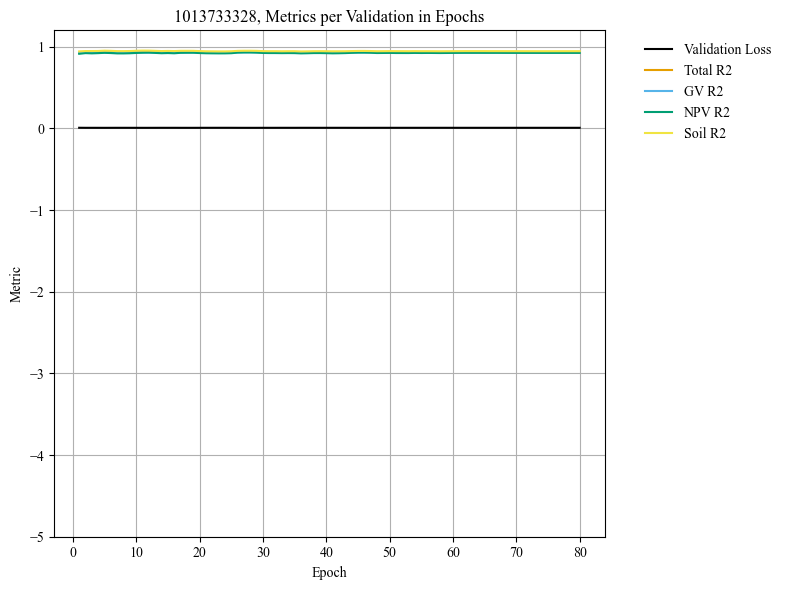

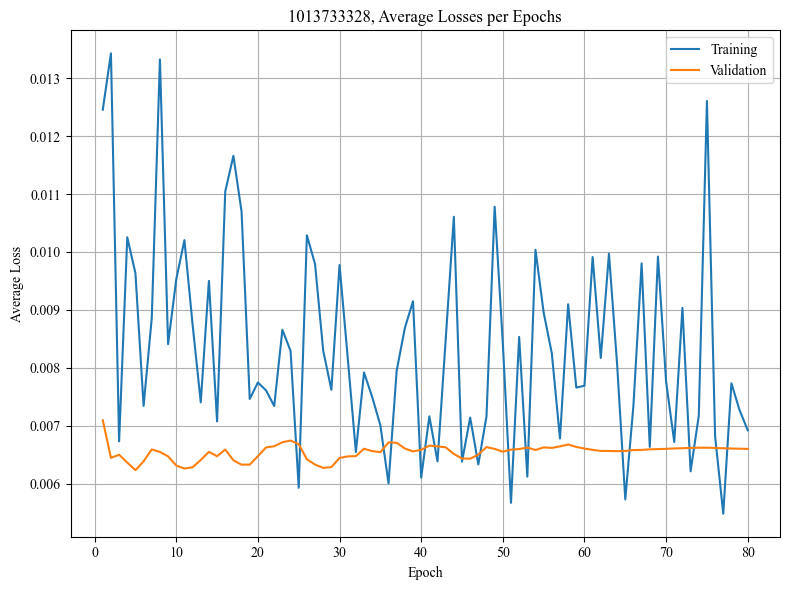

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.005517
Epoch 1/80, Step 2/5, Train Loss: 0.018448
Epoch 1/80, Step 3/5, Train Loss: 0.005922
Epoch 1/80, Step 4/5, Train Loss: 0.007249
Epoch 1/80, Step 5/5, Train Loss: 0.010733
Epoch 1/80 complete. Train Loss: 0.009574, Val Loss: 0.006745
Epoch 2/80, Step 1/5, Train Loss: 0.011806
Epoch 2/80, Step 2/5, Train Loss: 0.016782
Epoch 2/80, Step 3/5, Train Loss: 0.009573
Epoch 2/80, Step 4/5, Train Loss: 0.004608
Epoch 2/80, Step 5/5, Train Loss: 0.005199
Epoch 2/80 complete. Train Loss: 0.009594, Val Loss: 0.005968
Epoch 3/80, Step 1/5, Train Loss: 0.004973
Epoch 3/80, Step 2/5, Train Loss: 0.004261
Epoch 3/80, Step 3/5, Train Loss: 0.016117
Epoch 3/80, Step 4/5, Train Loss: 0.006641
Epoch 3/80, Step 5/5, Train Loss: 0.004333
Epoch 3/80 complete. Train Loss: 0.007265, Val Loss: 0.005273
Epoch 4/80, Step 1/5, Train Loss: 0.003116
Epoch 4/80, Step 2/5, Train Loss: 0.007310
Epoch 4/80, Step 3/5, Train Loss: 0.017305
Epoch 4/80, Step 4/5, Train Loss: 0.0071

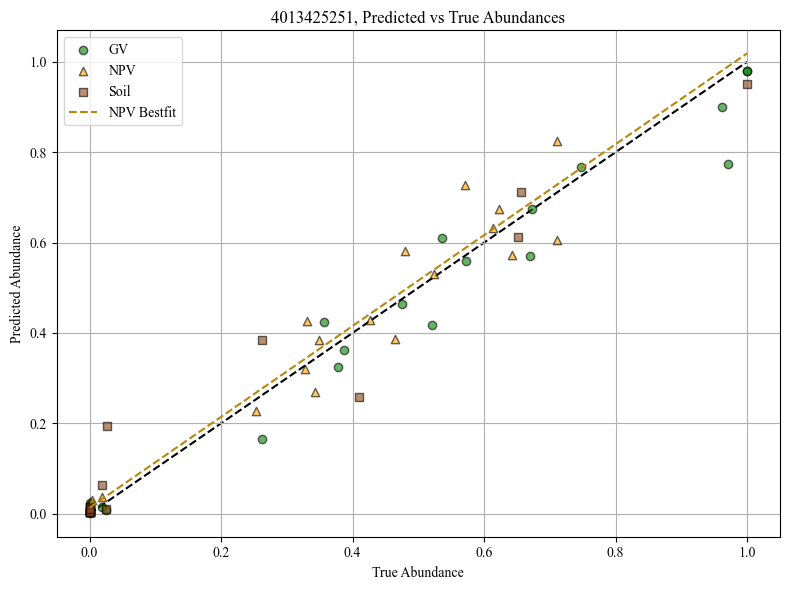

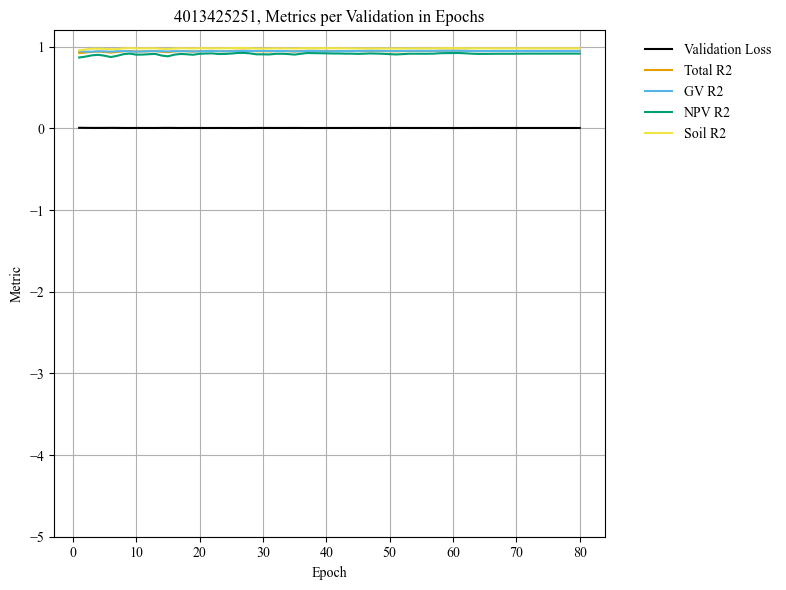

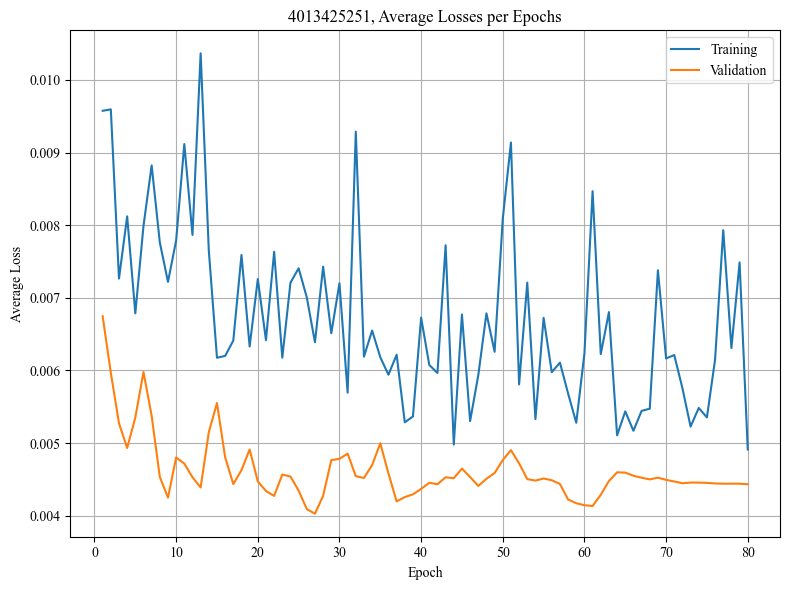

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.012035
Epoch 1/80, Step 2/5, Train Loss: 0.009959
Epoch 1/80, Step 3/5, Train Loss: 0.006654
Epoch 1/80, Step 4/5, Train Loss: 0.008868
Epoch 1/80, Step 5/5, Train Loss: 0.007215
Epoch 1/80 complete. Train Loss: 0.008946, Val Loss: 0.006644
Epoch 2/80, Step 1/5, Train Loss: 0.006185
Epoch 2/80, Step 2/5, Train Loss: 0.006284
Epoch 2/80, Step 3/5, Train Loss: 0.009854
Epoch 2/80, Step 4/5, Train Loss: 0.009083
Epoch 2/80, Step 5/5, Train Loss: 0.007145
Epoch 2/80 complete. Train Loss: 0.007710, Val Loss: 0.006245
Epoch 3/80, Step 1/5, Train Loss: 0.008554
Epoch 3/80, Step 2/5, Train Loss: 0.008967
Epoch 3/80, Step 3/5, Train Loss: 0.006841
Epoch 3/80, Step 4/5, Train Loss: 0.006511
Epoch 3/80, Step 5/5, Train Loss: 0.006336
Epoch 3/80 complete. Train Loss: 0.007442, Val Loss: 0.006533
Epoch 4/80, Step 1/5, Train Loss: 0.006579
Epoch 4/80, Step 2/5, Train Loss: 0.007155
Epoch 4/80, Step 3/5, Train Loss: 0.009650
Epoch 4/80, Step 4/5, Train Loss: 0.0060

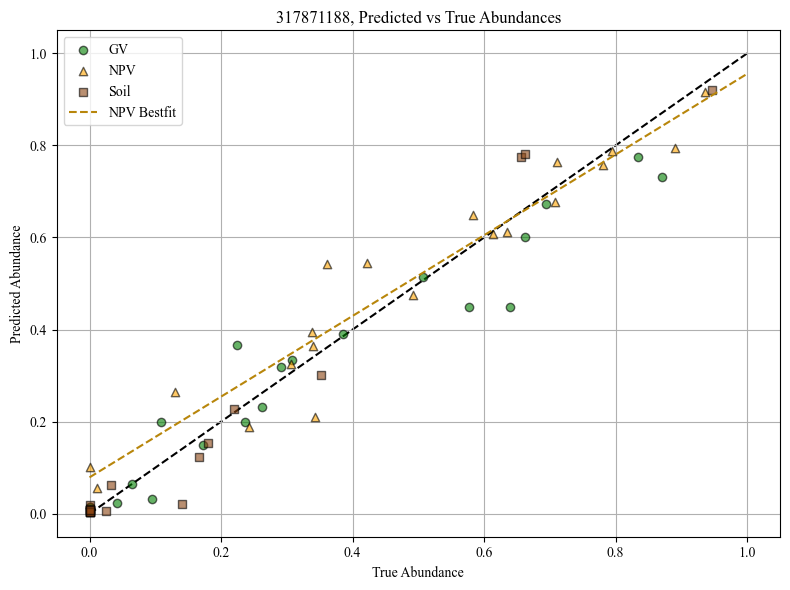

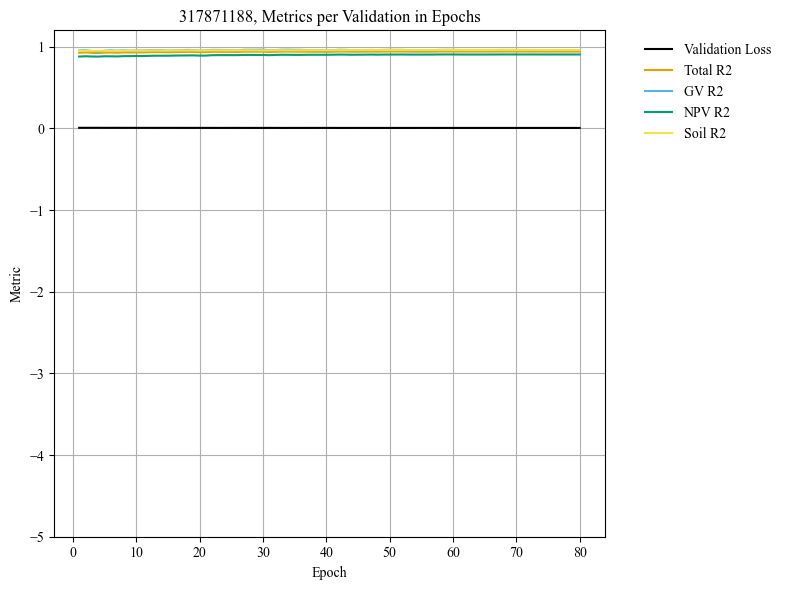

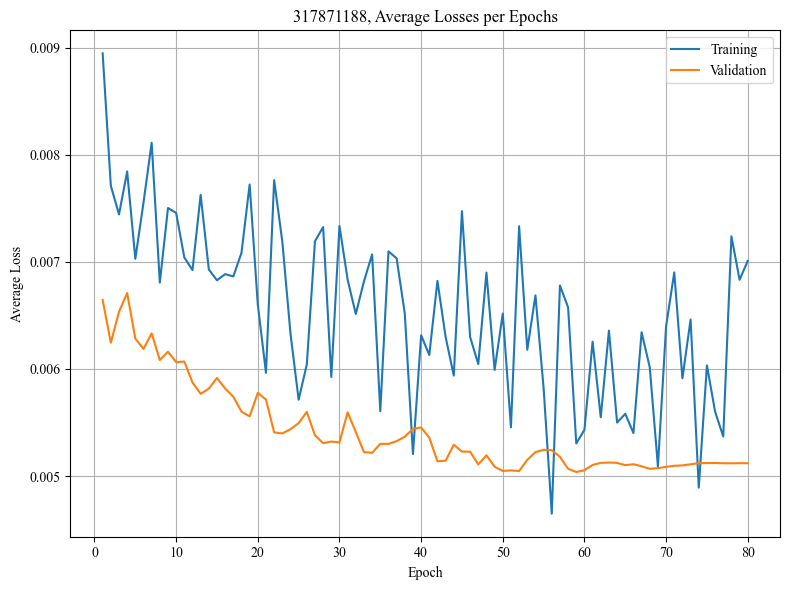

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.010745
Epoch 1/80, Step 2/5, Train Loss: 0.006128
Epoch 1/80, Step 3/5, Train Loss: 0.004971
Epoch 1/80, Step 4/5, Train Loss: 0.007781
Epoch 1/80, Step 5/5, Train Loss: 0.013639
Epoch 1/80 complete. Train Loss: 0.008653, Val Loss: 0.003390
Epoch 2/80, Step 1/5, Train Loss: 0.013150
Epoch 2/80, Step 2/5, Train Loss: 0.007848
Epoch 2/80, Step 3/5, Train Loss: 0.004594
Epoch 2/80, Step 4/5, Train Loss: 0.003849
Epoch 2/80, Step 5/5, Train Loss: 0.008467
Epoch 2/80 complete. Train Loss: 0.007582, Val Loss: 0.002929
Epoch 3/80, Step 1/5, Train Loss: 0.009717
Epoch 3/80, Step 2/5, Train Loss: 0.009424
Epoch 3/80, Step 3/5, Train Loss: 0.004395
Epoch 3/80, Step 4/5, Train Loss: 0.011395
Epoch 3/80, Step 5/5, Train Loss: 0.007125
Epoch 3/80 complete. Train Loss: 0.008411, Val Loss: 0.002807
Epoch 4/80, Step 1/5, Train Loss: 0.008859
Epoch 4/80, Step 2/5, Train Loss: 0.004574
Epoch 4/80, Step 3/5, Train Loss: 0.008920
Epoch 4/80, Step 4/5, Train Loss: 0.0075

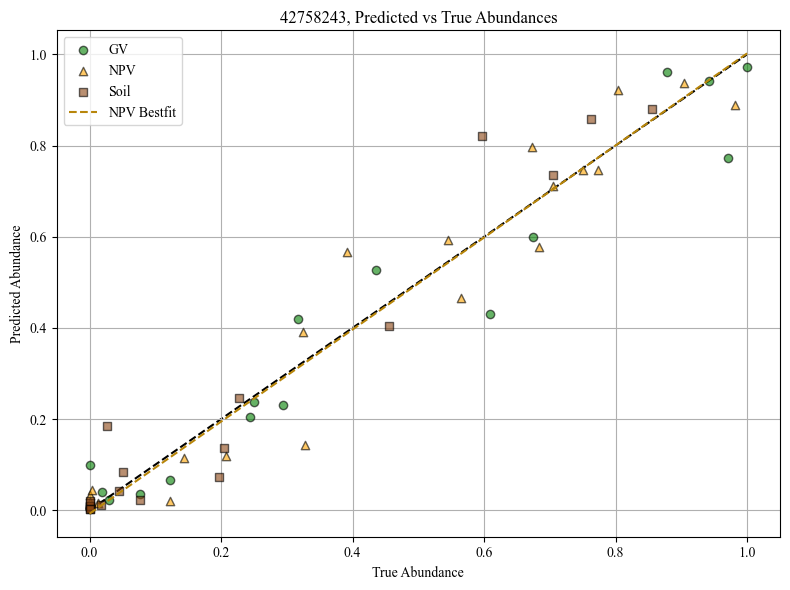

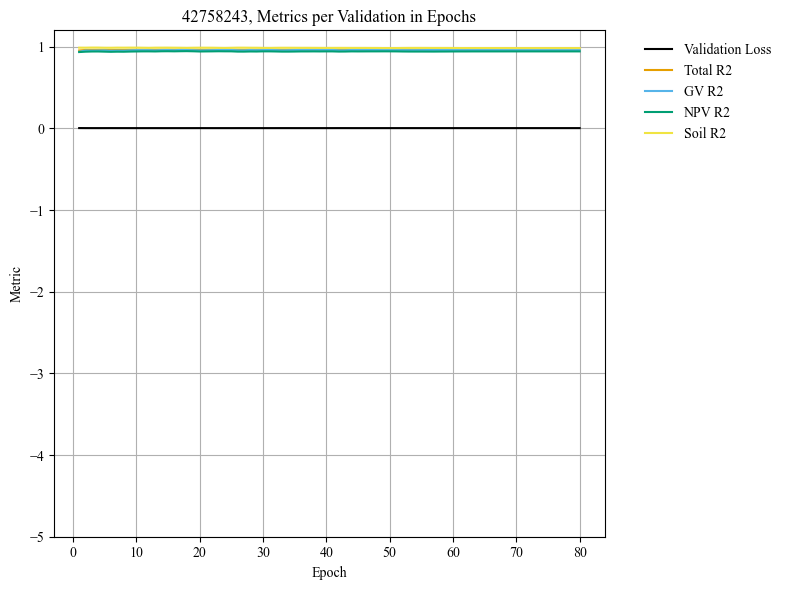

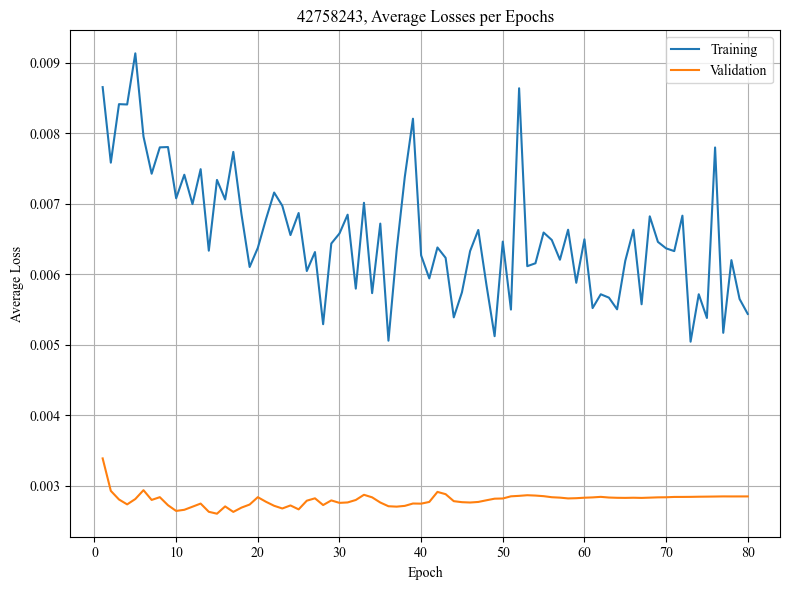

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.012446
Epoch 1/80, Step 2/5, Train Loss: 0.010930
Epoch 1/80, Step 3/5, Train Loss: 0.005996
Epoch 1/80, Step 4/5, Train Loss: 0.004874
Epoch 1/80, Step 5/5, Train Loss: 0.007472
Epoch 1/80 complete. Train Loss: 0.008344, Val Loss: 0.011408
Epoch 2/80, Step 1/5, Train Loss: 0.008148
Epoch 2/80, Step 2/5, Train Loss: 0.006217
Epoch 2/80, Step 3/5, Train Loss: 0.007950
Epoch 2/80, Step 4/5, Train Loss: 0.007310
Epoch 2/80, Step 5/5, Train Loss: 0.004581
Epoch 2/80 complete. Train Loss: 0.006841, Val Loss: 0.011997
Epoch 3/80, Step 1/5, Train Loss: 0.010270
Epoch 3/80, Step 2/5, Train Loss: 0.005858
Epoch 3/80, Step 3/5, Train Loss: 0.004962
Epoch 3/80, Step 4/5, Train Loss: 0.010215
Epoch 3/80, Step 5/5, Train Loss: 0.008548
Epoch 3/80 complete. Train Loss: 0.007970, Val Loss: 0.012300
Epoch 4/80, Step 1/5, Train Loss: 0.008823
Epoch 4/80, Step 2/5, Train Loss: 0.009599
Epoch 4/80, Step 3/5, Train Loss: 0.005616
Epoch 4/80, Step 4/5, Train Loss: 0.0051

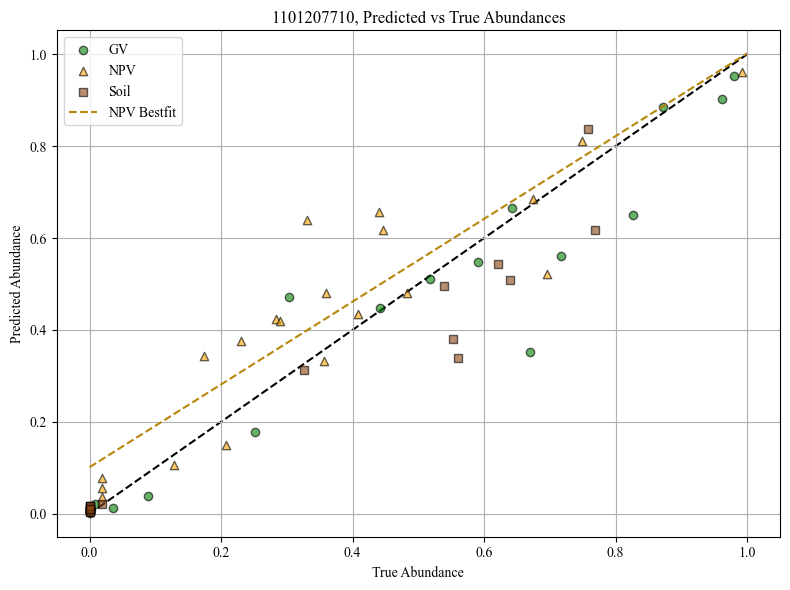

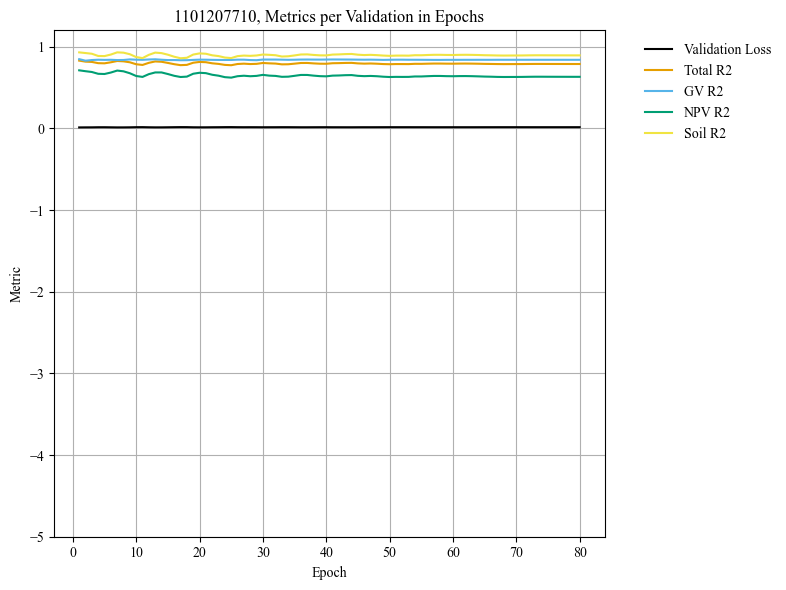

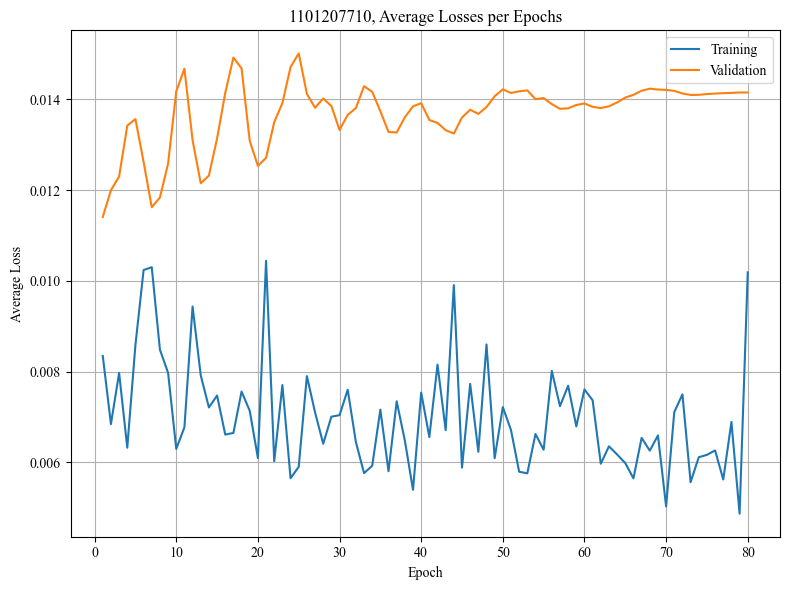

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.003700
Epoch 1/80, Step 2/5, Train Loss: 0.007260
Epoch 1/80, Step 3/5, Train Loss: 0.005498
Epoch 1/80, Step 4/5, Train Loss: 0.014392
Epoch 1/80, Step 5/5, Train Loss: 0.011016
Epoch 1/80 complete. Train Loss: 0.008373, Val Loss: 0.004920
Epoch 2/80, Step 1/5, Train Loss: 0.004199
Epoch 2/80, Step 2/5, Train Loss: 0.006705
Epoch 2/80, Step 3/5, Train Loss: 0.005749
Epoch 2/80, Step 4/5, Train Loss: 0.005693
Epoch 2/80, Step 5/5, Train Loss: 0.010412
Epoch 2/80 complete. Train Loss: 0.006551, Val Loss: 0.005250
Epoch 3/80, Step 1/5, Train Loss: 0.003009
Epoch 3/80, Step 2/5, Train Loss: 0.006270
Epoch 3/80, Step 3/5, Train Loss: 0.007621
Epoch 3/80, Step 4/5, Train Loss: 0.005635
Epoch 3/80, Step 5/5, Train Loss: 0.007242
Epoch 3/80 complete. Train Loss: 0.005955, Val Loss: 0.005326
Epoch 4/80, Step 1/5, Train Loss: 0.005884
Epoch 4/80, Step 2/5, Train Loss: 0.003973
Epoch 4/80, Step 3/5, Train Loss: 0.007992
Epoch 4/80, Step 4/5, Train Loss: 0.0066

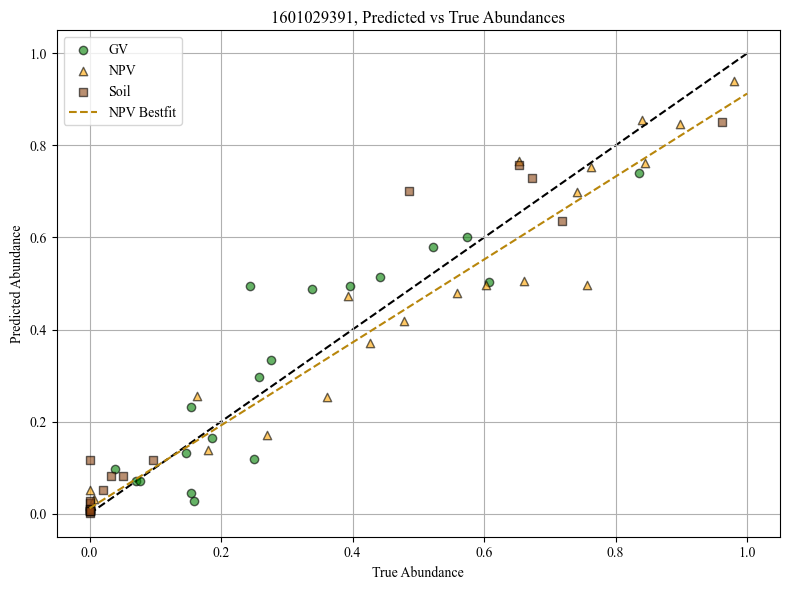

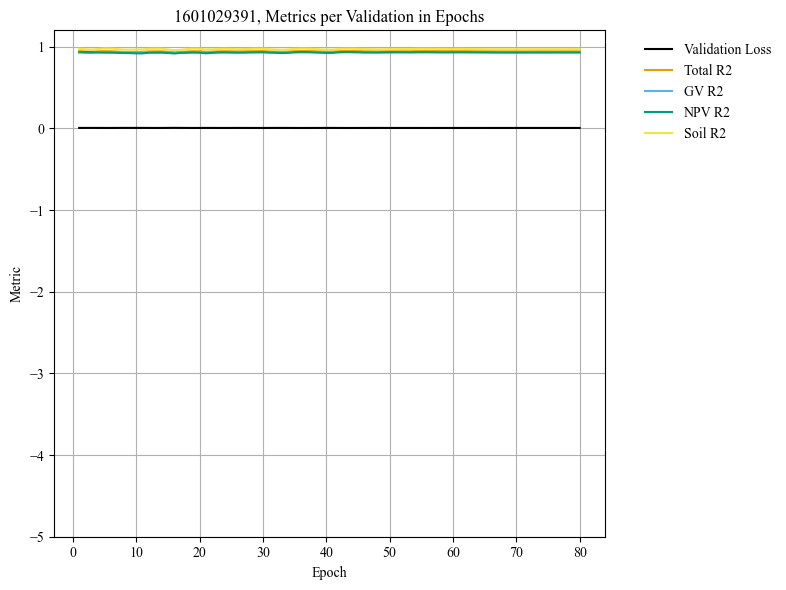

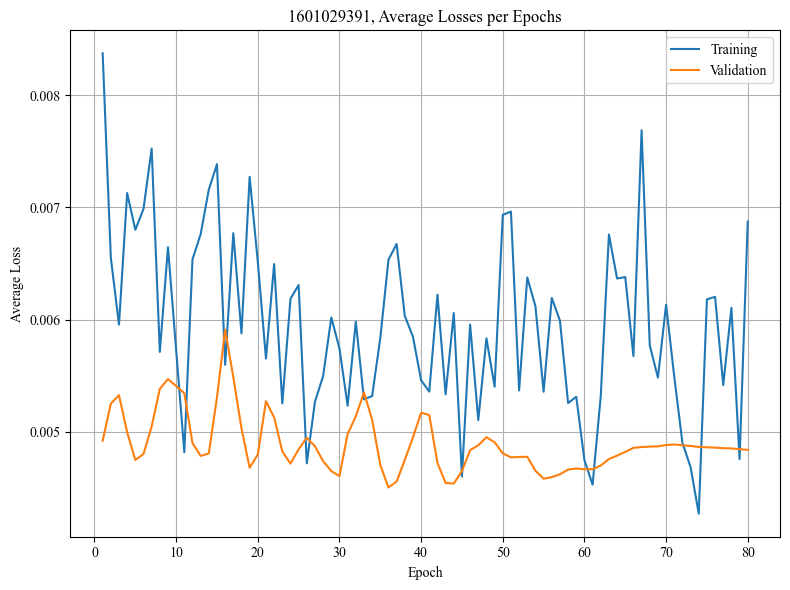

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.016012
Epoch 1/80, Step 2/5, Train Loss: 0.007429
Epoch 1/80, Step 3/5, Train Loss: 0.009668
Epoch 1/80, Step 4/5, Train Loss: 0.004683
Epoch 1/80, Step 5/5, Train Loss: 0.008939
Epoch 1/80 complete. Train Loss: 0.009346, Val Loss: 0.021345
Epoch 2/80, Step 1/5, Train Loss: 0.012175
Epoch 2/80, Step 2/5, Train Loss: 0.003308
Epoch 2/80, Step 3/5, Train Loss: 0.005736
Epoch 2/80, Step 4/5, Train Loss: 0.009997
Epoch 2/80, Step 5/5, Train Loss: 0.006937
Epoch 2/80 complete. Train Loss: 0.007630, Val Loss: 0.020938
Epoch 3/80, Step 1/5, Train Loss: 0.005745
Epoch 3/80, Step 2/5, Train Loss: 0.004460
Epoch 3/80, Step 3/5, Train Loss: 0.002176
Epoch 3/80, Step 4/5, Train Loss: 0.012875
Epoch 3/80, Step 5/5, Train Loss: 0.007471
Epoch 3/80 complete. Train Loss: 0.006545, Val Loss: 0.020051
Epoch 4/80, Step 1/5, Train Loss: 0.011655
Epoch 4/80, Step 2/5, Train Loss: 0.004731
Epoch 4/80, Step 3/5, Train Loss: 0.009192
Epoch 4/80, Step 4/5, Train Loss: 0.0044

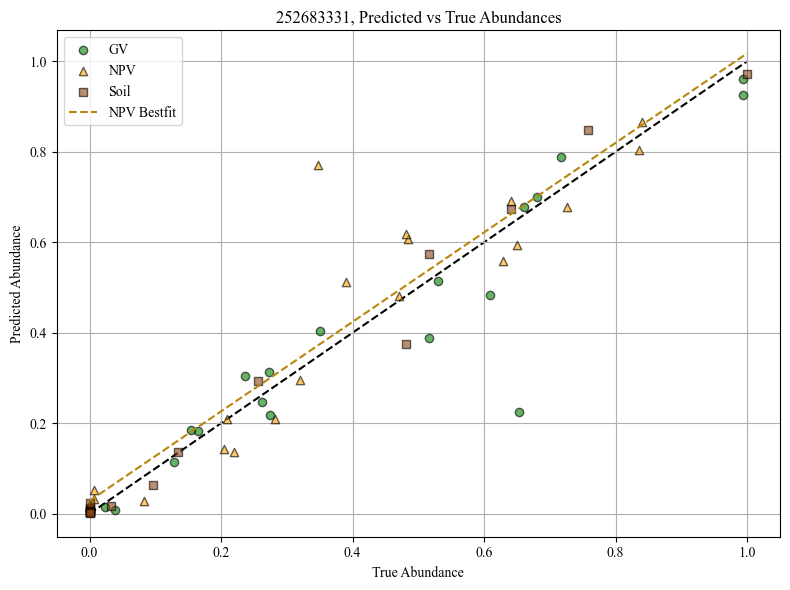

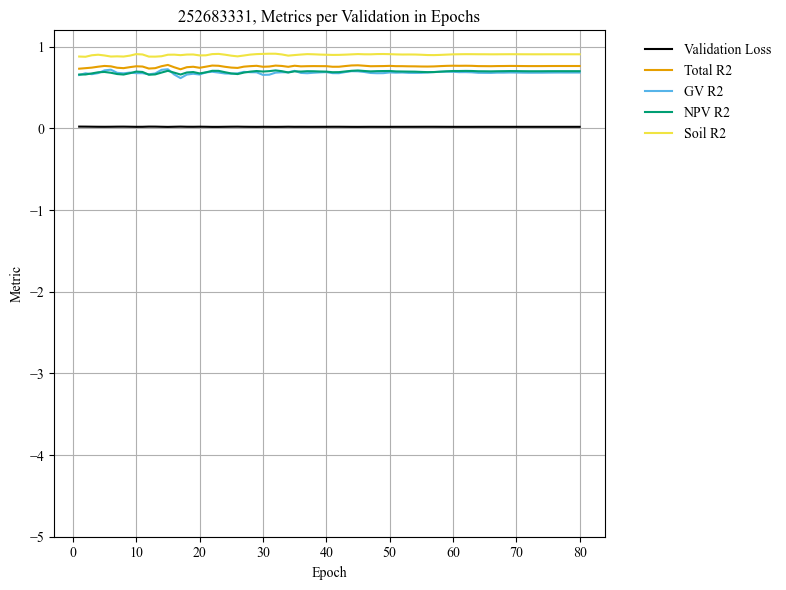

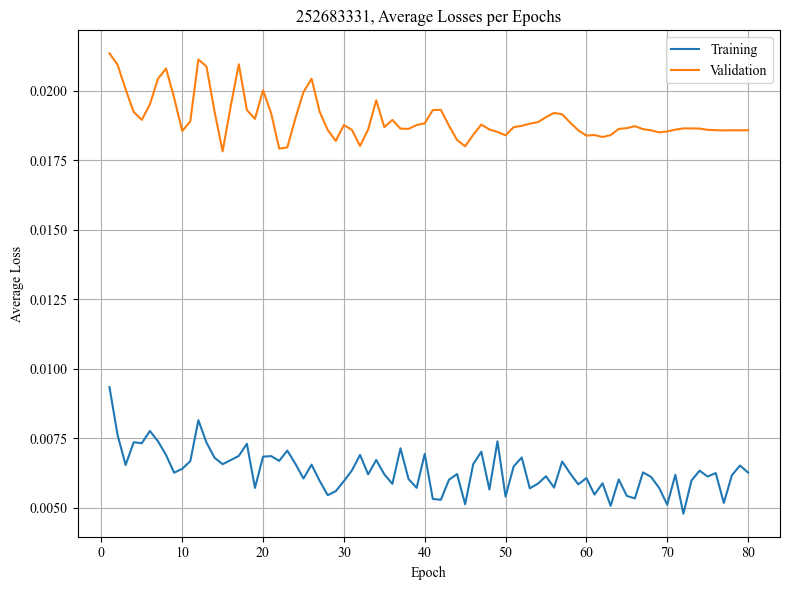

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.007161
Epoch 1/80, Step 2/5, Train Loss: 0.007528
Epoch 1/80, Step 3/5, Train Loss: 0.011769
Epoch 1/80, Step 4/5, Train Loss: 0.008840
Epoch 1/80, Step 5/5, Train Loss: 0.002821
Epoch 1/80 complete. Train Loss: 0.007624, Val Loss: 0.005980
Epoch 2/80, Step 1/5, Train Loss: 0.005975
Epoch 2/80, Step 2/5, Train Loss: 0.006193
Epoch 2/80, Step 3/5, Train Loss: 0.005937
Epoch 2/80, Step 4/5, Train Loss: 0.004280
Epoch 2/80, Step 5/5, Train Loss: 0.009911
Epoch 2/80 complete. Train Loss: 0.006459, Val Loss: 0.006642
Epoch 3/80, Step 1/5, Train Loss: 0.005909
Epoch 3/80, Step 2/5, Train Loss: 0.004343
Epoch 3/80, Step 3/5, Train Loss: 0.005734
Epoch 3/80, Step 4/5, Train Loss: 0.009231
Epoch 3/80, Step 5/5, Train Loss: 0.007905
Epoch 3/80 complete. Train Loss: 0.006625, Val Loss: 0.006917
Epoch 4/80, Step 1/5, Train Loss: 0.004148
Epoch 4/80, Step 2/5, Train Loss: 0.006207
Epoch 4/80, Step 3/5, Train Loss: 0.010769
Epoch 4/80, Step 4/5, Train Loss: 0.0071

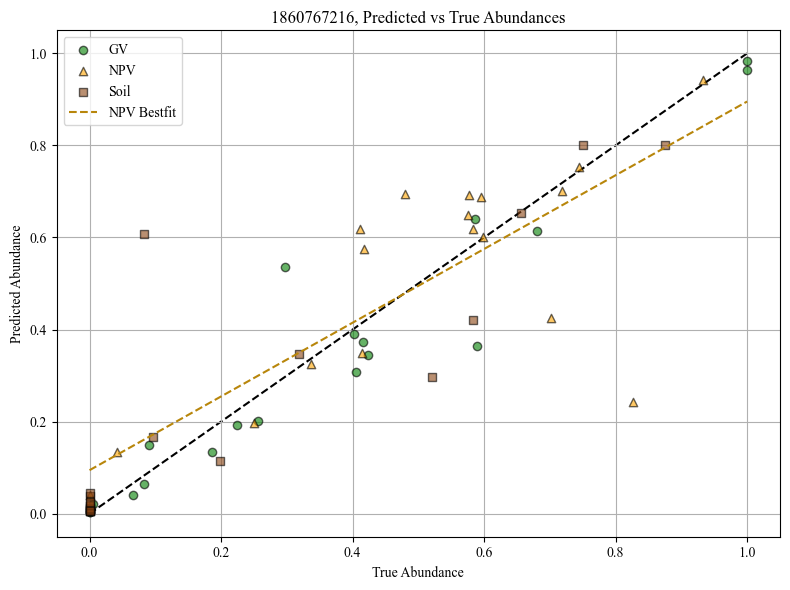

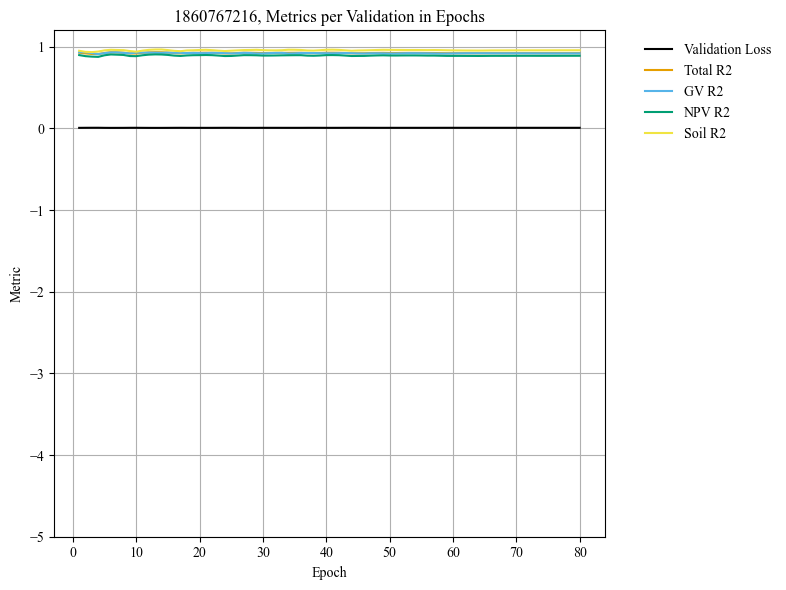

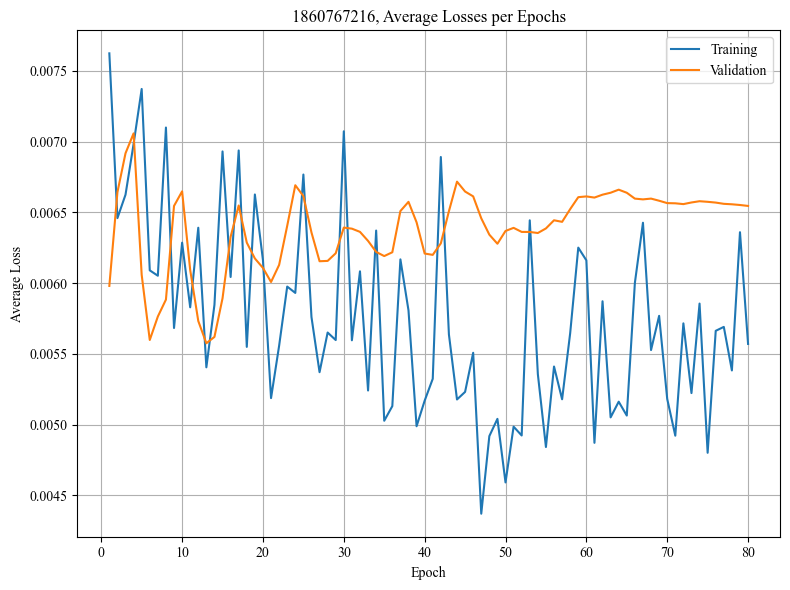

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.004554
Epoch 1/80, Step 2/5, Train Loss: 0.004642
Epoch 1/80, Step 3/5, Train Loss: 0.004321
Epoch 1/80, Step 4/5, Train Loss: 0.006255
Epoch 1/80, Step 5/5, Train Loss: 0.007407
Epoch 1/80 complete. Train Loss: 0.005436, Val Loss: 0.007137
Epoch 2/80, Step 1/5, Train Loss: 0.005805
Epoch 2/80, Step 2/5, Train Loss: 0.006184
Epoch 2/80, Step 3/5, Train Loss: 0.008172
Epoch 2/80, Step 4/5, Train Loss: 0.005920
Epoch 2/80, Step 5/5, Train Loss: 0.007494
Epoch 2/80 complete. Train Loss: 0.006715, Val Loss: 0.006664
Epoch 3/80, Step 1/5, Train Loss: 0.005995
Epoch 3/80, Step 2/5, Train Loss: 0.005738
Epoch 3/80, Step 3/5, Train Loss: 0.005344
Epoch 3/80, Step 4/5, Train Loss: 0.009562
Epoch 3/80, Step 5/5, Train Loss: 0.003909
Epoch 3/80 complete. Train Loss: 0.006110, Val Loss: 0.008603
Epoch 4/80, Step 1/5, Train Loss: 0.004070
Epoch 4/80, Step 2/5, Train Loss: 0.007700
Epoch 4/80, Step 3/5, Train Loss: 0.008029
Epoch 4/80, Step 4/5, Train Loss: 0.0047

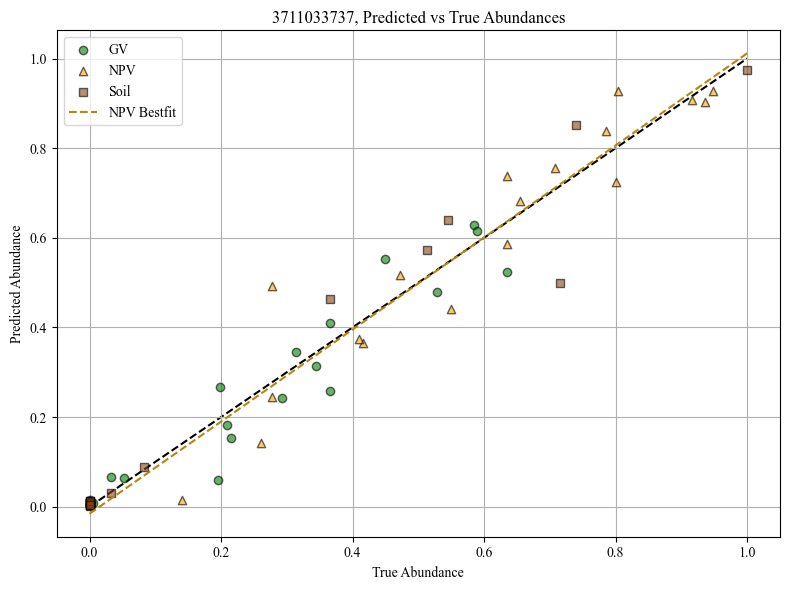

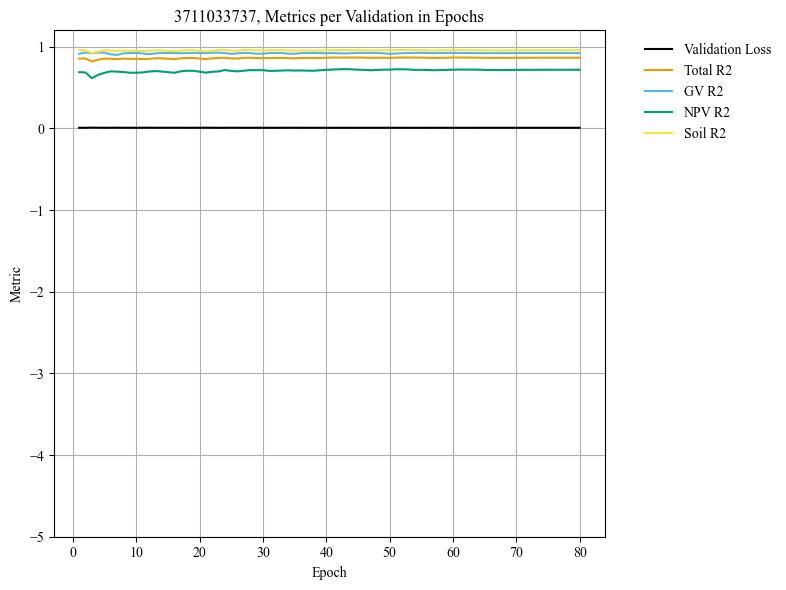

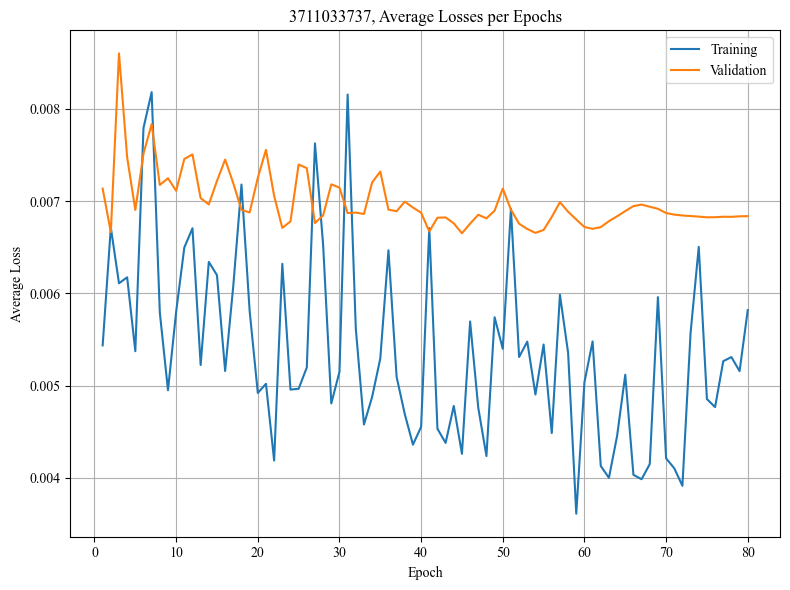

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.004294
Epoch 1/80, Step 2/5, Train Loss: 0.009287
Epoch 1/80, Step 3/5, Train Loss: 0.007673
Epoch 1/80, Step 4/5, Train Loss: 0.015268
Epoch 1/80, Step 5/5, Train Loss: 0.007900
Epoch 1/80 complete. Train Loss: 0.008884, Val Loss: 0.004572
Epoch 2/80, Step 1/5, Train Loss: 0.005142
Epoch 2/80, Step 2/5, Train Loss: 0.012236
Epoch 2/80, Step 3/5, Train Loss: 0.006411
Epoch 2/80, Step 4/5, Train Loss: 0.011145
Epoch 2/80, Step 5/5, Train Loss: 0.009627
Epoch 2/80 complete. Train Loss: 0.008912, Val Loss: 0.004267
Epoch 3/80, Step 1/5, Train Loss: 0.016085
Epoch 3/80, Step 2/5, Train Loss: 0.009911
Epoch 3/80, Step 3/5, Train Loss: 0.009513
Epoch 3/80, Step 4/5, Train Loss: 0.006652
Epoch 3/80, Step 5/5, Train Loss: 0.007204
Epoch 3/80 complete. Train Loss: 0.009873, Val Loss: 0.004379
Epoch 4/80, Step 1/5, Train Loss: 0.005086
Epoch 4/80, Step 2/5, Train Loss: 0.008548
Epoch 4/80, Step 3/5, Train Loss: 0.017463
Epoch 4/80, Step 4/5, Train Loss: 0.0095

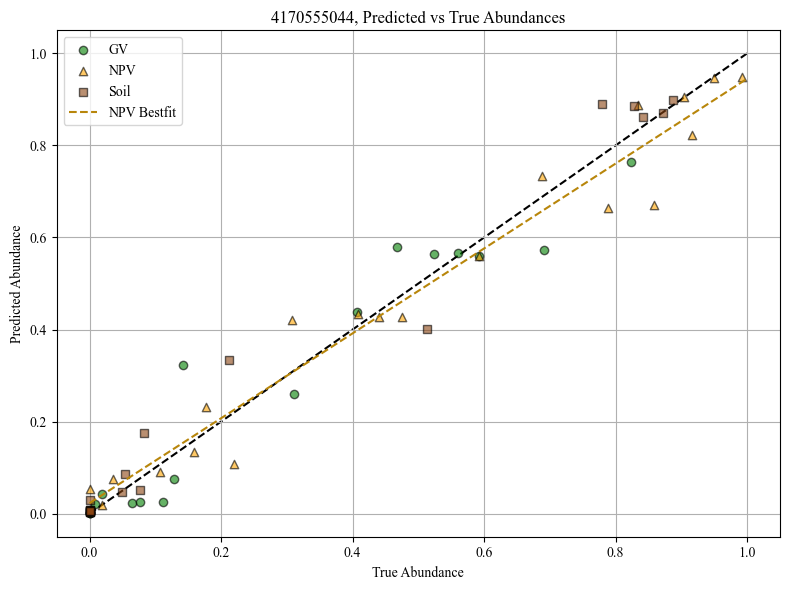

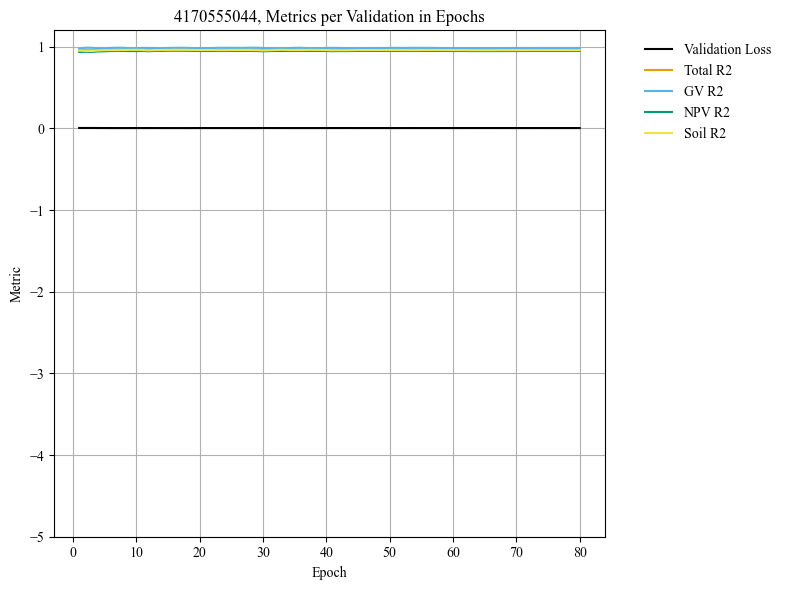

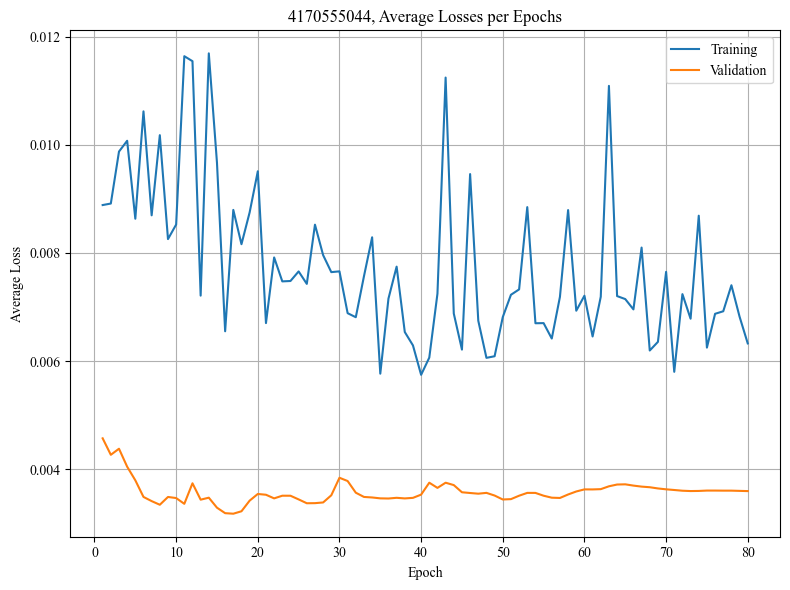

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.002539
Epoch 1/80, Step 2/5, Train Loss: 0.006161
Epoch 1/80, Step 3/5, Train Loss: 0.013307
Epoch 1/80, Step 4/5, Train Loss: 0.010336
Epoch 1/80, Step 5/5, Train Loss: 0.006519
Epoch 1/80 complete. Train Loss: 0.007772, Val Loss: 0.008584
Epoch 2/80, Step 1/5, Train Loss: 0.007427
Epoch 2/80, Step 2/5, Train Loss: 0.007346
Epoch 2/80, Step 3/5, Train Loss: 0.005833
Epoch 2/80, Step 4/5, Train Loss: 0.009175
Epoch 2/80, Step 5/5, Train Loss: 0.011840
Epoch 2/80 complete. Train Loss: 0.008324, Val Loss: 0.009733
Epoch 3/80, Step 1/5, Train Loss: 0.005601
Epoch 3/80, Step 2/5, Train Loss: 0.016479
Epoch 3/80, Step 3/5, Train Loss: 0.005560
Epoch 3/80, Step 4/5, Train Loss: 0.005890
Epoch 3/80, Step 5/5, Train Loss: 0.006083
Epoch 3/80 complete. Train Loss: 0.007923, Val Loss: 0.009374
Epoch 4/80, Step 1/5, Train Loss: 0.015542
Epoch 4/80, Step 2/5, Train Loss: 0.003937
Epoch 4/80, Step 3/5, Train Loss: 0.007167
Epoch 4/80, Step 4/5, Train Loss: 0.0044

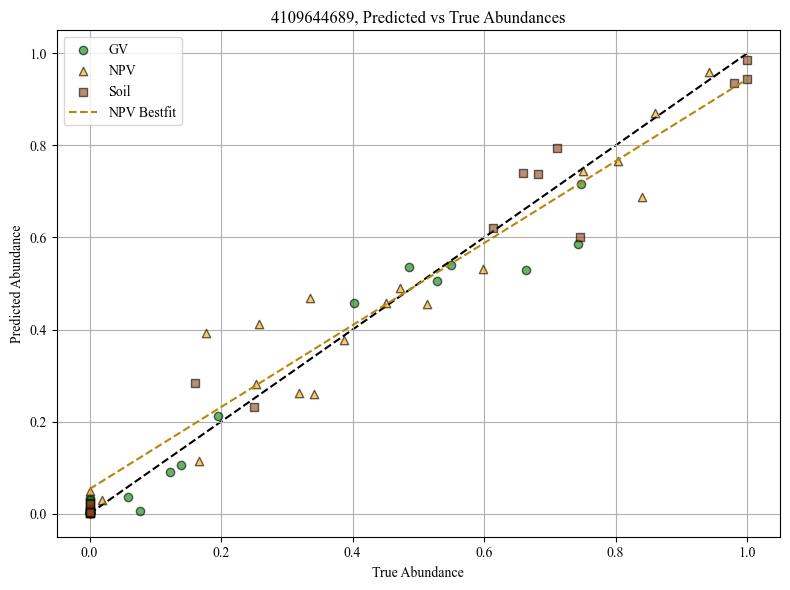

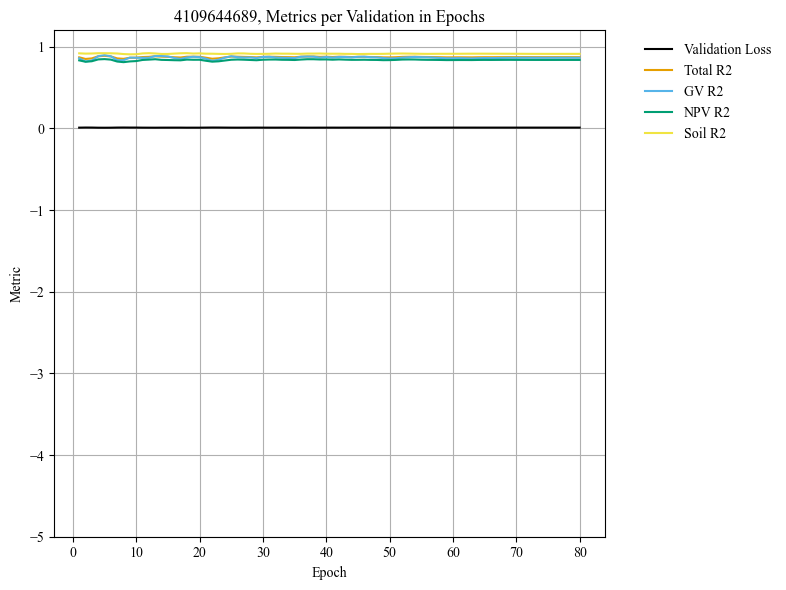

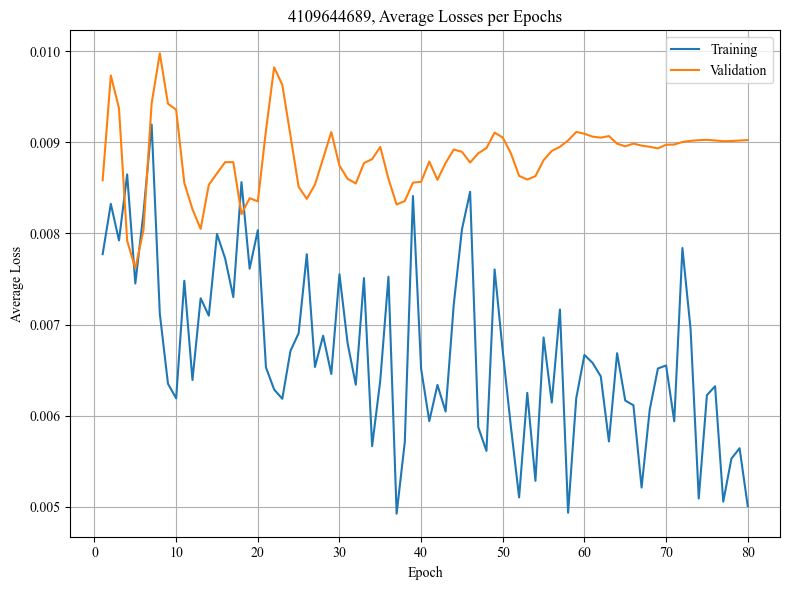

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.004987
Epoch 1/80, Step 2/5, Train Loss: 0.003396
Epoch 1/80, Step 3/5, Train Loss: 0.010935
Epoch 1/80, Step 4/5, Train Loss: 0.014108
Epoch 1/80, Step 5/5, Train Loss: 0.015508
Epoch 1/80 complete. Train Loss: 0.009787, Val Loss: 0.006561
Epoch 2/80, Step 1/5, Train Loss: 0.007031
Epoch 2/80, Step 2/5, Train Loss: 0.004911
Epoch 2/80, Step 3/5, Train Loss: 0.005427
Epoch 2/80, Step 4/5, Train Loss: 0.012731
Epoch 2/80, Step 5/5, Train Loss: 0.007950
Epoch 2/80 complete. Train Loss: 0.007610, Val Loss: 0.005922
Epoch 3/80, Step 1/5, Train Loss: 0.009054
Epoch 3/80, Step 2/5, Train Loss: 0.005967
Epoch 3/80, Step 3/5, Train Loss: 0.011239
Epoch 3/80, Step 4/5, Train Loss: 0.006947
Epoch 3/80, Step 5/5, Train Loss: 0.005396
Epoch 3/80 complete. Train Loss: 0.007721, Val Loss: 0.005863
Epoch 4/80, Step 1/5, Train Loss: 0.009527
Epoch 4/80, Step 2/5, Train Loss: 0.007215
Epoch 4/80, Step 3/5, Train Loss: 0.008575
Epoch 4/80, Step 4/5, Train Loss: 0.0057

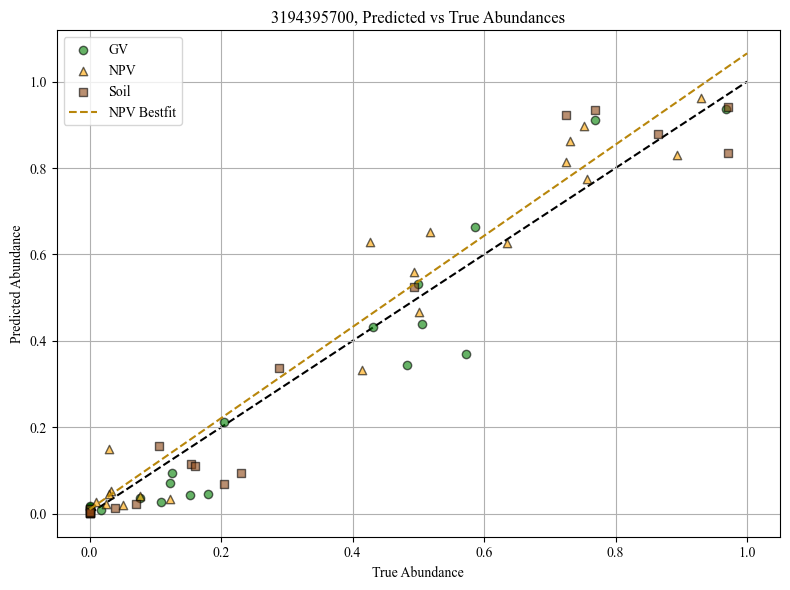

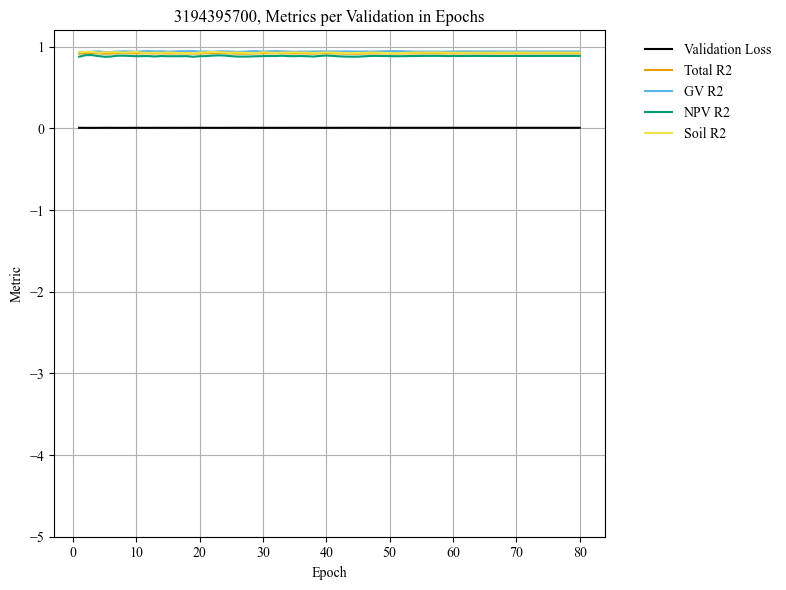

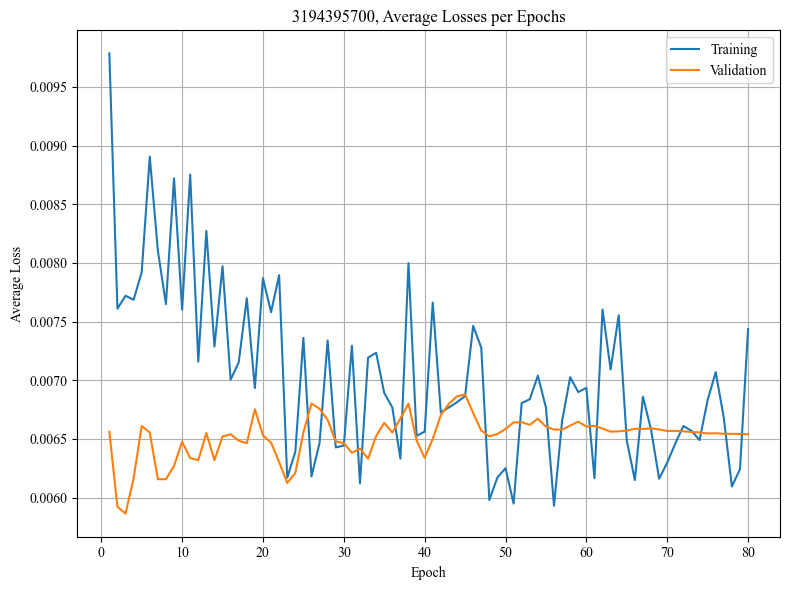

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.006917
Epoch 1/80, Step 2/5, Train Loss: 0.007372
Epoch 1/80, Step 3/5, Train Loss: 0.008292
Epoch 1/80, Step 4/5, Train Loss: 0.011682
Epoch 1/80, Step 5/5, Train Loss: 0.003281
Epoch 1/80 complete. Train Loss: 0.007509, Val Loss: 0.007510
Epoch 2/80, Step 1/5, Train Loss: 0.009211
Epoch 2/80, Step 2/5, Train Loss: 0.005802
Epoch 2/80, Step 3/5, Train Loss: 0.006191
Epoch 2/80, Step 4/5, Train Loss: 0.008046
Epoch 2/80, Step 5/5, Train Loss: 0.006607
Epoch 2/80 complete. Train Loss: 0.007171, Val Loss: 0.008626
Epoch 3/80, Step 1/5, Train Loss: 0.009209
Epoch 3/80, Step 2/5, Train Loss: 0.005207
Epoch 3/80, Step 3/5, Train Loss: 0.003407
Epoch 3/80, Step 4/5, Train Loss: 0.008252
Epoch 3/80, Step 5/5, Train Loss: 0.011662
Epoch 3/80 complete. Train Loss: 0.007547, Val Loss: 0.007512
Epoch 4/80, Step 1/5, Train Loss: 0.006226
Epoch 4/80, Step 2/5, Train Loss: 0.006465
Epoch 4/80, Step 3/5, Train Loss: 0.002227
Epoch 4/80, Step 4/5, Train Loss: 0.0097

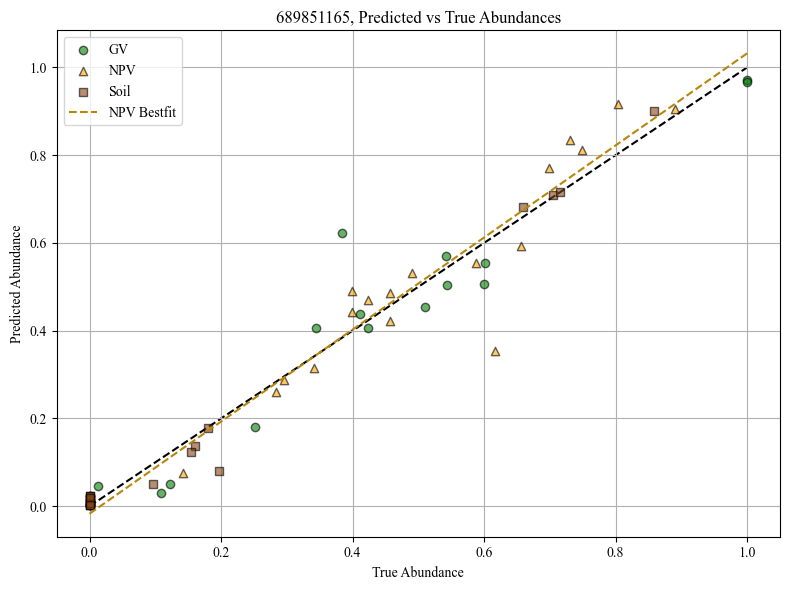

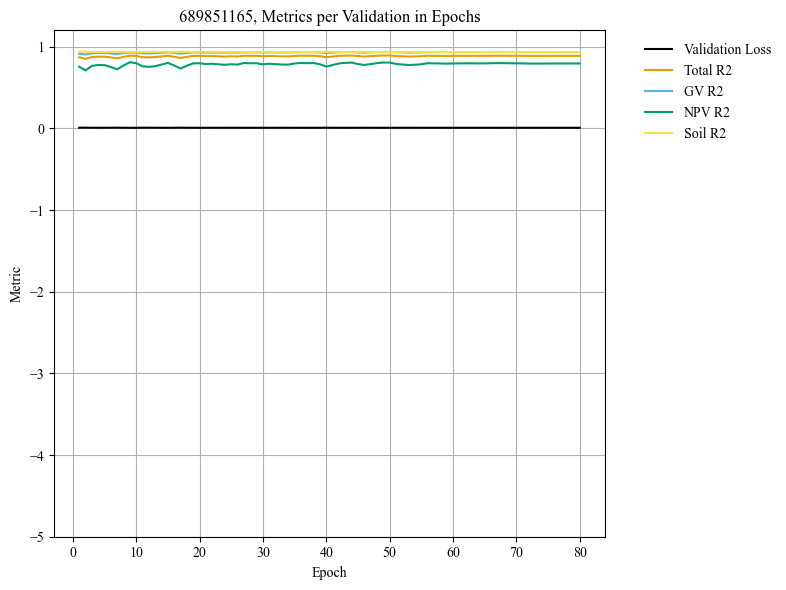

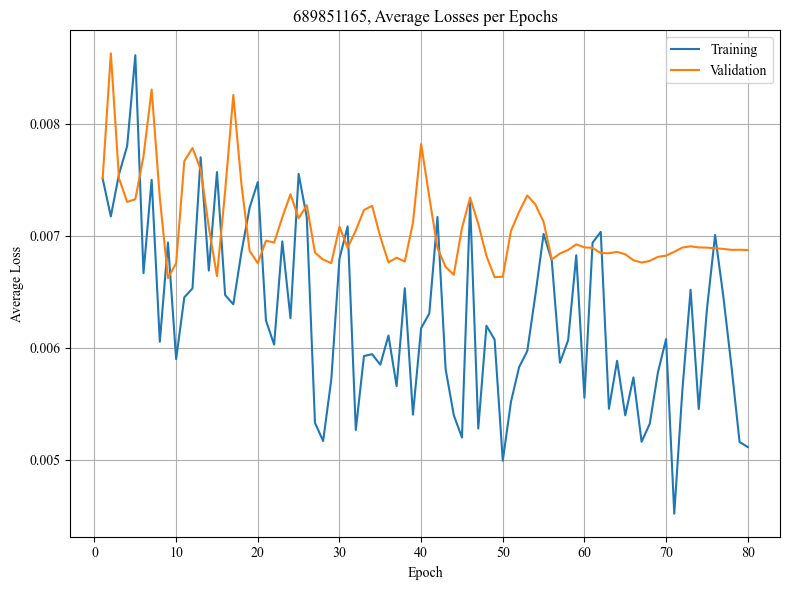

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.004542
Epoch 1/80, Step 2/5, Train Loss: 0.009611
Epoch 1/80, Step 3/5, Train Loss: 0.004422
Epoch 1/80, Step 4/5, Train Loss: 0.004532
Epoch 1/80, Step 5/5, Train Loss: 0.005574
Epoch 1/80 complete. Train Loss: 0.005736, Val Loss: 0.008840
Epoch 2/80, Step 1/5, Train Loss: 0.006803
Epoch 2/80, Step 2/5, Train Loss: 0.005634
Epoch 2/80, Step 3/5, Train Loss: 0.007989
Epoch 2/80, Step 4/5, Train Loss: 0.005849
Epoch 2/80, Step 5/5, Train Loss: 0.007020
Epoch 2/80 complete. Train Loss: 0.006659, Val Loss: 0.009088
Epoch 3/80, Step 1/5, Train Loss: 0.004390
Epoch 3/80, Step 2/5, Train Loss: 0.003434
Epoch 3/80, Step 3/5, Train Loss: 0.007215
Epoch 3/80, Step 4/5, Train Loss: 0.005835
Epoch 3/80, Step 5/5, Train Loss: 0.007631
Epoch 3/80 complete. Train Loss: 0.005701, Val Loss: 0.010004
Epoch 4/80, Step 1/5, Train Loss: 0.002546
Epoch 4/80, Step 2/5, Train Loss: 0.009596
Epoch 4/80, Step 3/5, Train Loss: 0.005902
Epoch 4/80, Step 4/5, Train Loss: 0.0062

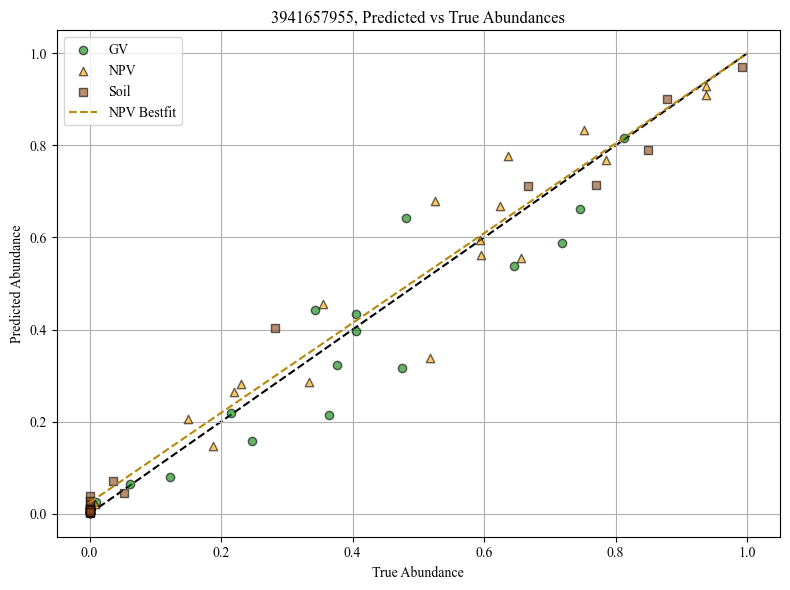

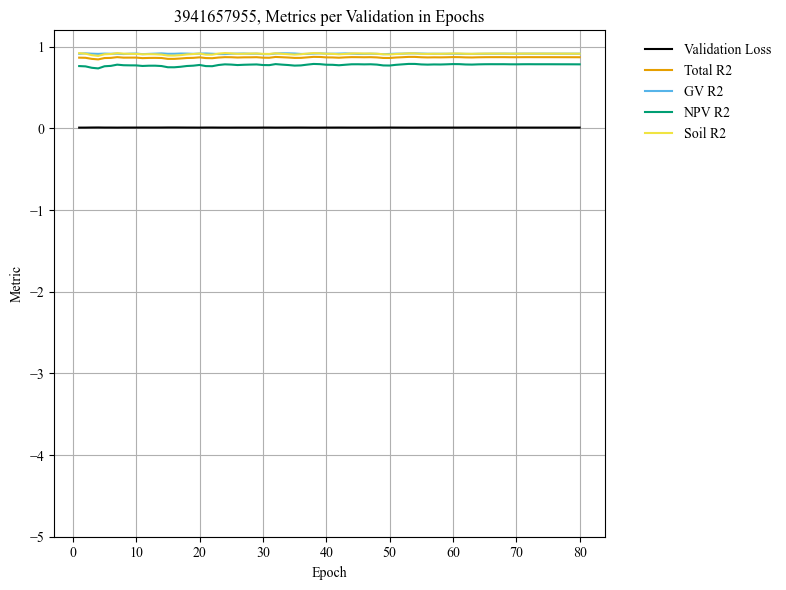

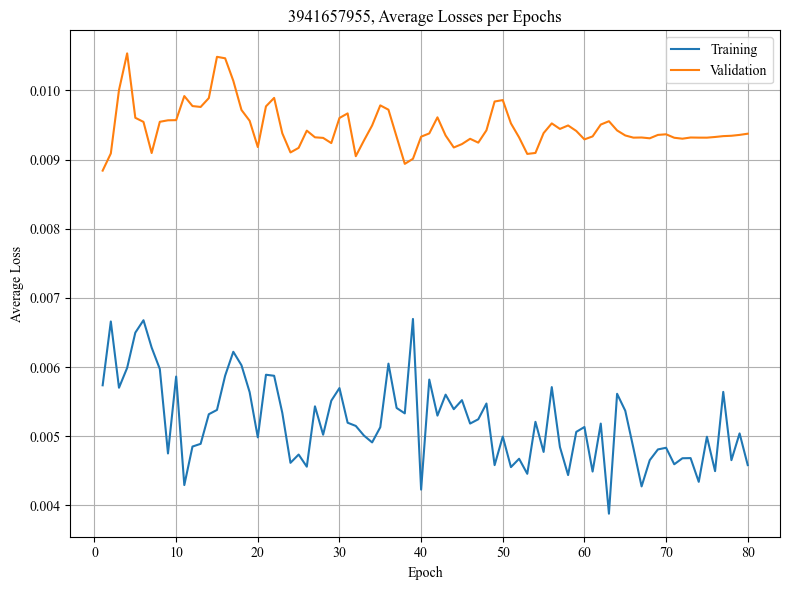

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.005427
Epoch 1/80, Step 2/5, Train Loss: 0.007682
Epoch 1/80, Step 3/5, Train Loss: 0.010783
Epoch 1/80, Step 4/5, Train Loss: 0.007015
Epoch 1/80, Step 5/5, Train Loss: 0.008112
Epoch 1/80 complete. Train Loss: 0.007804, Val Loss: 0.006882
Epoch 2/80, Step 1/5, Train Loss: 0.004424
Epoch 2/80, Step 2/5, Train Loss: 0.007256
Epoch 2/80, Step 3/5, Train Loss: 0.007873
Epoch 2/80, Step 4/5, Train Loss: 0.008847
Epoch 2/80, Step 5/5, Train Loss: 0.005921
Epoch 2/80 complete. Train Loss: 0.006864, Val Loss: 0.006591
Epoch 3/80, Step 1/5, Train Loss: 0.007514
Epoch 3/80, Step 2/5, Train Loss: 0.005738
Epoch 3/80, Step 3/5, Train Loss: 0.006282
Epoch 3/80, Step 4/5, Train Loss: 0.008197
Epoch 3/80, Step 5/5, Train Loss: 0.004688
Epoch 3/80 complete. Train Loss: 0.006484, Val Loss: 0.006391
Epoch 4/80, Step 1/5, Train Loss: 0.007559
Epoch 4/80, Step 2/5, Train Loss: 0.005613
Epoch 4/80, Step 3/5, Train Loss: 0.006171
Epoch 4/80, Step 4/5, Train Loss: 0.0080

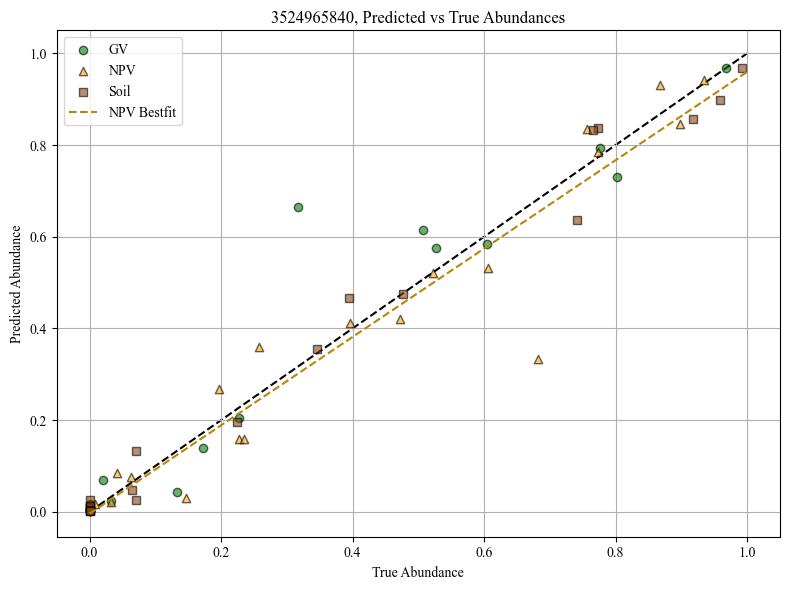

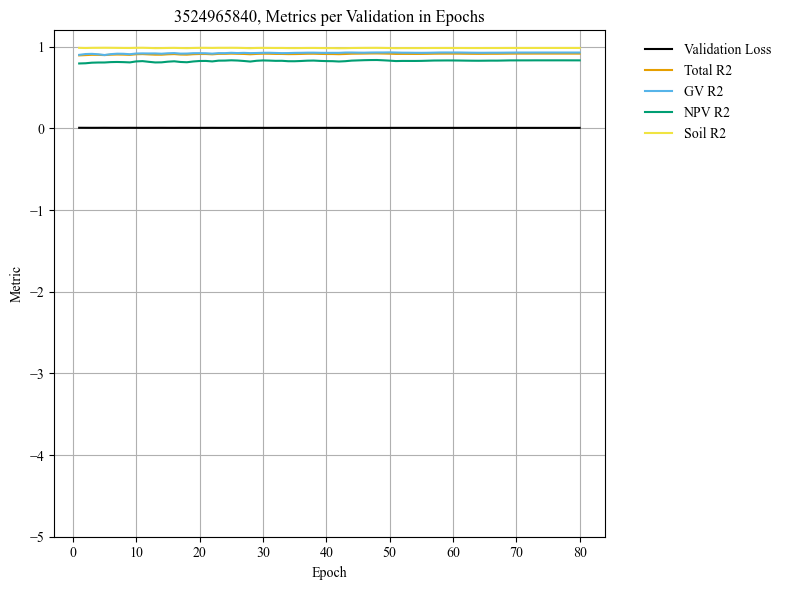

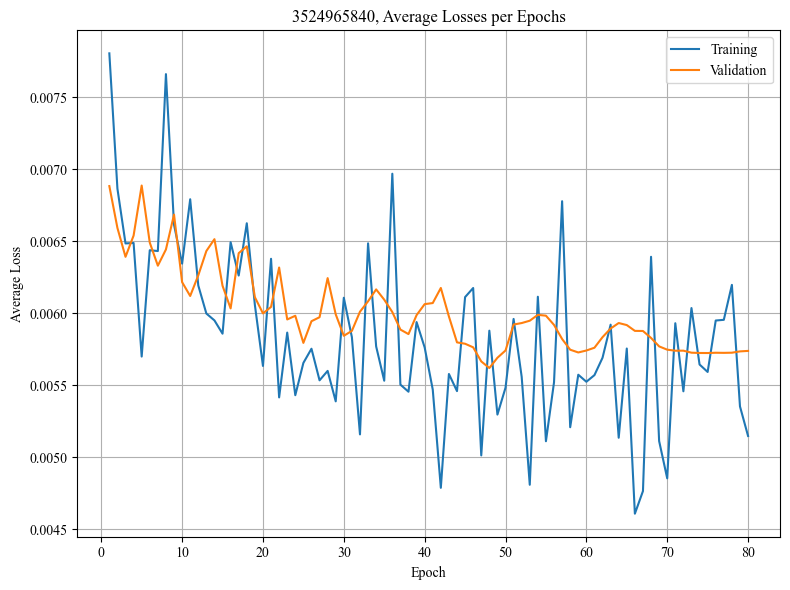

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.008683
Epoch 1/80, Step 2/5, Train Loss: 0.009628
Epoch 1/80, Step 3/5, Train Loss: 0.008060
Epoch 1/80, Step 4/5, Train Loss: 0.007554
Epoch 1/80, Step 5/5, Train Loss: 0.010576
Epoch 1/80 complete. Train Loss: 0.008900, Val Loss: 0.005975
Epoch 2/80, Step 1/5, Train Loss: 0.012078
Epoch 2/80, Step 2/5, Train Loss: 0.009215
Epoch 2/80, Step 3/5, Train Loss: 0.005935
Epoch 2/80, Step 4/5, Train Loss: 0.006489
Epoch 2/80, Step 5/5, Train Loss: 0.006237
Epoch 2/80 complete. Train Loss: 0.007991, Val Loss: 0.005821
Epoch 3/80, Step 1/5, Train Loss: 0.006594
Epoch 3/80, Step 2/5, Train Loss: 0.006530
Epoch 3/80, Step 3/5, Train Loss: 0.005149
Epoch 3/80, Step 4/5, Train Loss: 0.011944
Epoch 3/80, Step 5/5, Train Loss: 0.008181
Epoch 3/80 complete. Train Loss: 0.007680, Val Loss: 0.005719
Epoch 4/80, Step 1/5, Train Loss: 0.006571
Epoch 4/80, Step 2/5, Train Loss: 0.003535
Epoch 4/80, Step 3/5, Train Loss: 0.008519
Epoch 4/80, Step 4/5, Train Loss: 0.0052

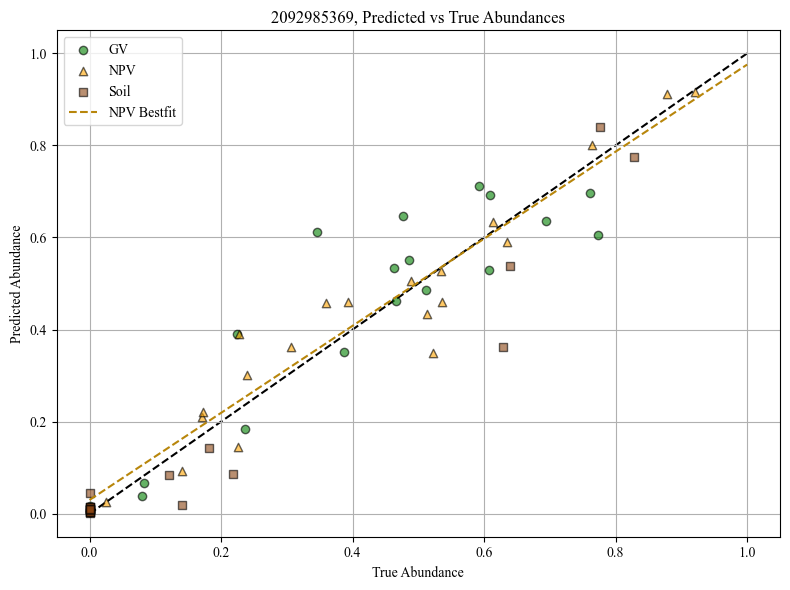

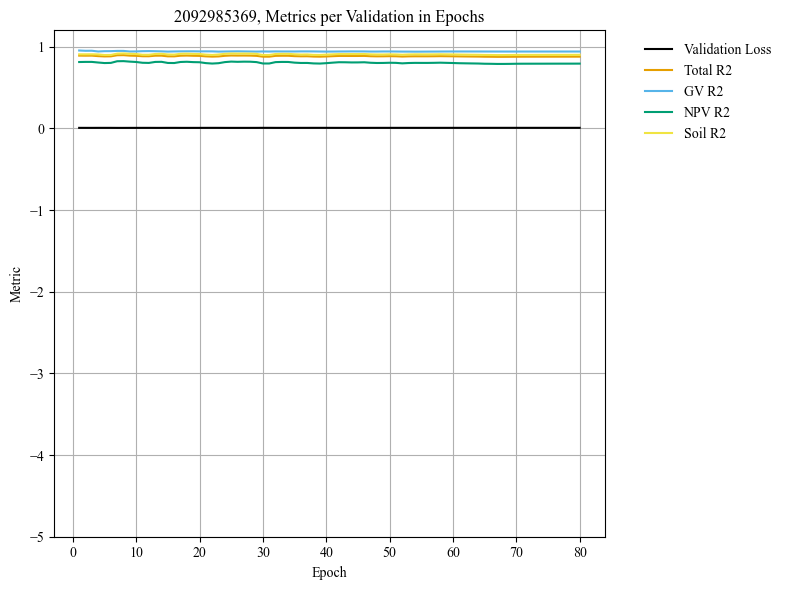

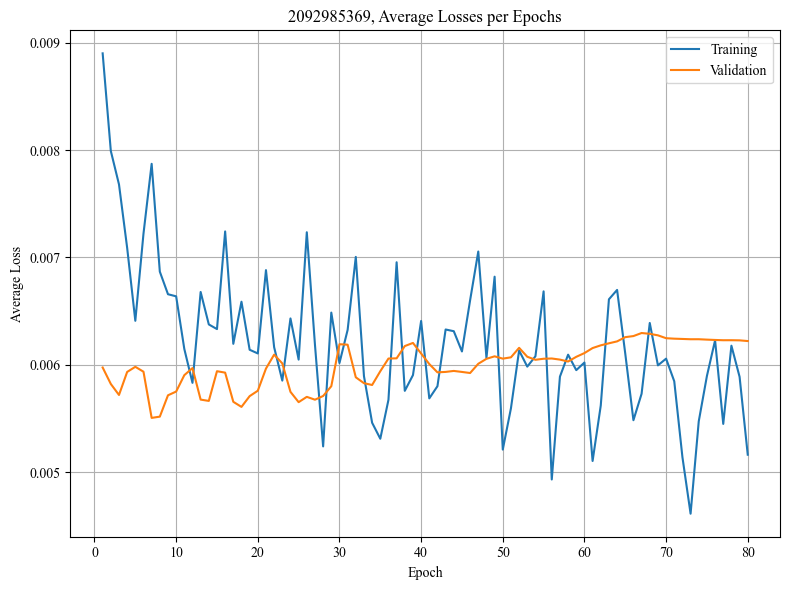

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.022637
Epoch 1/80, Step 2/5, Train Loss: 0.010285
Epoch 1/80, Step 3/5, Train Loss: 0.013071
Epoch 1/80, Step 4/5, Train Loss: 0.009992
Epoch 1/80, Step 5/5, Train Loss: 0.010639
Epoch 1/80 complete. Train Loss: 0.013325, Val Loss: 0.008329
Epoch 2/80, Step 1/5, Train Loss: 0.026849
Epoch 2/80, Step 2/5, Train Loss: 0.007425
Epoch 2/80, Step 3/5, Train Loss: 0.007265
Epoch 2/80, Step 4/5, Train Loss: 0.005309
Epoch 2/80, Step 5/5, Train Loss: 0.010451
Epoch 2/80 complete. Train Loss: 0.011460, Val Loss: 0.010381
Epoch 3/80, Step 1/5, Train Loss: 0.007620
Epoch 3/80, Step 2/5, Train Loss: 0.010495
Epoch 3/80, Step 3/5, Train Loss: 0.014605
Epoch 3/80, Step 4/5, Train Loss: 0.015511
Epoch 3/80, Step 5/5, Train Loss: 0.013063
Epoch 3/80 complete. Train Loss: 0.012259, Val Loss: 0.010181
Epoch 4/80, Step 1/5, Train Loss: 0.010671
Epoch 4/80, Step 2/5, Train Loss: 0.015059
Epoch 4/80, Step 3/5, Train Loss: 0.011487
Epoch 4/80, Step 4/5, Train Loss: 0.0090

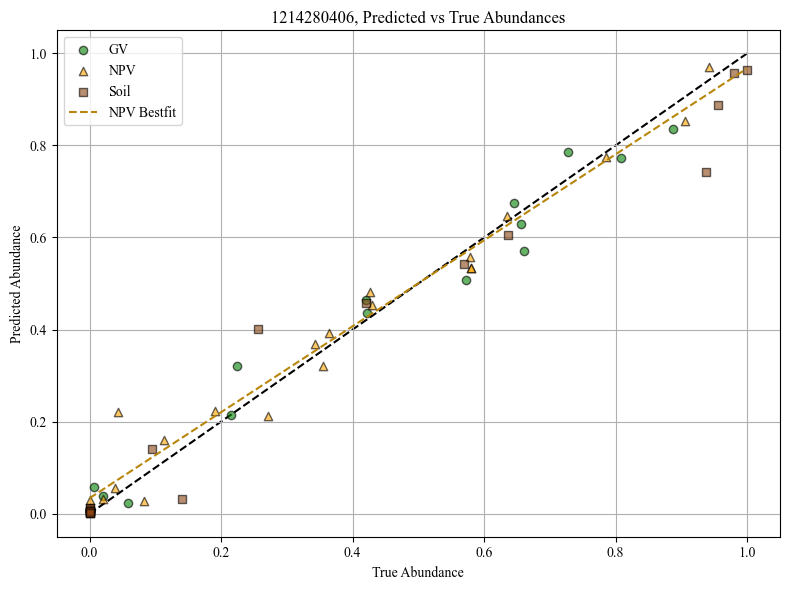

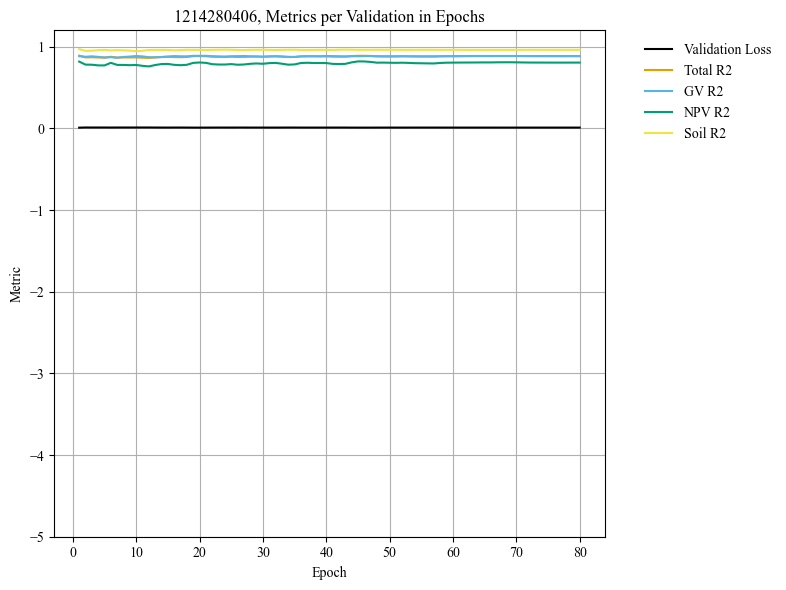

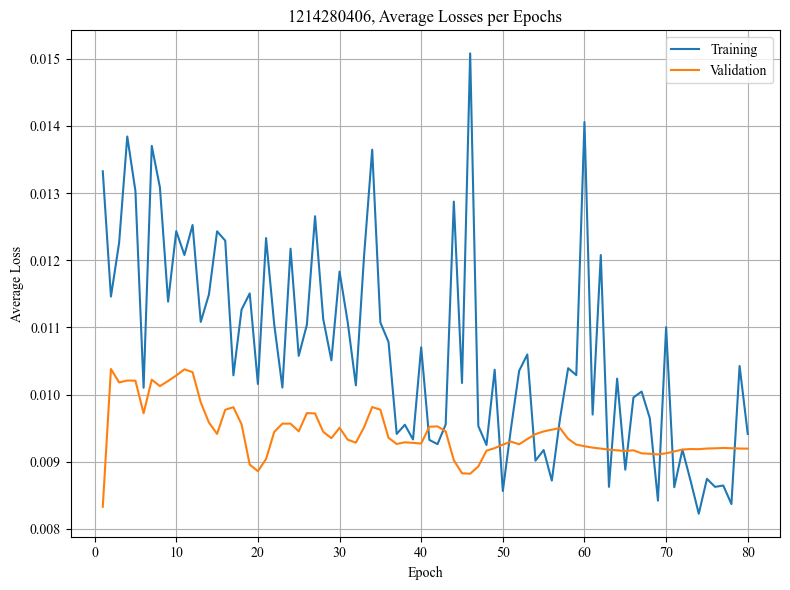

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.002824
Epoch 1/80, Step 2/5, Train Loss: 0.003159
Epoch 1/80, Step 3/5, Train Loss: 0.007507
Epoch 1/80, Step 4/5, Train Loss: 0.007534
Epoch 1/80, Step 5/5, Train Loss: 0.005787
Epoch 1/80 complete. Train Loss: 0.005362, Val Loss: 0.005401
Epoch 2/80, Step 1/5, Train Loss: 0.003426
Epoch 2/80, Step 2/5, Train Loss: 0.004937
Epoch 2/80, Step 3/5, Train Loss: 0.013117
Epoch 2/80, Step 4/5, Train Loss: 0.005478
Epoch 2/80, Step 5/5, Train Loss: 0.004160
Epoch 2/80 complete. Train Loss: 0.006224, Val Loss: 0.005236
Epoch 3/80, Step 1/5, Train Loss: 0.005909
Epoch 3/80, Step 2/5, Train Loss: 0.007444
Epoch 3/80, Step 3/5, Train Loss: 0.002774
Epoch 3/80, Step 4/5, Train Loss: 0.003158
Epoch 3/80, Step 5/5, Train Loss: 0.006461
Epoch 3/80 complete. Train Loss: 0.005149, Val Loss: 0.005541
Epoch 4/80, Step 1/5, Train Loss: 0.003128
Epoch 4/80, Step 2/5, Train Loss: 0.007134
Epoch 4/80, Step 3/5, Train Loss: 0.007560
Epoch 4/80, Step 4/5, Train Loss: 0.0059

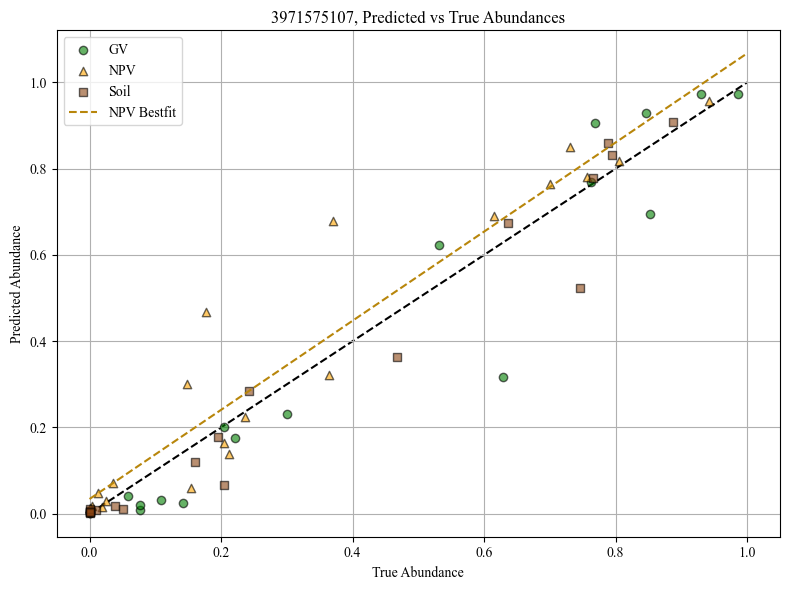

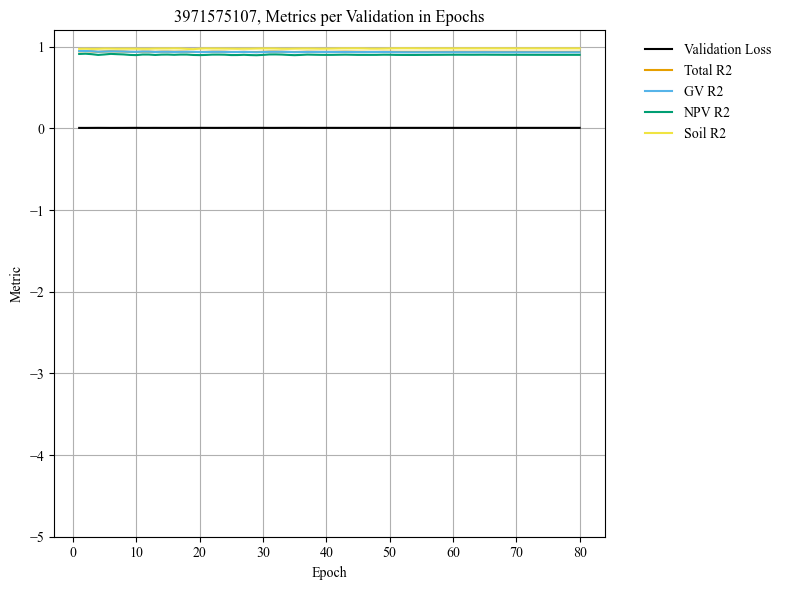

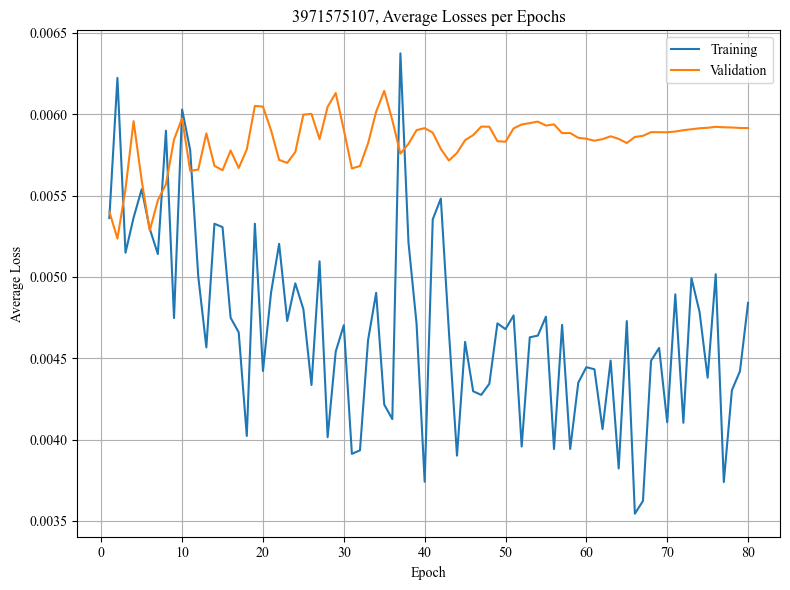

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.017321
Epoch 1/80, Step 2/5, Train Loss: 0.010373
Epoch 1/80, Step 3/5, Train Loss: 0.008426
Epoch 1/80, Step 4/5, Train Loss: 0.008605
Epoch 1/80, Step 5/5, Train Loss: 0.007276
Epoch 1/80 complete. Train Loss: 0.010400, Val Loss: 0.006489
Epoch 2/80, Step 1/5, Train Loss: 0.008794
Epoch 2/80, Step 2/5, Train Loss: 0.013532
Epoch 2/80, Step 3/5, Train Loss: 0.007814
Epoch 2/80, Step 4/5, Train Loss: 0.013533
Epoch 2/80, Step 5/5, Train Loss: 0.004254
Epoch 2/80 complete. Train Loss: 0.009586, Val Loss: 0.006164
Epoch 3/80, Step 1/5, Train Loss: 0.006295
Epoch 3/80, Step 2/5, Train Loss: 0.009041
Epoch 3/80, Step 3/5, Train Loss: 0.008949
Epoch 3/80, Step 4/5, Train Loss: 0.011091
Epoch 3/80, Step 5/5, Train Loss: 0.013505
Epoch 3/80 complete. Train Loss: 0.009776, Val Loss: 0.005725
Epoch 4/80, Step 1/5, Train Loss: 0.009059
Epoch 4/80, Step 2/5, Train Loss: 0.007976
Epoch 4/80, Step 3/5, Train Loss: 0.006231
Epoch 4/80, Step 4/5, Train Loss: 0.0121

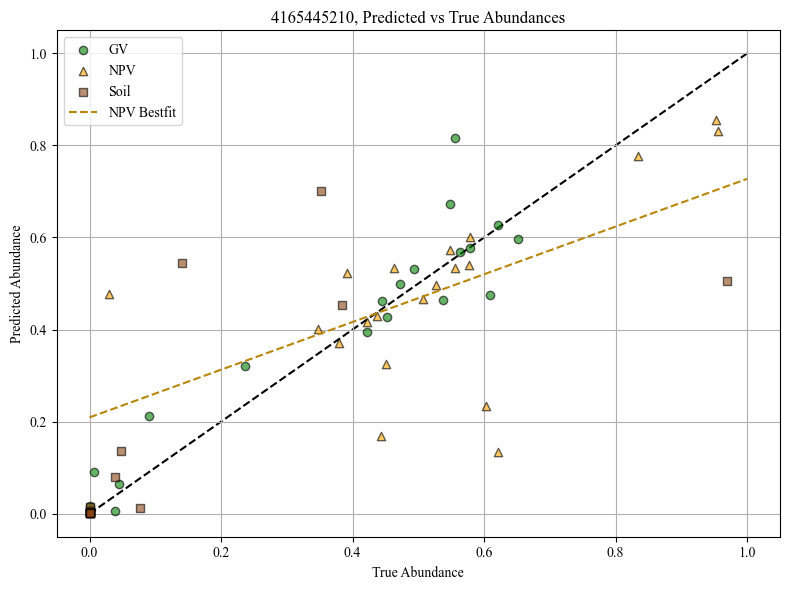

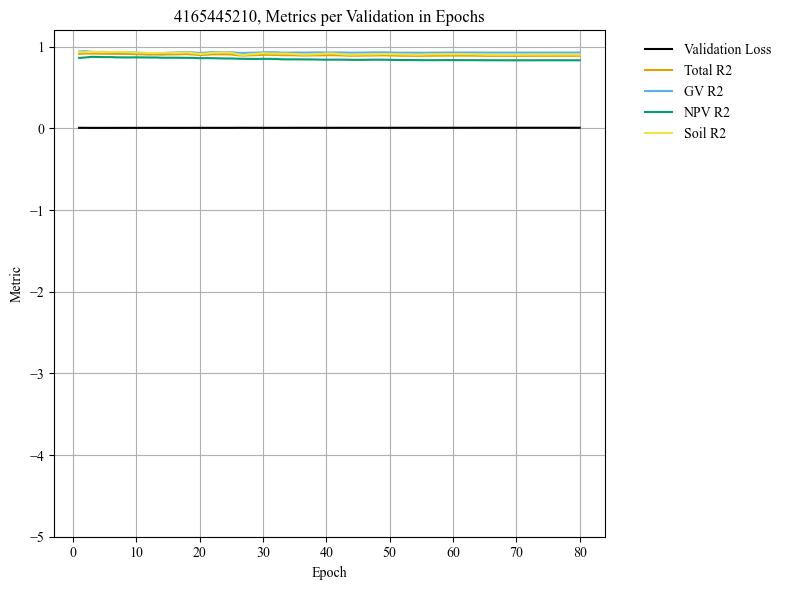

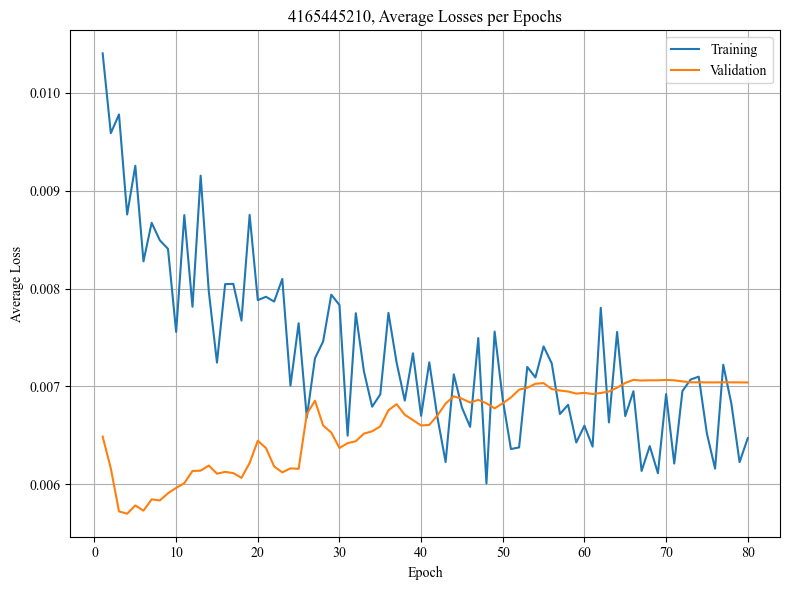

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.005320
Epoch 1/80, Step 2/5, Train Loss: 0.011222
Epoch 1/80, Step 3/5, Train Loss: 0.010766
Epoch 1/80, Step 4/5, Train Loss: 0.011194
Epoch 1/80, Step 5/5, Train Loss: 0.007007
Epoch 1/80 complete. Train Loss: 0.009102, Val Loss: 0.008685
Epoch 2/80, Step 1/5, Train Loss: 0.009850
Epoch 2/80, Step 2/5, Train Loss: 0.007238
Epoch 2/80, Step 3/5, Train Loss: 0.011605
Epoch 2/80, Step 4/5, Train Loss: 0.005748
Epoch 2/80, Step 5/5, Train Loss: 0.006660
Epoch 2/80 complete. Train Loss: 0.008220, Val Loss: 0.008629
Epoch 3/80, Step 1/5, Train Loss: 0.010581
Epoch 3/80, Step 2/5, Train Loss: 0.007364
Epoch 3/80, Step 3/5, Train Loss: 0.006352
Epoch 3/80, Step 4/5, Train Loss: 0.006217
Epoch 3/80, Step 5/5, Train Loss: 0.005568
Epoch 3/80 complete. Train Loss: 0.007216, Val Loss: 0.008458
Epoch 4/80, Step 1/5, Train Loss: 0.007401
Epoch 4/80, Step 2/5, Train Loss: 0.005110
Epoch 4/80, Step 3/5, Train Loss: 0.009157
Epoch 4/80, Step 4/5, Train Loss: 0.0058

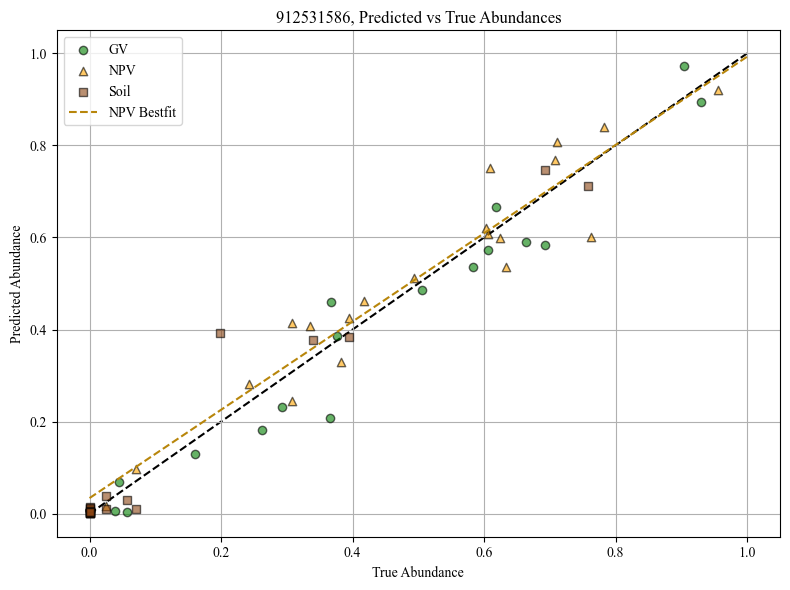

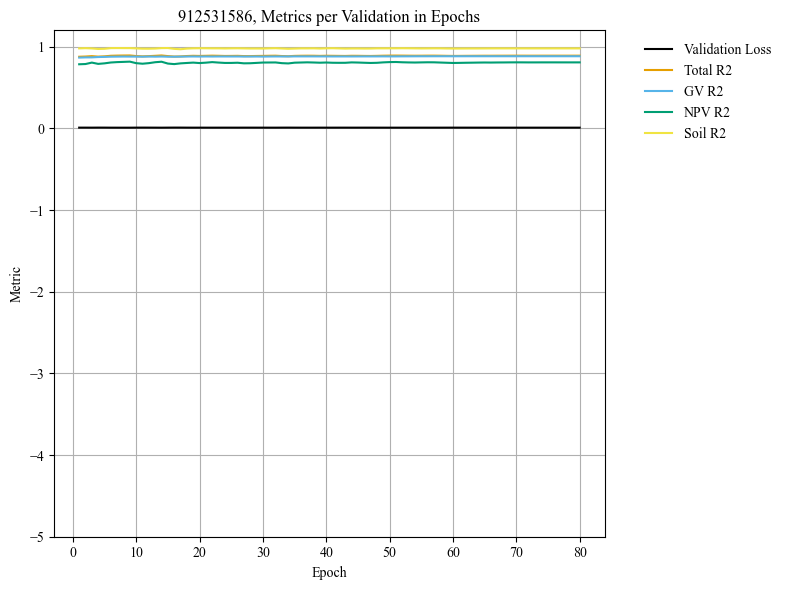

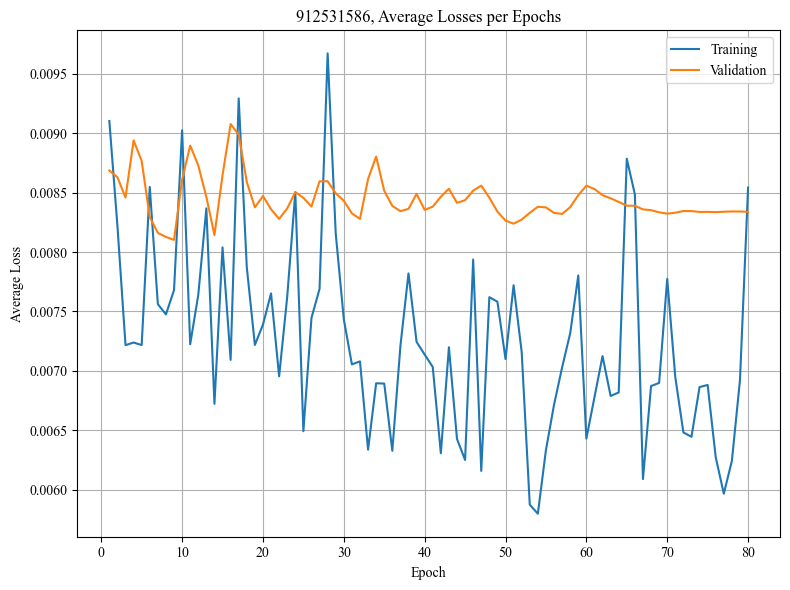

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.008863
Epoch 1/80, Step 2/5, Train Loss: 0.004765
Epoch 1/80, Step 3/5, Train Loss: 0.010642
Epoch 1/80, Step 4/5, Train Loss: 0.010500
Epoch 1/80, Step 5/5, Train Loss: 0.011866
Epoch 1/80 complete. Train Loss: 0.009327, Val Loss: 0.009608
Epoch 2/80, Step 1/5, Train Loss: 0.007954
Epoch 2/80, Step 2/5, Train Loss: 0.006941
Epoch 2/80, Step 3/5, Train Loss: 0.007868
Epoch 2/80, Step 4/5, Train Loss: 0.006561
Epoch 2/80, Step 5/5, Train Loss: 0.011580
Epoch 2/80 complete. Train Loss: 0.008181, Val Loss: 0.009239
Epoch 3/80, Step 1/5, Train Loss: 0.007979
Epoch 3/80, Step 2/5, Train Loss: 0.009342
Epoch 3/80, Step 3/5, Train Loss: 0.004002
Epoch 3/80, Step 4/5, Train Loss: 0.013402
Epoch 3/80, Step 5/5, Train Loss: 0.011872
Epoch 3/80 complete. Train Loss: 0.009319, Val Loss: 0.008968
Epoch 4/80, Step 1/5, Train Loss: 0.009264
Epoch 4/80, Step 2/5, Train Loss: 0.011960
Epoch 4/80, Step 3/5, Train Loss: 0.012996
Epoch 4/80, Step 4/5, Train Loss: 0.0095

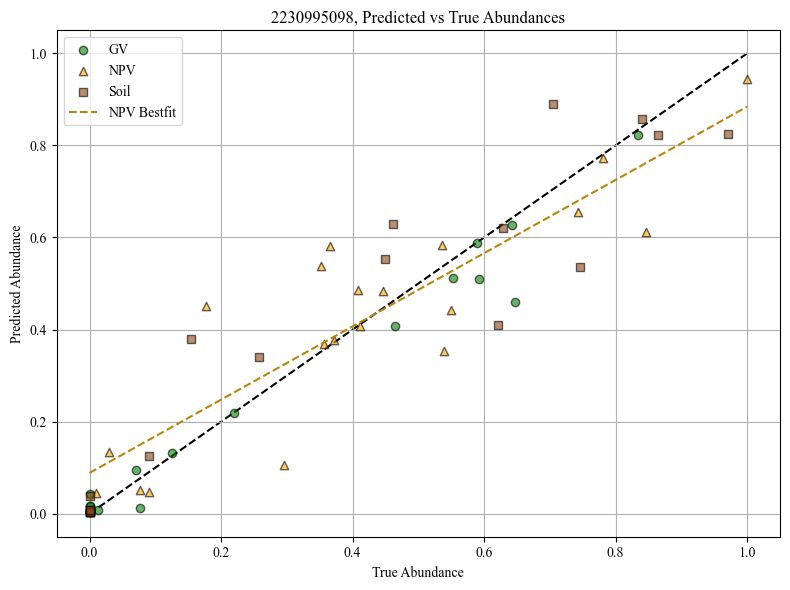

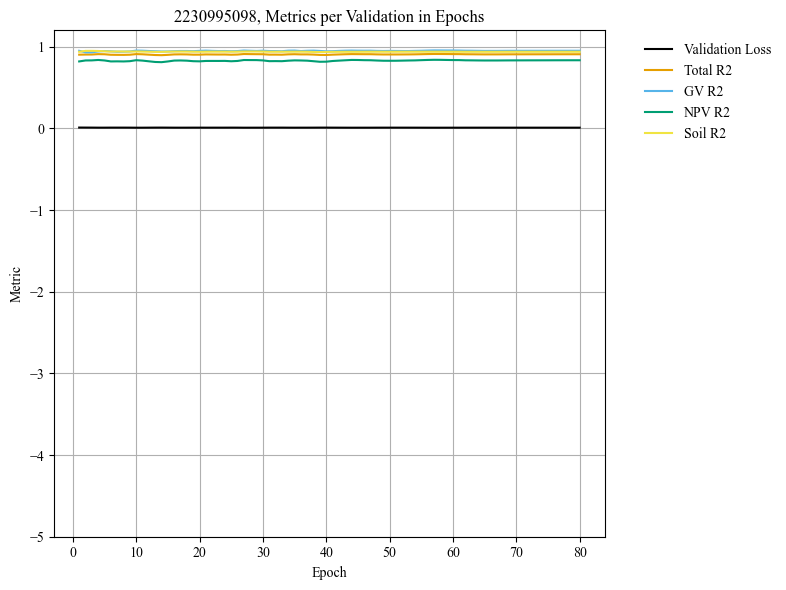

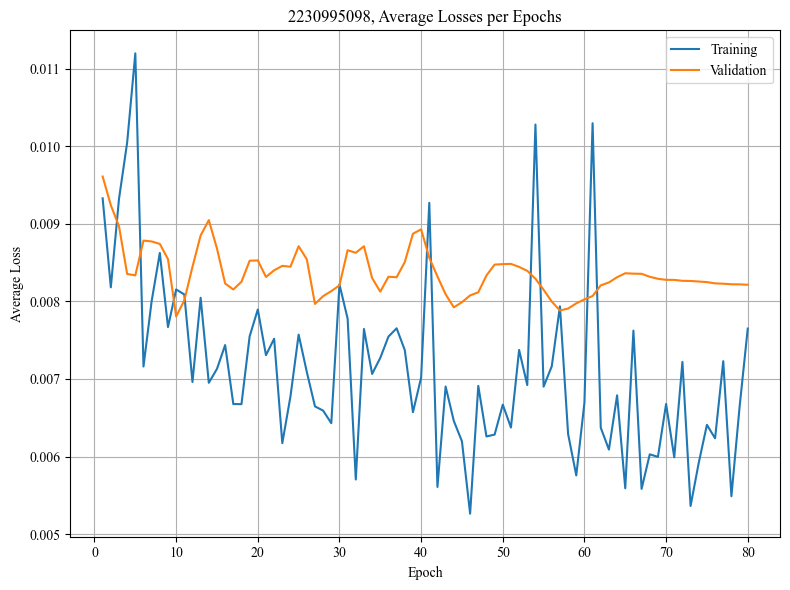

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.010485
Epoch 1/80, Step 2/5, Train Loss: 0.005947
Epoch 1/80, Step 3/5, Train Loss: 0.014232
Epoch 1/80, Step 4/5, Train Loss: 0.010819
Epoch 1/80, Step 5/5, Train Loss: 0.015305
Epoch 1/80 complete. Train Loss: 0.011358, Val Loss: 0.019323
Epoch 2/80, Step 1/5, Train Loss: 0.014364
Epoch 2/80, Step 2/5, Train Loss: 0.010693
Epoch 2/80, Step 3/5, Train Loss: 0.005177
Epoch 2/80, Step 4/5, Train Loss: 0.020434
Epoch 2/80, Step 5/5, Train Loss: 0.011064
Epoch 2/80 complete. Train Loss: 0.012346, Val Loss: 0.021762
Epoch 3/80, Step 1/5, Train Loss: 0.010563
Epoch 3/80, Step 2/5, Train Loss: 0.013974
Epoch 3/80, Step 3/5, Train Loss: 0.012903
Epoch 3/80, Step 4/5, Train Loss: 0.012331
Epoch 3/80, Step 5/5, Train Loss: 0.004897
Epoch 3/80 complete. Train Loss: 0.010934, Val Loss: 0.019755
Epoch 4/80, Step 1/5, Train Loss: 0.016532
Epoch 4/80, Step 2/5, Train Loss: 0.011543
Epoch 4/80, Step 3/5, Train Loss: 0.008752
Epoch 4/80, Step 4/5, Train Loss: 0.0129

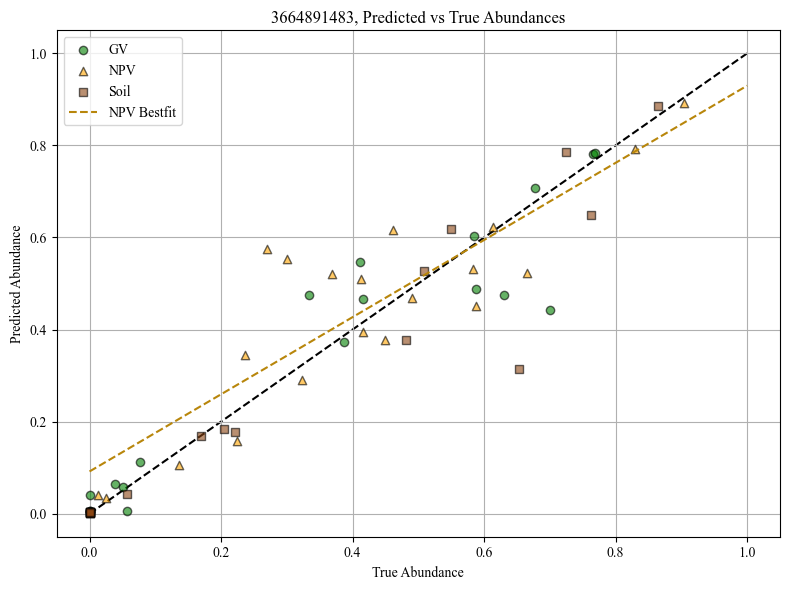

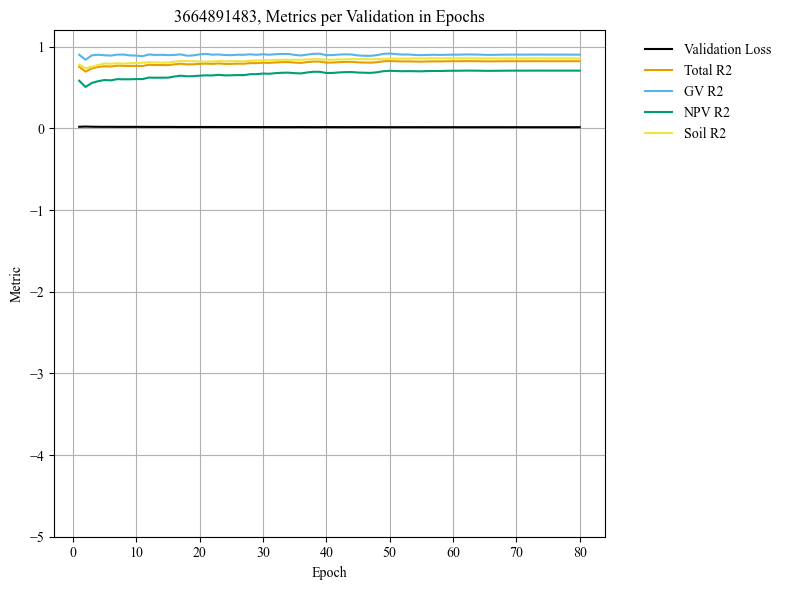

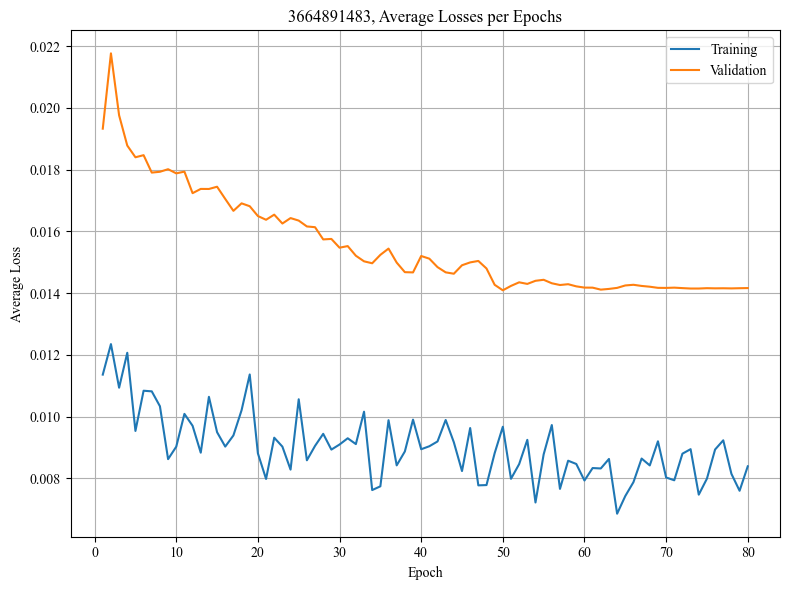

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.010387
Epoch 1/80, Step 2/5, Train Loss: 0.007115
Epoch 1/80, Step 3/5, Train Loss: 0.007115
Epoch 1/80, Step 4/5, Train Loss: 0.008576
Epoch 1/80, Step 5/5, Train Loss: 0.008924
Epoch 1/80 complete. Train Loss: 0.008423, Val Loss: 0.004553
Epoch 2/80, Step 1/5, Train Loss: 0.007760
Epoch 2/80, Step 2/5, Train Loss: 0.005126
Epoch 2/80, Step 3/5, Train Loss: 0.009690
Epoch 2/80, Step 4/5, Train Loss: 0.005138
Epoch 2/80, Step 5/5, Train Loss: 0.007353
Epoch 2/80 complete. Train Loss: 0.007013, Val Loss: 0.004160
Epoch 3/80, Step 1/5, Train Loss: 0.012720
Epoch 3/80, Step 2/5, Train Loss: 0.002770
Epoch 3/80, Step 3/5, Train Loss: 0.007512
Epoch 3/80, Step 4/5, Train Loss: 0.009882
Epoch 3/80, Step 5/5, Train Loss: 0.007209
Epoch 3/80 complete. Train Loss: 0.008019, Val Loss: 0.003842
Epoch 4/80, Step 1/5, Train Loss: 0.005470
Epoch 4/80, Step 2/5, Train Loss: 0.006591
Epoch 4/80, Step 3/5, Train Loss: 0.011806
Epoch 4/80, Step 4/5, Train Loss: 0.0046

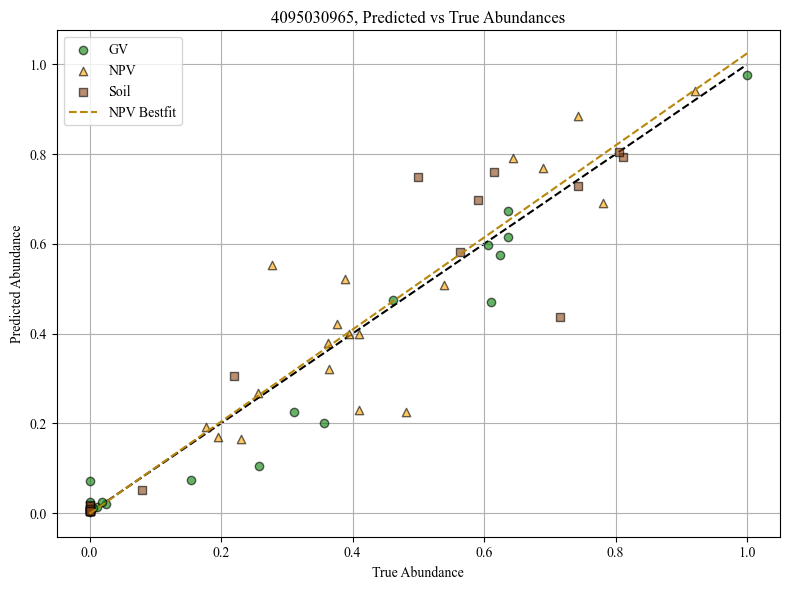

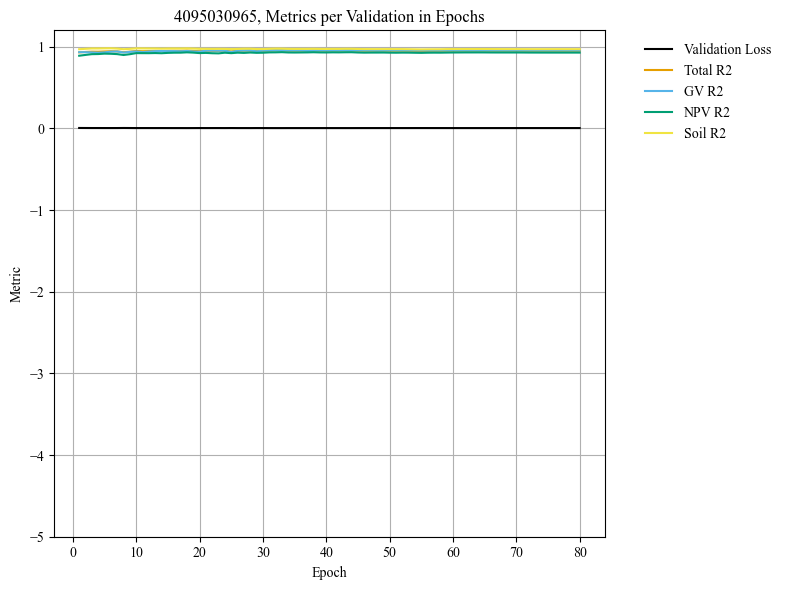

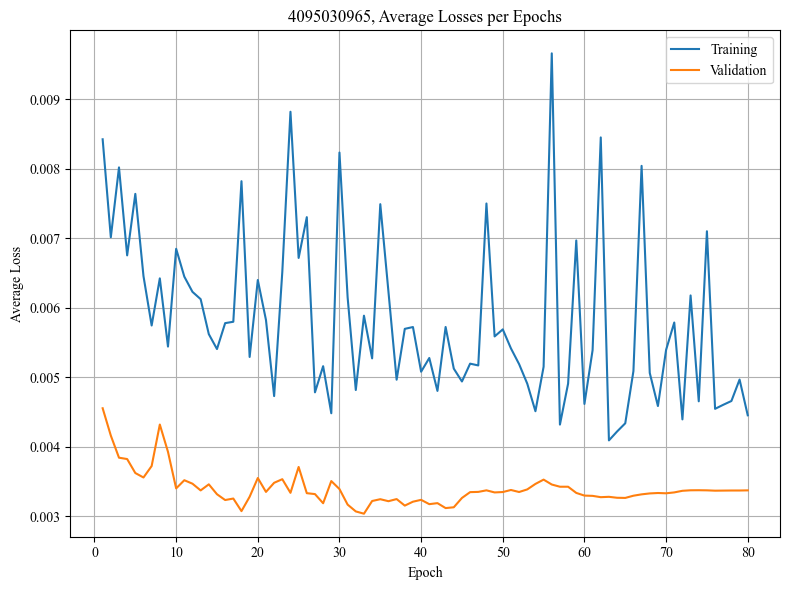

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.015666
Epoch 1/80, Step 2/5, Train Loss: 0.008192
Epoch 1/80, Step 3/5, Train Loss: 0.016340
Epoch 1/80, Step 4/5, Train Loss: 0.007355
Epoch 1/80, Step 5/5, Train Loss: 0.006165
Epoch 1/80 complete. Train Loss: 0.010743, Val Loss: 0.005519
Epoch 2/80, Step 1/5, Train Loss: 0.006789
Epoch 2/80, Step 2/5, Train Loss: 0.009089
Epoch 2/80, Step 3/5, Train Loss: 0.013730
Epoch 2/80, Step 4/5, Train Loss: 0.004519
Epoch 2/80, Step 5/5, Train Loss: 0.010573
Epoch 2/80 complete. Train Loss: 0.008940, Val Loss: 0.005381
Epoch 3/80, Step 1/5, Train Loss: 0.007884
Epoch 3/80, Step 2/5, Train Loss: 0.009301
Epoch 3/80, Step 3/5, Train Loss: 0.006816
Epoch 3/80, Step 4/5, Train Loss: 0.028810
Epoch 3/80, Step 5/5, Train Loss: 0.014041
Epoch 3/80 complete. Train Loss: 0.013371, Val Loss: 0.005559
Epoch 4/80, Step 1/5, Train Loss: 0.009312
Epoch 4/80, Step 2/5, Train Loss: 0.006432
Epoch 4/80, Step 3/5, Train Loss: 0.009100
Epoch 4/80, Step 4/5, Train Loss: 0.0101

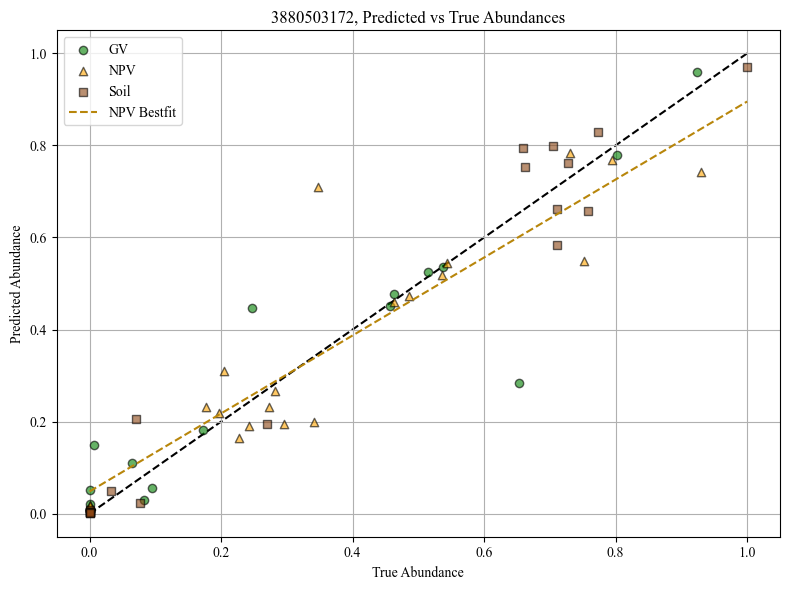

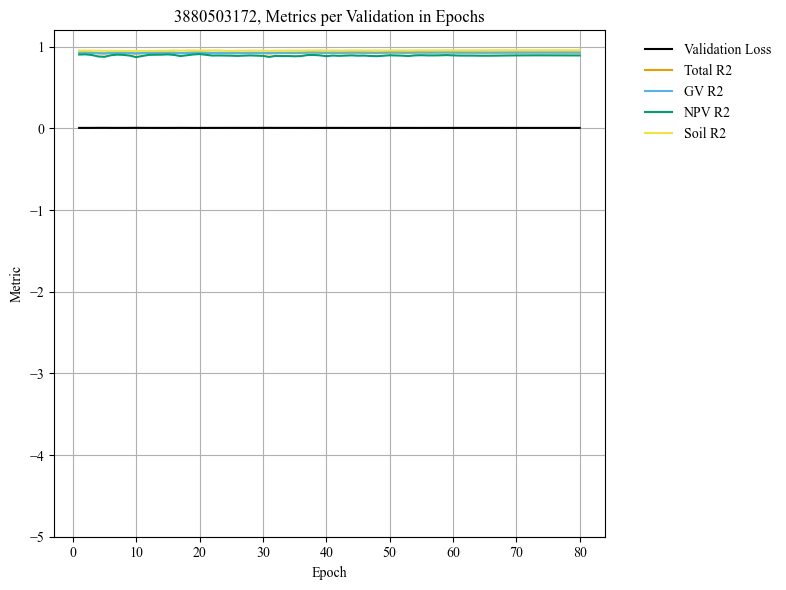

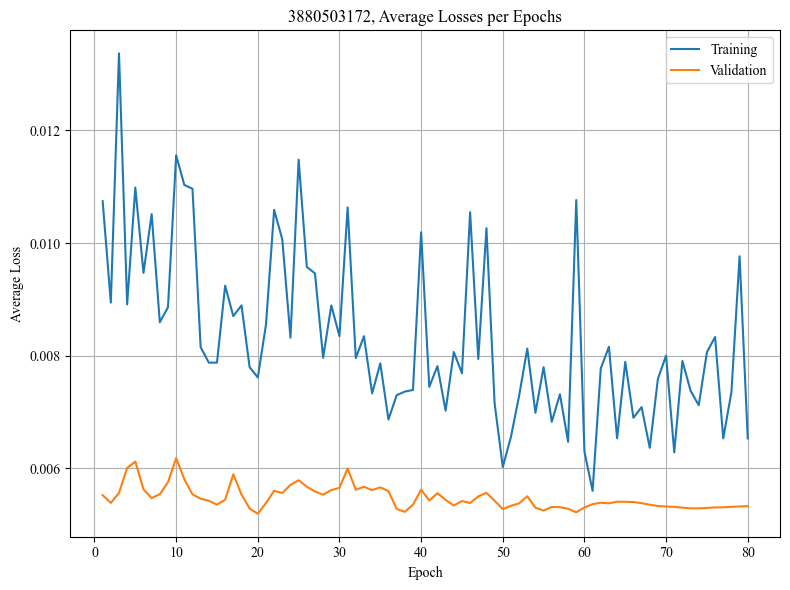

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.006016
Epoch 1/80, Step 2/5, Train Loss: 0.004625
Epoch 1/80, Step 3/5, Train Loss: 0.007101
Epoch 1/80, Step 4/5, Train Loss: 0.007645
Epoch 1/80, Step 5/5, Train Loss: 0.003369
Epoch 1/80 complete. Train Loss: 0.005751, Val Loss: 0.004094
Epoch 2/80, Step 1/5, Train Loss: 0.008651
Epoch 2/80, Step 2/5, Train Loss: 0.004131
Epoch 2/80, Step 3/5, Train Loss: 0.013815
Epoch 2/80, Step 4/5, Train Loss: 0.003252
Epoch 2/80, Step 5/5, Train Loss: 0.006492
Epoch 2/80 complete. Train Loss: 0.007268, Val Loss: 0.003506
Epoch 3/80, Step 1/5, Train Loss: 0.008290
Epoch 3/80, Step 2/5, Train Loss: 0.005883
Epoch 3/80, Step 3/5, Train Loss: 0.003891
Epoch 3/80, Step 4/5, Train Loss: 0.007613
Epoch 3/80, Step 5/5, Train Loss: 0.005061
Epoch 3/80 complete. Train Loss: 0.006148, Val Loss: 0.003297
Epoch 4/80, Step 1/5, Train Loss: 0.009525
Epoch 4/80, Step 2/5, Train Loss: 0.004144
Epoch 4/80, Step 3/5, Train Loss: 0.002686
Epoch 4/80, Step 4/5, Train Loss: 0.0064

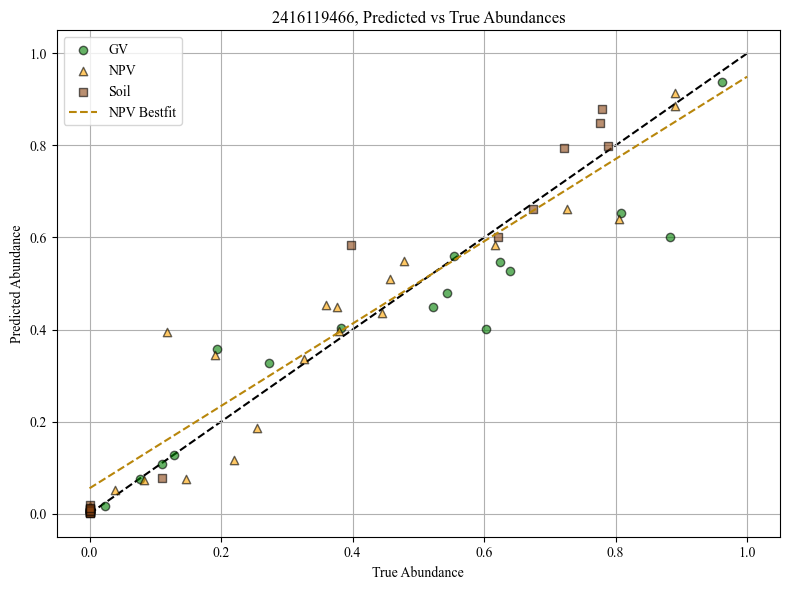

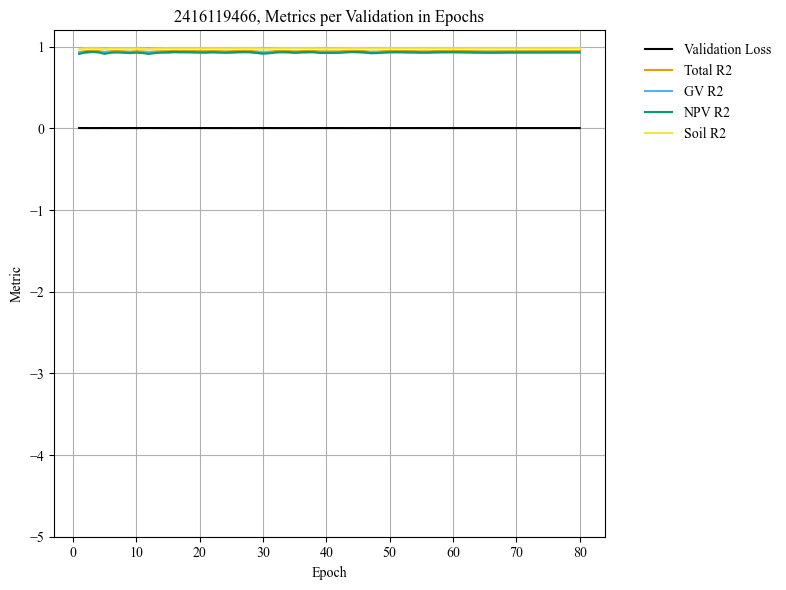

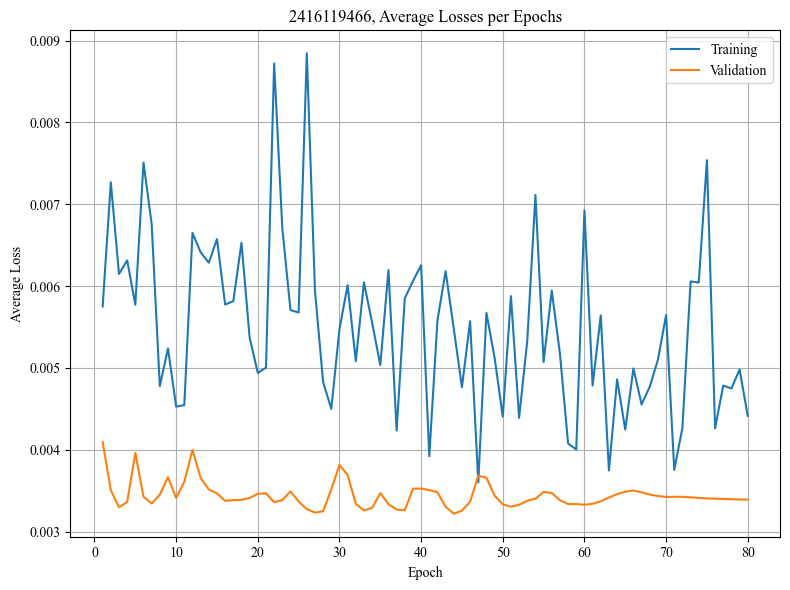

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.018046
Epoch 1/80, Step 2/5, Train Loss: 0.009670
Epoch 1/80, Step 3/5, Train Loss: 0.007431
Epoch 1/80, Step 4/5, Train Loss: 0.009157
Epoch 1/80, Step 5/5, Train Loss: 0.008599
Epoch 1/80 complete. Train Loss: 0.010580, Val Loss: 0.008998
Epoch 2/80, Step 1/5, Train Loss: 0.012890
Epoch 2/80, Step 2/5, Train Loss: 0.013874
Epoch 2/80, Step 3/5, Train Loss: 0.009753
Epoch 2/80, Step 4/5, Train Loss: 0.007826
Epoch 2/80, Step 5/5, Train Loss: 0.013243
Epoch 2/80 complete. Train Loss: 0.011517, Val Loss: 0.008772
Epoch 3/80, Step 1/5, Train Loss: 0.016547
Epoch 3/80, Step 2/5, Train Loss: 0.005995
Epoch 3/80, Step 3/5, Train Loss: 0.005611
Epoch 3/80, Step 4/5, Train Loss: 0.009968
Epoch 3/80, Step 5/5, Train Loss: 0.008490
Epoch 3/80 complete. Train Loss: 0.009322, Val Loss: 0.008419
Epoch 4/80, Step 1/5, Train Loss: 0.009294
Epoch 4/80, Step 2/5, Train Loss: 0.012462
Epoch 4/80, Step 3/5, Train Loss: 0.012892
Epoch 4/80, Step 4/5, Train Loss: 0.0111

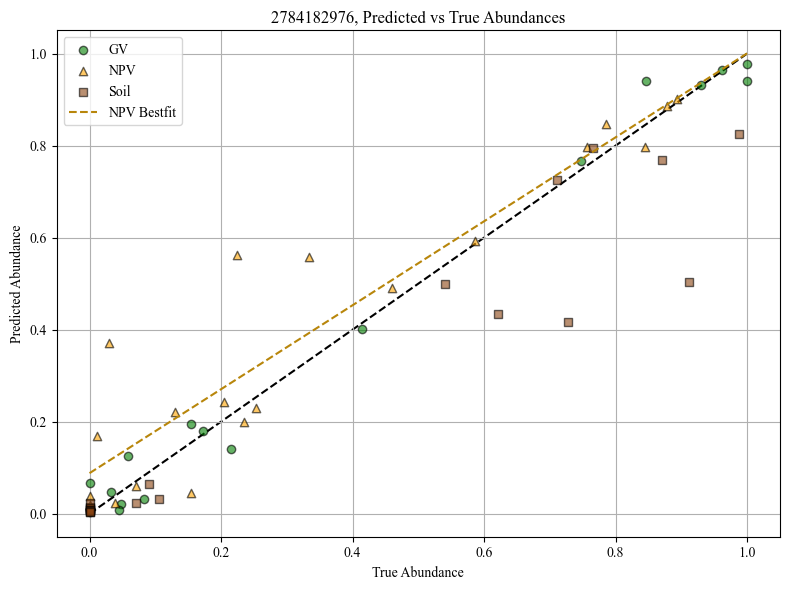

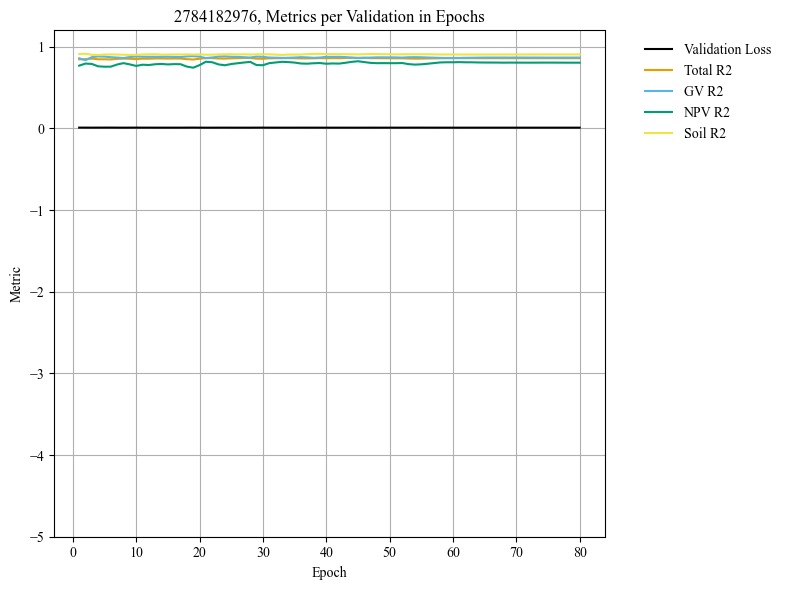

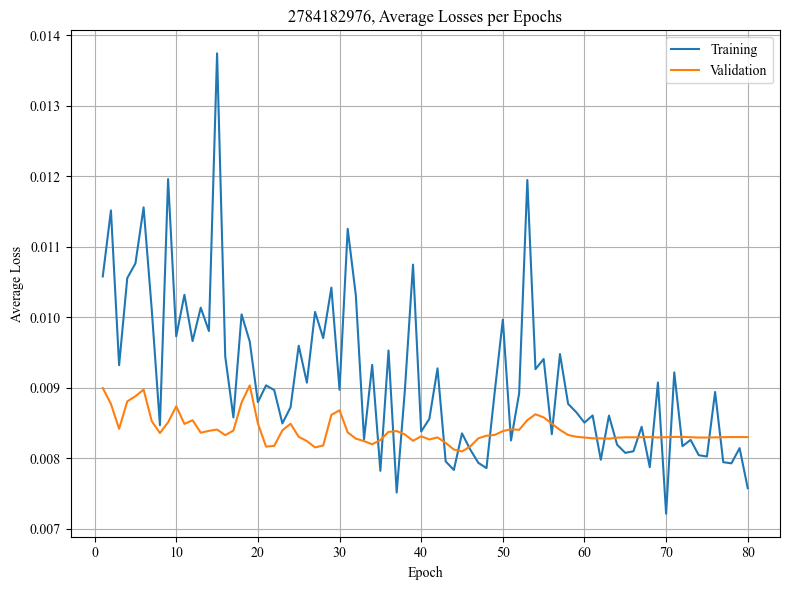

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.007841
Epoch 1/80, Step 2/5, Train Loss: 0.015536
Epoch 1/80, Step 3/5, Train Loss: 0.008798
Epoch 1/80, Step 4/5, Train Loss: 0.005470
Epoch 1/80, Step 5/5, Train Loss: 0.017837
Epoch 1/80 complete. Train Loss: 0.011096, Val Loss: 0.011493
Epoch 2/80, Step 1/5, Train Loss: 0.034184
Epoch 2/80, Step 2/5, Train Loss: 0.003999
Epoch 2/80, Step 3/5, Train Loss: 0.014378
Epoch 2/80, Step 4/5, Train Loss: 0.009094
Epoch 2/80, Step 5/5, Train Loss: 0.006513
Epoch 2/80 complete. Train Loss: 0.013634, Val Loss: 0.012002
Epoch 3/80, Step 1/5, Train Loss: 0.007528
Epoch 3/80, Step 2/5, Train Loss: 0.007686
Epoch 3/80, Step 3/5, Train Loss: 0.012066
Epoch 3/80, Step 4/5, Train Loss: 0.008128
Epoch 3/80, Step 5/5, Train Loss: 0.003234
Epoch 3/80 complete. Train Loss: 0.007728, Val Loss: 0.011052
Epoch 4/80, Step 1/5, Train Loss: 0.010337
Epoch 4/80, Step 2/5, Train Loss: 0.005508
Epoch 4/80, Step 3/5, Train Loss: 0.005907
Epoch 4/80, Step 4/5, Train Loss: 0.0359

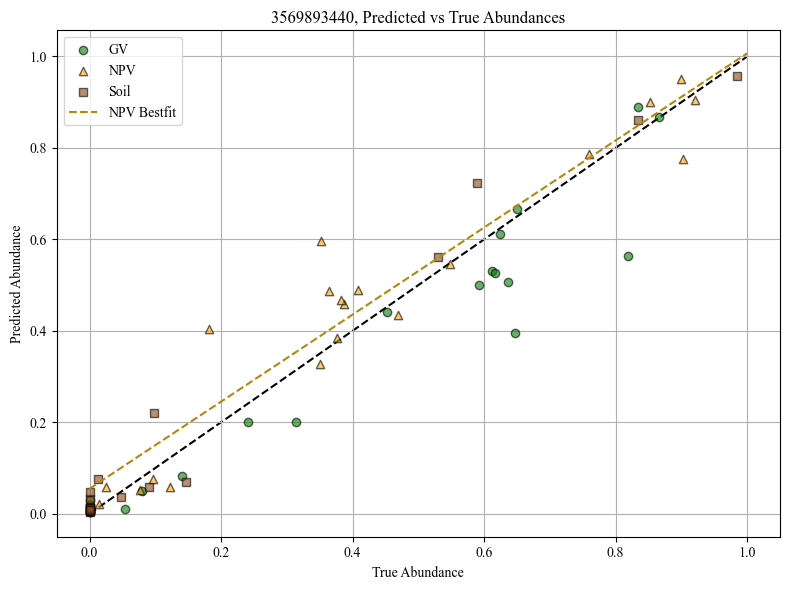

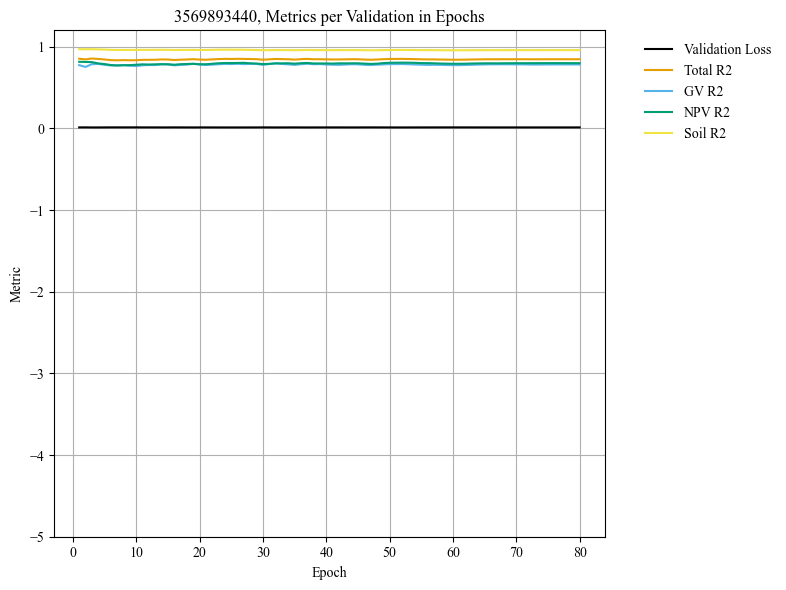

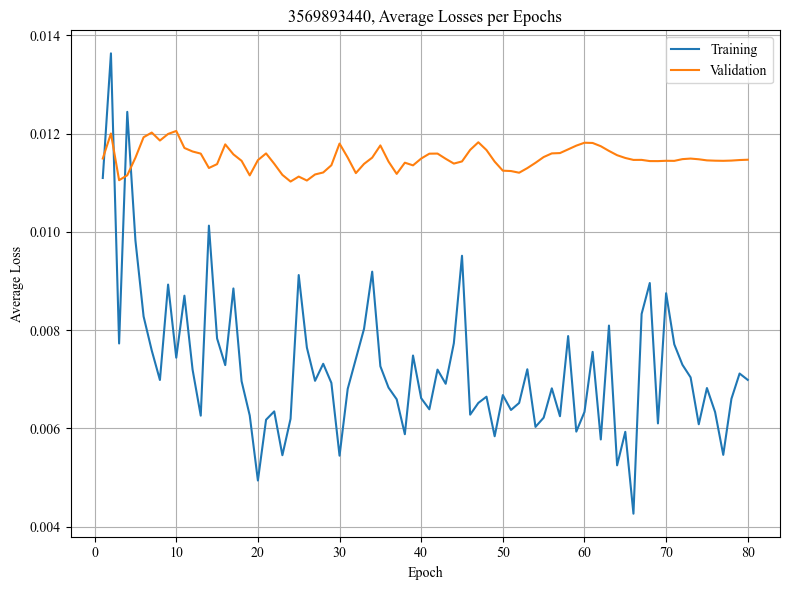

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.010832
Epoch 1/80, Step 2/5, Train Loss: 0.008766
Epoch 1/80, Step 3/5, Train Loss: 0.003980
Epoch 1/80, Step 4/5, Train Loss: 0.009203
Epoch 1/80, Step 5/5, Train Loss: 0.003947
Epoch 1/80 complete. Train Loss: 0.007346, Val Loss: 0.004618
Epoch 2/80, Step 1/5, Train Loss: 0.005399
Epoch 2/80, Step 2/5, Train Loss: 0.002787
Epoch 2/80, Step 3/5, Train Loss: 0.009034
Epoch 2/80, Step 4/5, Train Loss: 0.005993
Epoch 2/80, Step 5/5, Train Loss: 0.014090
Epoch 2/80 complete. Train Loss: 0.007461, Val Loss: 0.005295
Epoch 3/80, Step 1/5, Train Loss: 0.005351
Epoch 3/80, Step 2/5, Train Loss: 0.011603
Epoch 3/80, Step 3/5, Train Loss: 0.007013
Epoch 3/80, Step 4/5, Train Loss: 0.005521
Epoch 3/80, Step 5/5, Train Loss: 0.005092
Epoch 3/80 complete. Train Loss: 0.006916, Val Loss: 0.005806
Epoch 4/80, Step 1/5, Train Loss: 0.003686
Epoch 4/80, Step 2/5, Train Loss: 0.008605
Epoch 4/80, Step 3/5, Train Loss: 0.004995
Epoch 4/80, Step 4/5, Train Loss: 0.0095

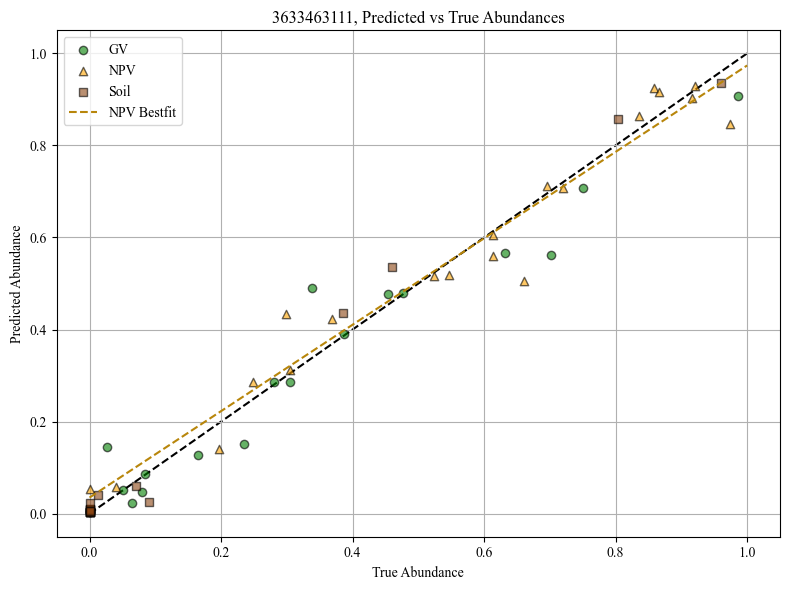

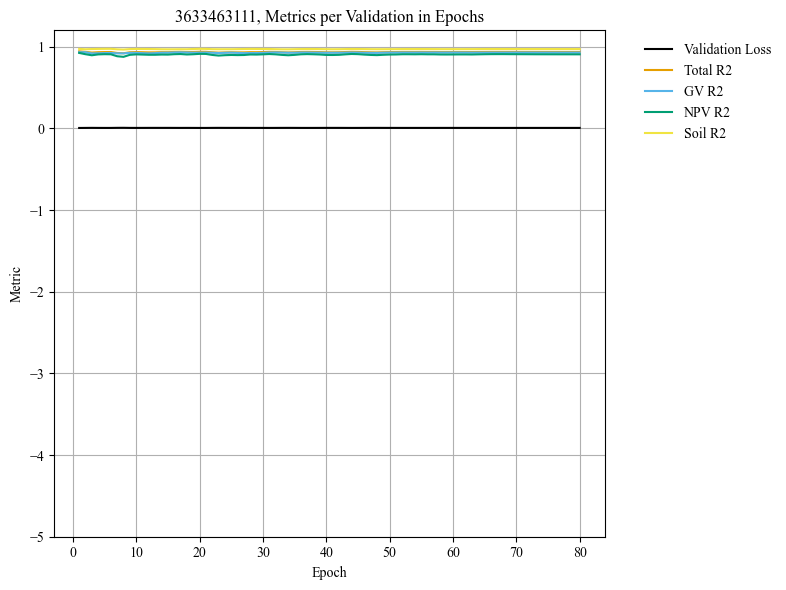

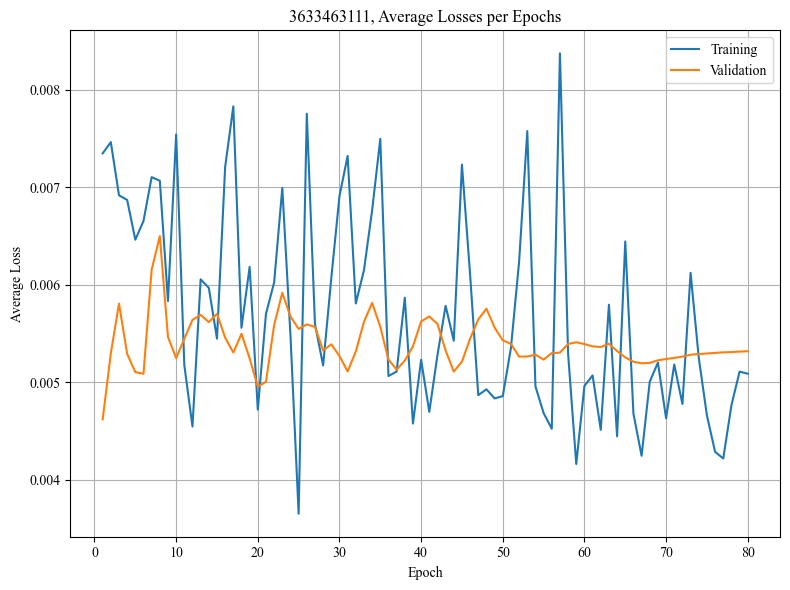

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.010202
Epoch 1/80, Step 2/5, Train Loss: 0.011826
Epoch 1/80, Step 3/5, Train Loss: 0.007830
Epoch 1/80, Step 4/5, Train Loss: 0.008347
Epoch 1/80, Step 5/5, Train Loss: 0.008561
Epoch 1/80 complete. Train Loss: 0.009353, Val Loss: 0.006621
Epoch 2/80, Step 1/5, Train Loss: 0.010711
Epoch 2/80, Step 2/5, Train Loss: 0.012101
Epoch 2/80, Step 3/5, Train Loss: 0.008407
Epoch 2/80, Step 4/5, Train Loss: 0.009772
Epoch 2/80, Step 5/5, Train Loss: 0.008914
Epoch 2/80 complete. Train Loss: 0.009981, Val Loss: 0.006919
Epoch 3/80, Step 1/5, Train Loss: 0.012151
Epoch 3/80, Step 2/5, Train Loss: 0.006084
Epoch 3/80, Step 3/5, Train Loss: 0.006012
Epoch 3/80, Step 4/5, Train Loss: 0.010267
Epoch 3/80, Step 5/5, Train Loss: 0.008037
Epoch 3/80 complete. Train Loss: 0.008510, Val Loss: 0.007976
Epoch 4/80, Step 1/5, Train Loss: 0.013707
Epoch 4/80, Step 2/5, Train Loss: 0.003236
Epoch 4/80, Step 3/5, Train Loss: 0.007749
Epoch 4/80, Step 4/5, Train Loss: 0.0078

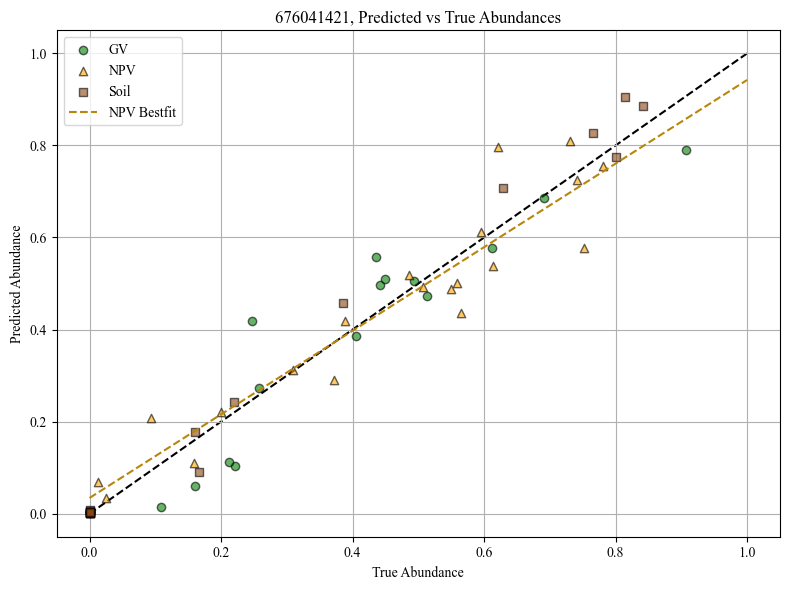

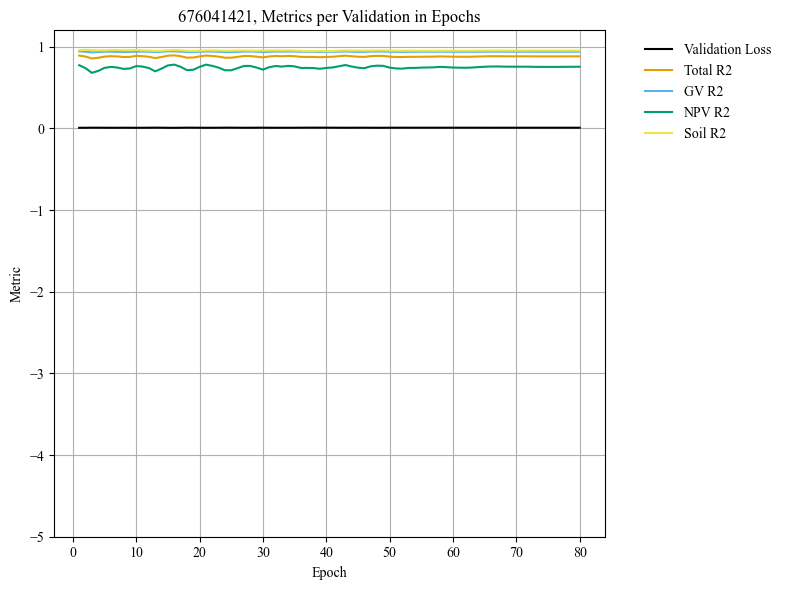

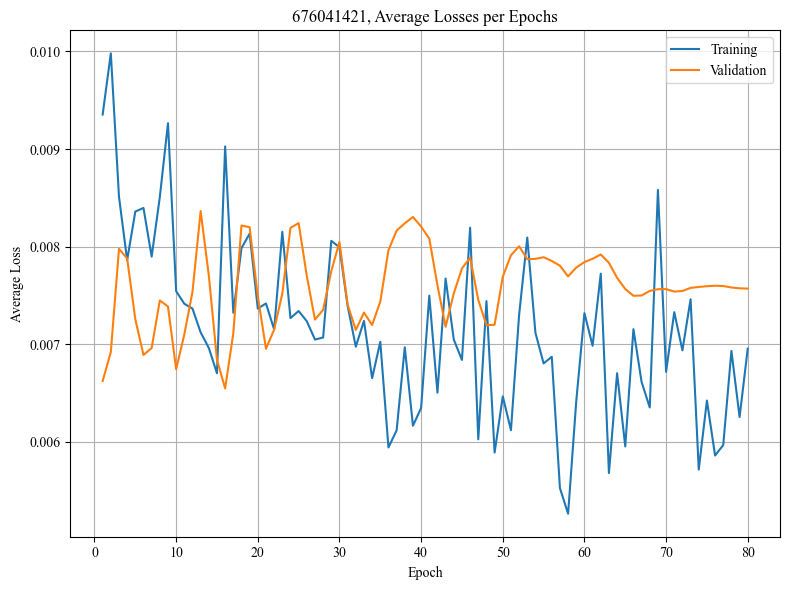

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.012705
Epoch 1/80, Step 2/5, Train Loss: 0.006881
Epoch 1/80, Step 3/5, Train Loss: 0.009607
Epoch 1/80, Step 4/5, Train Loss: 0.005514
Epoch 1/80, Step 5/5, Train Loss: 0.007932
Epoch 1/80 complete. Train Loss: 0.008528, Val Loss: 0.016125
Epoch 2/80, Step 1/5, Train Loss: 0.013883
Epoch 2/80, Step 2/5, Train Loss: 0.017287
Epoch 2/80, Step 3/5, Train Loss: 0.007903
Epoch 2/80, Step 4/5, Train Loss: 0.010382
Epoch 2/80, Step 5/5, Train Loss: 0.005497
Epoch 2/80 complete. Train Loss: 0.010990, Val Loss: 0.016014
Epoch 3/80, Step 1/5, Train Loss: 0.015783
Epoch 3/80, Step 2/5, Train Loss: 0.011043
Epoch 3/80, Step 3/5, Train Loss: 0.009866
Epoch 3/80, Step 4/5, Train Loss: 0.010819
Epoch 3/80, Step 5/5, Train Loss: 0.009238
Epoch 3/80 complete. Train Loss: 0.011350, Val Loss: 0.016821
Epoch 4/80, Step 1/5, Train Loss: 0.009410
Epoch 4/80, Step 2/5, Train Loss: 0.010015
Epoch 4/80, Step 3/5, Train Loss: 0.005203
Epoch 4/80, Step 4/5, Train Loss: 0.0092

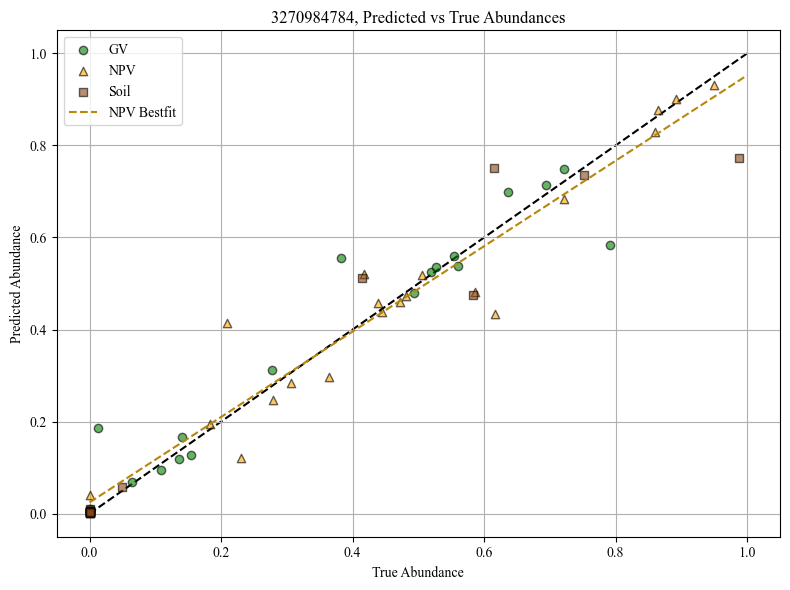

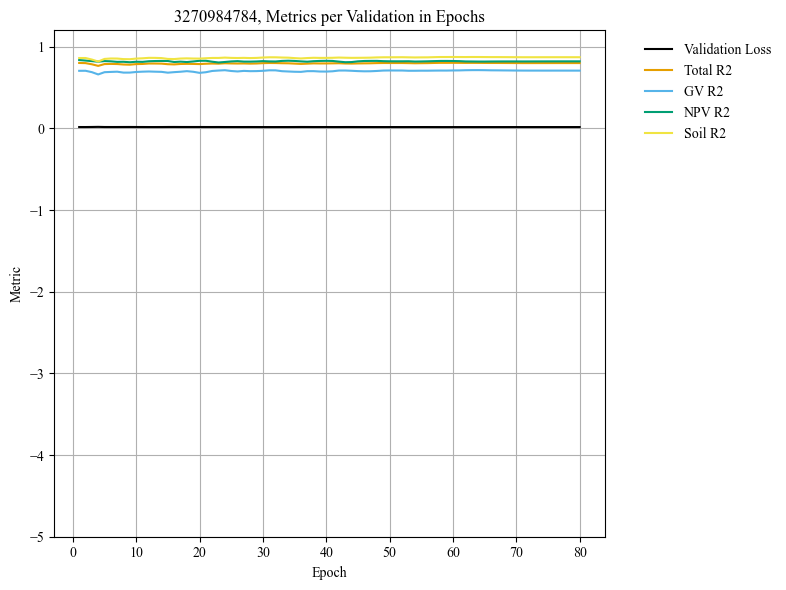

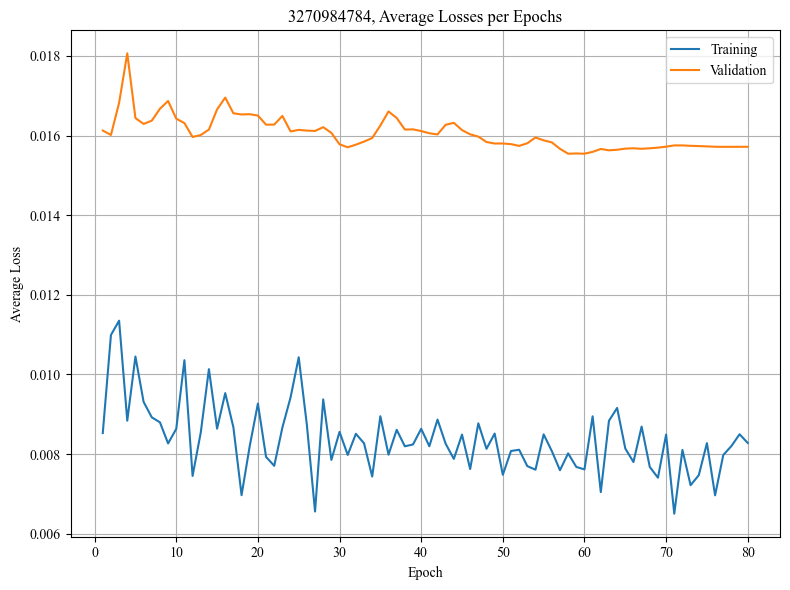

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.018637
Epoch 1/80, Step 2/5, Train Loss: 0.004380
Epoch 1/80, Step 3/5, Train Loss: 0.009771
Epoch 1/80, Step 4/5, Train Loss: 0.005545
Epoch 1/80, Step 5/5, Train Loss: 0.006624
Epoch 1/80 complete. Train Loss: 0.008991, Val Loss: 0.010032
Epoch 2/80, Step 1/5, Train Loss: 0.005860
Epoch 2/80, Step 2/5, Train Loss: 0.009896
Epoch 2/80, Step 3/5, Train Loss: 0.006135
Epoch 2/80, Step 4/5, Train Loss: 0.009241
Epoch 2/80, Step 5/5, Train Loss: 0.015240
Epoch 2/80 complete. Train Loss: 0.009274, Val Loss: 0.010593
Epoch 3/80, Step 1/5, Train Loss: 0.007976
Epoch 3/80, Step 2/5, Train Loss: 0.015792
Epoch 3/80, Step 3/5, Train Loss: 0.009603
Epoch 3/80, Step 4/5, Train Loss: 0.003112
Epoch 3/80, Step 5/5, Train Loss: 0.008854
Epoch 3/80 complete. Train Loss: 0.009067, Val Loss: 0.010947
Epoch 4/80, Step 1/5, Train Loss: 0.005836
Epoch 4/80, Step 2/5, Train Loss: 0.003740
Epoch 4/80, Step 3/5, Train Loss: 0.008711
Epoch 4/80, Step 4/5, Train Loss: 0.0044

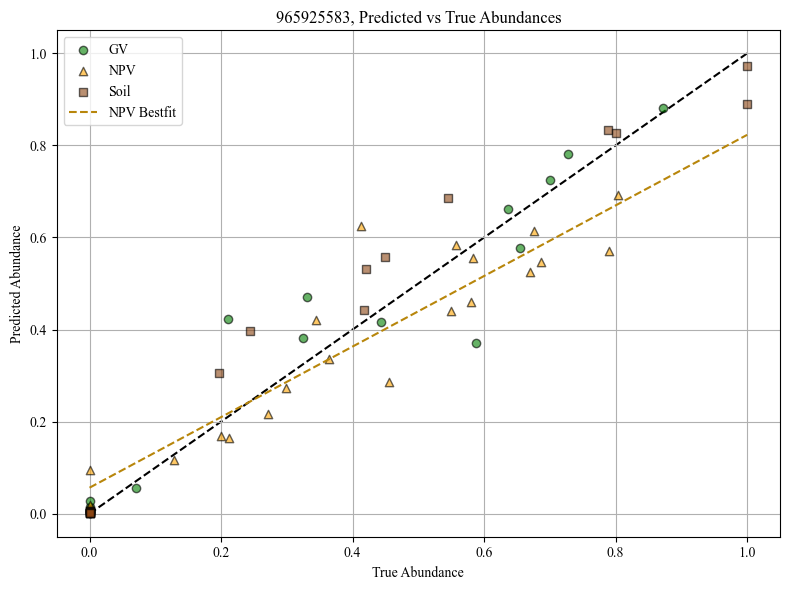

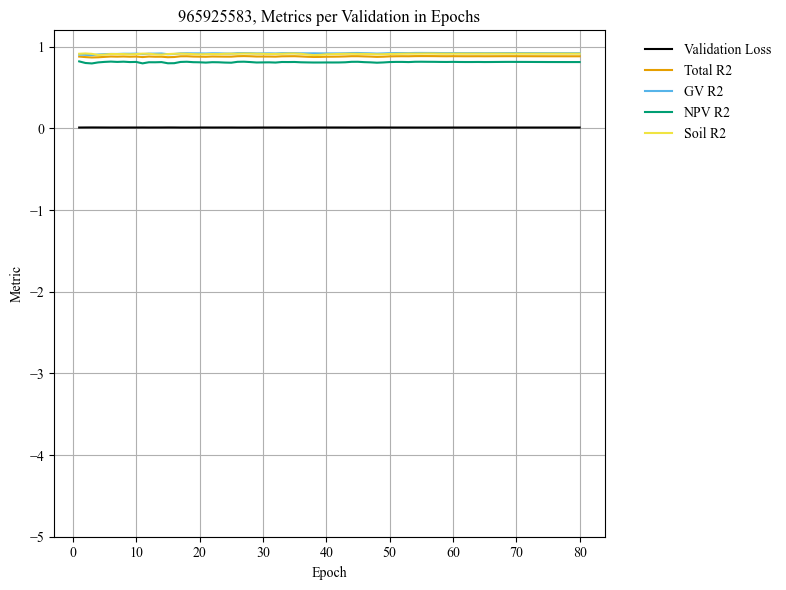

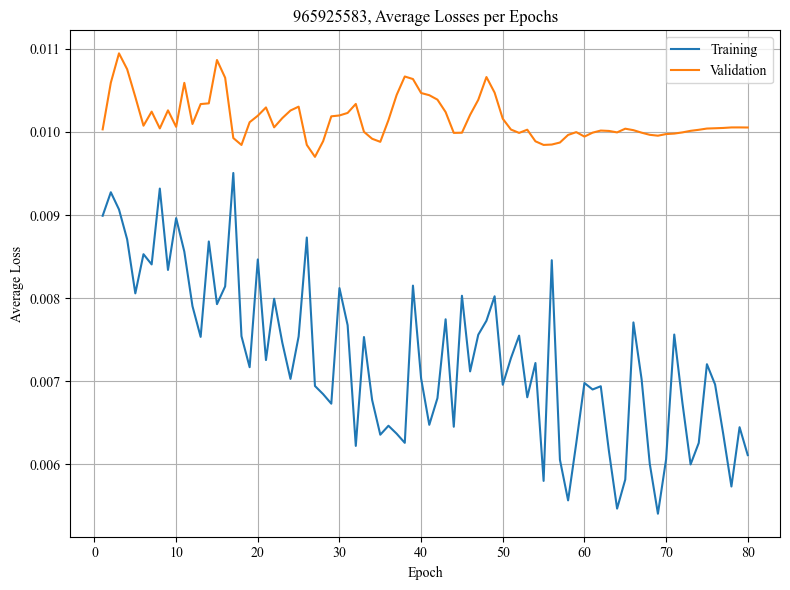

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.007022
Epoch 1/80, Step 2/5, Train Loss: 0.007048
Epoch 1/80, Step 3/5, Train Loss: 0.009973
Epoch 1/80, Step 4/5, Train Loss: 0.008092
Epoch 1/80, Step 5/5, Train Loss: 0.008870
Epoch 1/80 complete. Train Loss: 0.008201, Val Loss: 0.005933
Epoch 2/80, Step 1/5, Train Loss: 0.003268
Epoch 2/80, Step 2/5, Train Loss: 0.008295
Epoch 2/80, Step 3/5, Train Loss: 0.007432
Epoch 2/80, Step 4/5, Train Loss: 0.011661
Epoch 2/80, Step 5/5, Train Loss: 0.005051
Epoch 2/80 complete. Train Loss: 0.007141, Val Loss: 0.006444
Epoch 3/80, Step 1/5, Train Loss: 0.005282
Epoch 3/80, Step 2/5, Train Loss: 0.005318
Epoch 3/80, Step 3/5, Train Loss: 0.010750
Epoch 3/80, Step 4/5, Train Loss: 0.004117
Epoch 3/80, Step 5/5, Train Loss: 0.006949
Epoch 3/80 complete. Train Loss: 0.006483, Val Loss: 0.007000
Epoch 4/80, Step 1/5, Train Loss: 0.002309
Epoch 4/80, Step 2/5, Train Loss: 0.008335
Epoch 4/80, Step 3/5, Train Loss: 0.006041
Epoch 4/80, Step 4/5, Train Loss: 0.0064

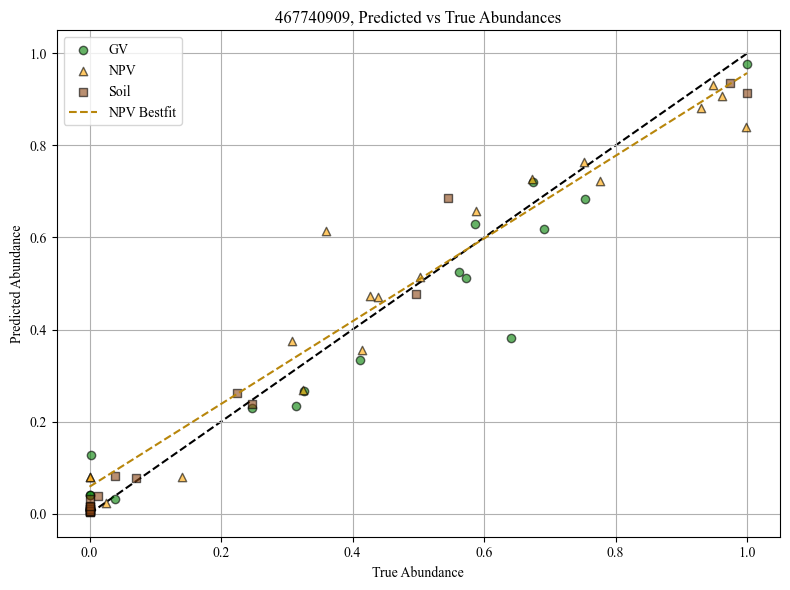

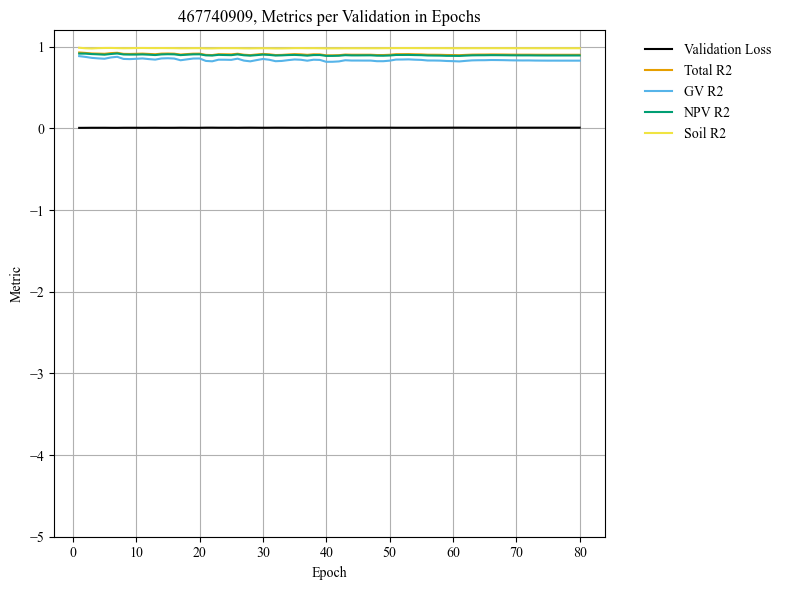

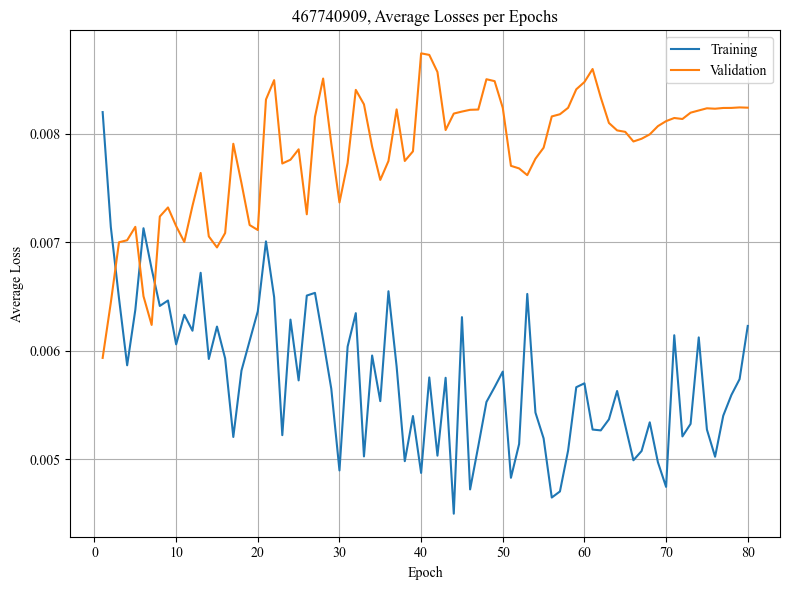

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.012554
Epoch 1/80, Step 2/5, Train Loss: 0.009574
Epoch 1/80, Step 3/5, Train Loss: 0.013191
Epoch 1/80, Step 4/5, Train Loss: 0.007699
Epoch 1/80, Step 5/5, Train Loss: 0.018126
Epoch 1/80 complete. Train Loss: 0.012229, Val Loss: 0.007523
Epoch 2/80, Step 1/5, Train Loss: 0.012159
Epoch 2/80, Step 2/5, Train Loss: 0.020898
Epoch 2/80, Step 3/5, Train Loss: 0.007995
Epoch 2/80, Step 4/5, Train Loss: 0.013162
Epoch 2/80, Step 5/5, Train Loss: 0.007878
Epoch 2/80 complete. Train Loss: 0.012418, Val Loss: 0.007719
Epoch 3/80, Step 1/5, Train Loss: 0.006450
Epoch 3/80, Step 2/5, Train Loss: 0.016771
Epoch 3/80, Step 3/5, Train Loss: 0.008632
Epoch 3/80, Step 4/5, Train Loss: 0.011326
Epoch 3/80, Step 5/5, Train Loss: 0.012920
Epoch 3/80 complete. Train Loss: 0.011219, Val Loss: 0.007491
Epoch 4/80, Step 1/5, Train Loss: 0.015066
Epoch 4/80, Step 2/5, Train Loss: 0.006069
Epoch 4/80, Step 3/5, Train Loss: 0.006843
Epoch 4/80, Step 4/5, Train Loss: 0.0102

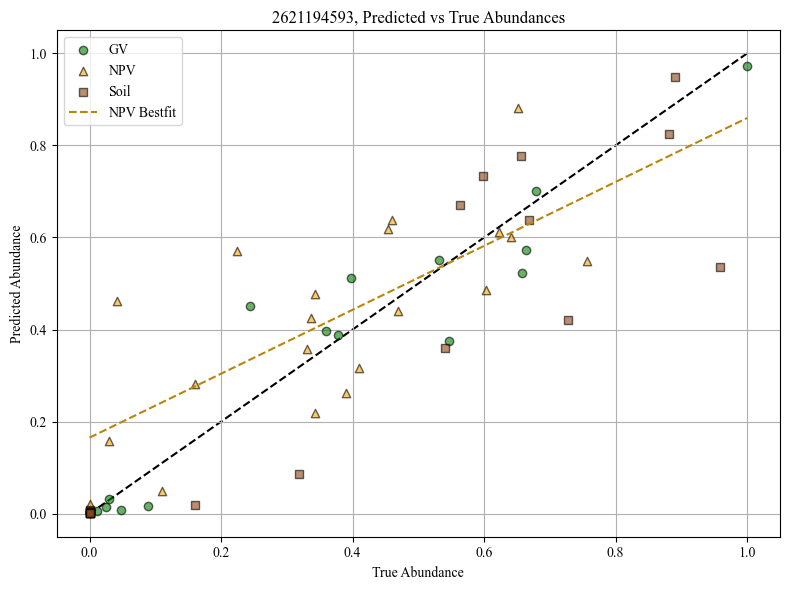

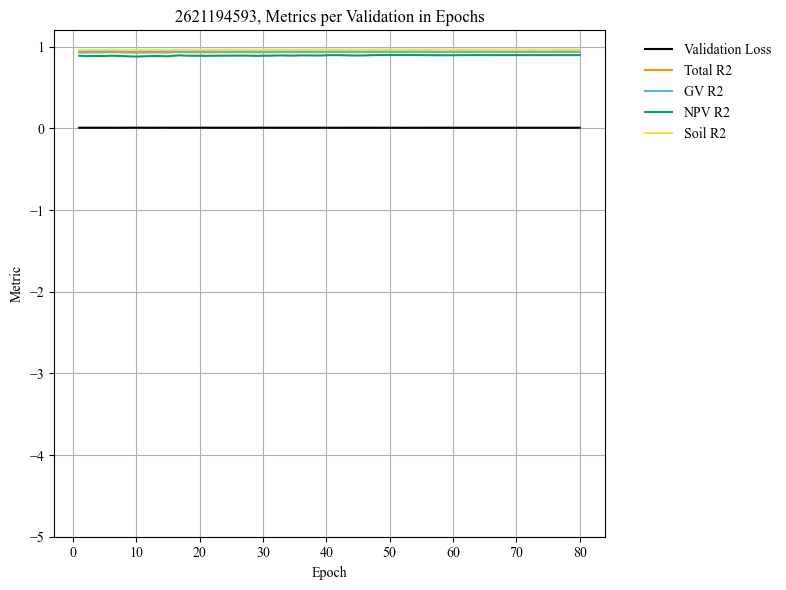

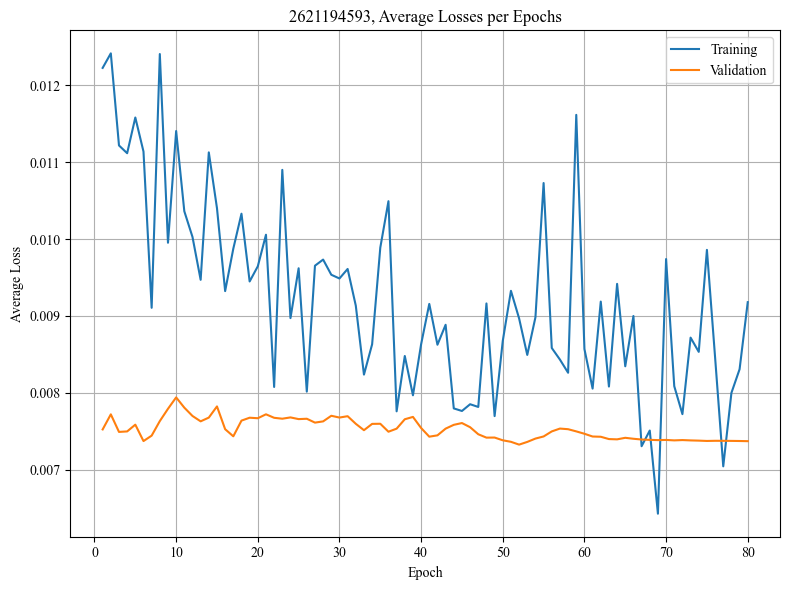

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.008907
Epoch 1/80, Step 2/5, Train Loss: 0.016237
Epoch 1/80, Step 3/5, Train Loss: 0.010009
Epoch 1/80, Step 4/5, Train Loss: 0.007981
Epoch 1/80, Step 5/5, Train Loss: 0.003880
Epoch 1/80 complete. Train Loss: 0.009403, Val Loss: 0.006073
Epoch 2/80, Step 1/5, Train Loss: 0.009161
Epoch 2/80, Step 2/5, Train Loss: 0.007673
Epoch 2/80, Step 3/5, Train Loss: 0.005468
Epoch 2/80, Step 4/5, Train Loss: 0.006871
Epoch 2/80, Step 5/5, Train Loss: 0.008442
Epoch 2/80 complete. Train Loss: 0.007523, Val Loss: 0.005883
Epoch 3/80, Step 1/5, Train Loss: 0.007996
Epoch 3/80, Step 2/5, Train Loss: 0.005324
Epoch 3/80, Step 3/5, Train Loss: 0.009134
Epoch 3/80, Step 4/5, Train Loss: 0.008512
Epoch 3/80, Step 5/5, Train Loss: 0.007976
Epoch 3/80 complete. Train Loss: 0.007788, Val Loss: 0.005936
Epoch 4/80, Step 1/5, Train Loss: 0.010622
Epoch 4/80, Step 2/5, Train Loss: 0.002893
Epoch 4/80, Step 3/5, Train Loss: 0.006388
Epoch 4/80, Step 4/5, Train Loss: 0.0075

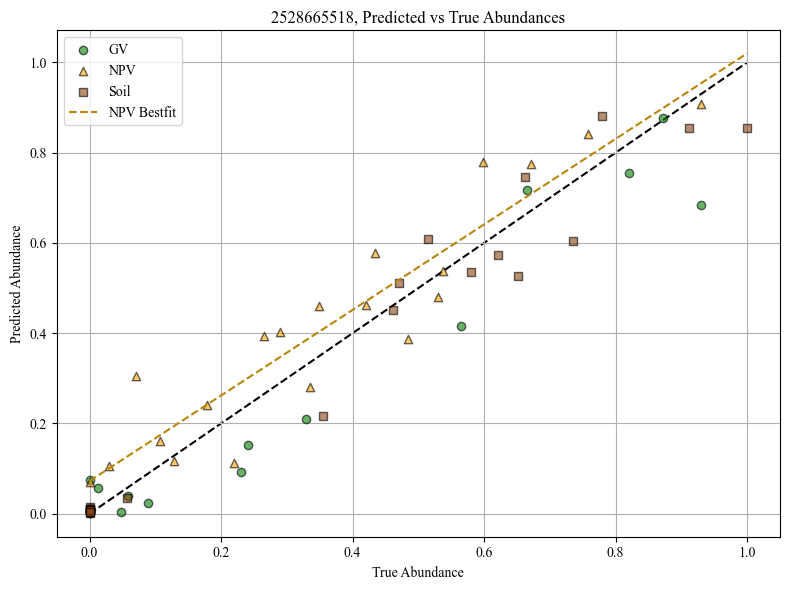

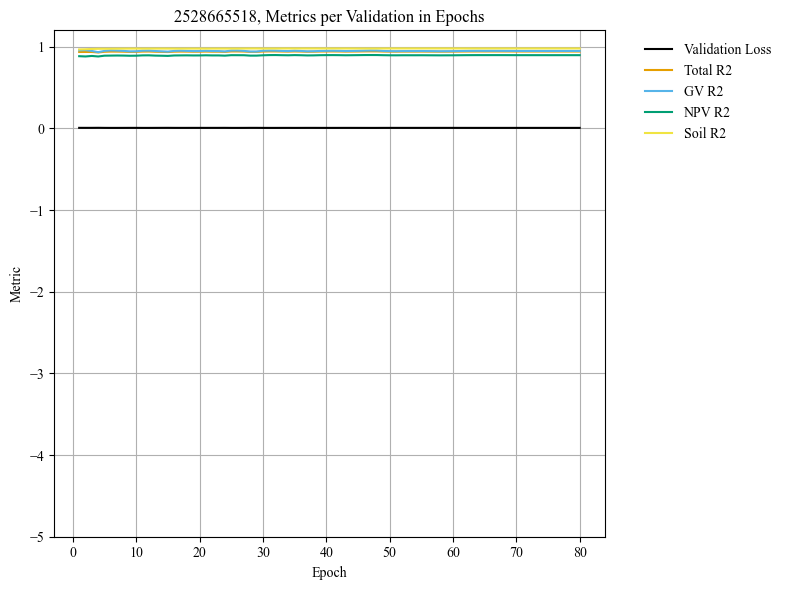

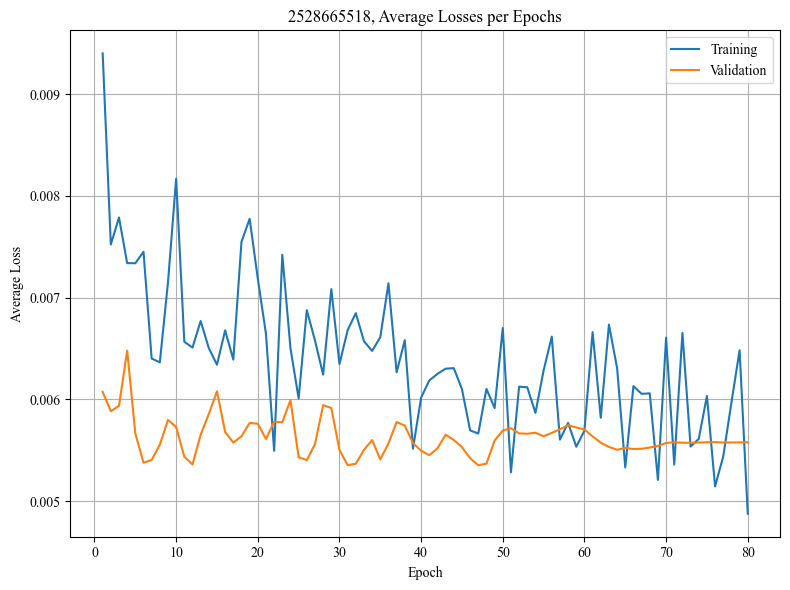

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.005863
Epoch 1/80, Step 2/5, Train Loss: 0.007831
Epoch 1/80, Step 3/5, Train Loss: 0.004911
Epoch 1/80, Step 4/5, Train Loss: 0.003570
Epoch 1/80, Step 5/5, Train Loss: 0.004925
Epoch 1/80 complete. Train Loss: 0.005420, Val Loss: 0.007513
Epoch 2/80, Step 1/5, Train Loss: 0.005755
Epoch 2/80, Step 2/5, Train Loss: 0.008303
Epoch 2/80, Step 3/5, Train Loss: 0.005721
Epoch 2/80, Step 4/5, Train Loss: 0.005589
Epoch 2/80, Step 5/5, Train Loss: 0.002314
Epoch 2/80 complete. Train Loss: 0.005536, Val Loss: 0.007284
Epoch 3/80, Step 1/5, Train Loss: 0.006763
Epoch 3/80, Step 2/5, Train Loss: 0.006175
Epoch 3/80, Step 3/5, Train Loss: 0.005115
Epoch 3/80, Step 4/5, Train Loss: 0.005403
Epoch 3/80, Step 5/5, Train Loss: 0.002702
Epoch 3/80 complete. Train Loss: 0.005232, Val Loss: 0.007358
Epoch 4/80, Step 1/5, Train Loss: 0.006666
Epoch 4/80, Step 2/5, Train Loss: 0.003081
Epoch 4/80, Step 3/5, Train Loss: 0.005450
Epoch 4/80, Step 4/5, Train Loss: 0.0042

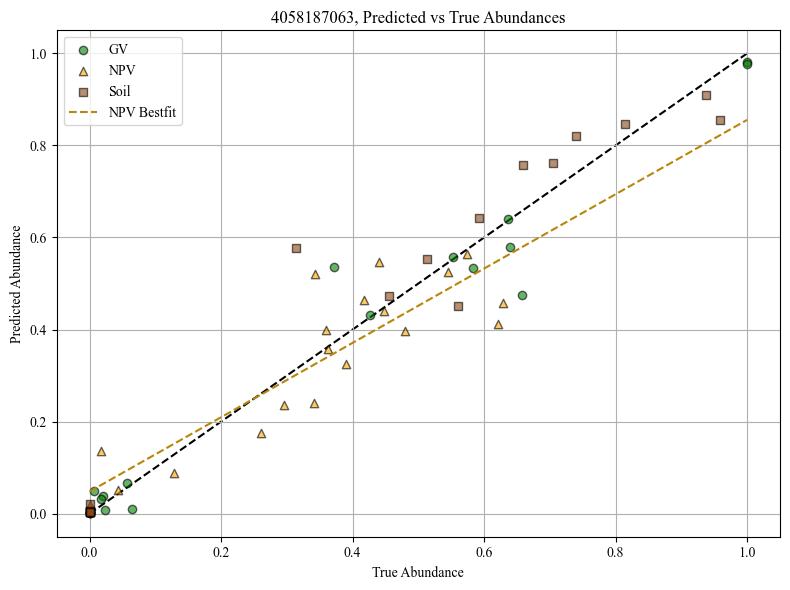

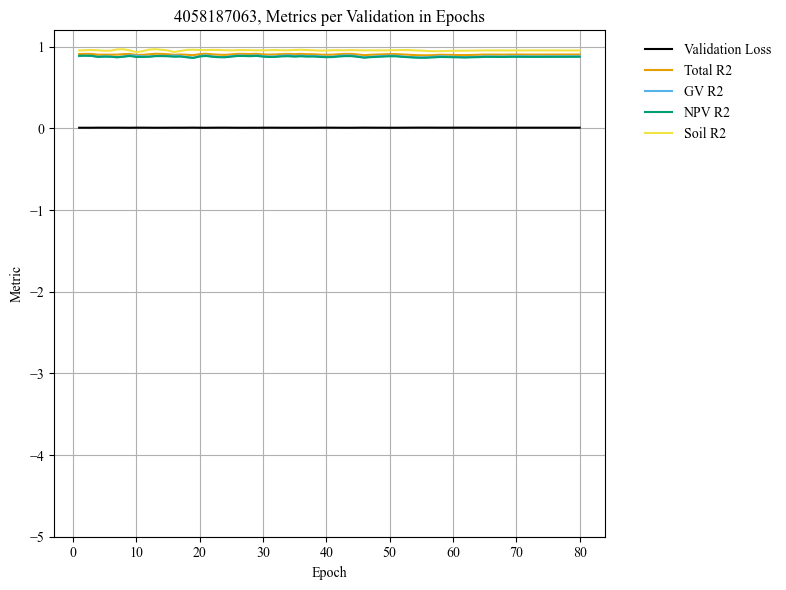

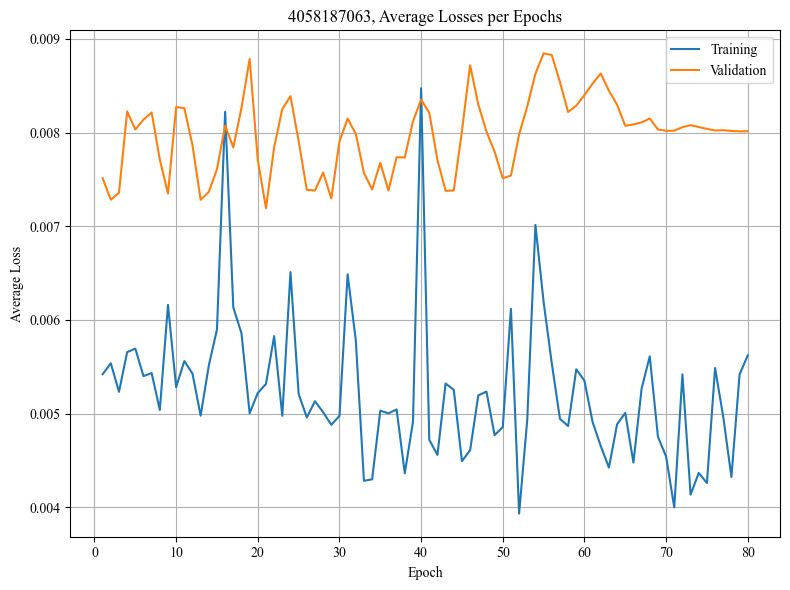

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.012552
Epoch 1/80, Step 2/5, Train Loss: 0.011315
Epoch 1/80, Step 3/5, Train Loss: 0.016030
Epoch 1/80, Step 4/5, Train Loss: 0.011664
Epoch 1/80, Step 5/5, Train Loss: 0.013428
Epoch 1/80 complete. Train Loss: 0.012998, Val Loss: 0.006358
Epoch 2/80, Step 1/5, Train Loss: 0.009460
Epoch 2/80, Step 2/5, Train Loss: 0.004168
Epoch 2/80, Step 3/5, Train Loss: 0.011841
Epoch 2/80, Step 4/5, Train Loss: 0.025761
Epoch 2/80, Step 5/5, Train Loss: 0.019263
Epoch 2/80 complete. Train Loss: 0.014099, Val Loss: 0.006570
Epoch 3/80, Step 1/5, Train Loss: 0.009278
Epoch 3/80, Step 2/5, Train Loss: 0.009223
Epoch 3/80, Step 3/5, Train Loss: 0.012270
Epoch 3/80, Step 4/5, Train Loss: 0.014565
Epoch 3/80, Step 5/5, Train Loss: 0.006647
Epoch 3/80 complete. Train Loss: 0.010397, Val Loss: 0.006600
Epoch 4/80, Step 1/5, Train Loss: 0.007140
Epoch 4/80, Step 2/5, Train Loss: 0.022597
Epoch 4/80, Step 3/5, Train Loss: 0.011739
Epoch 4/80, Step 4/5, Train Loss: 0.0056

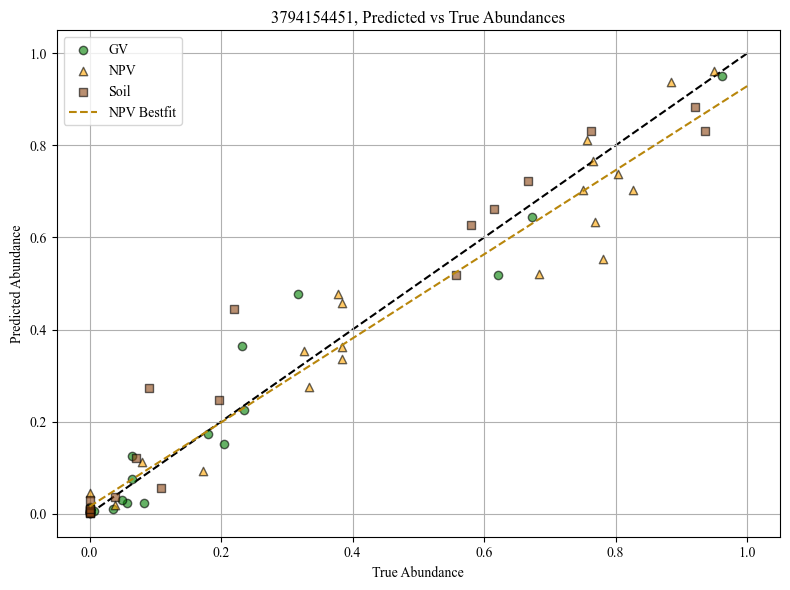

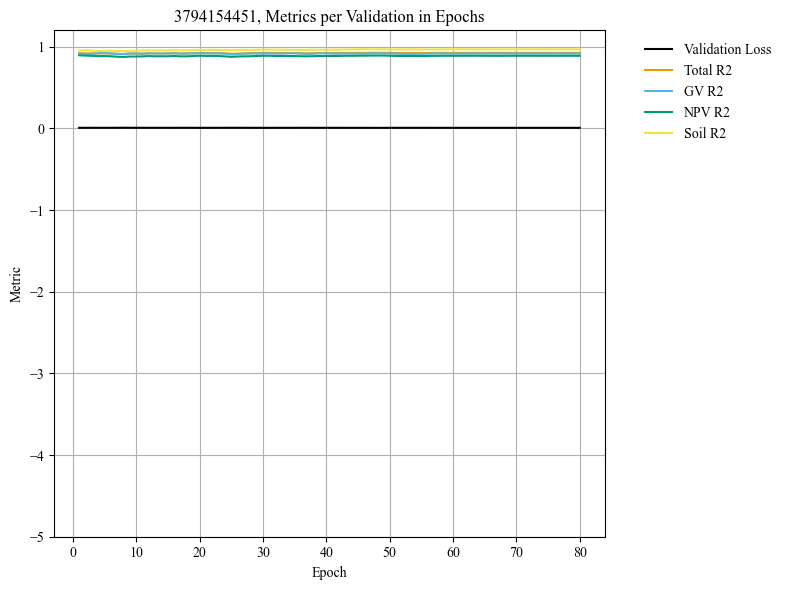

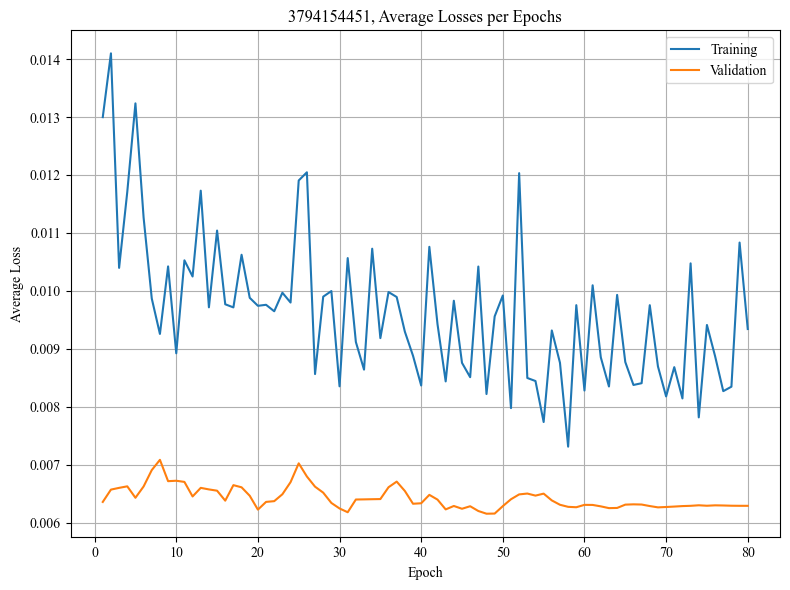

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.010206
Epoch 1/80, Step 2/5, Train Loss: 0.011681
Epoch 1/80, Step 3/5, Train Loss: 0.011019
Epoch 1/80, Step 4/5, Train Loss: 0.009489
Epoch 1/80, Step 5/5, Train Loss: 0.015540
Epoch 1/80 complete. Train Loss: 0.011587, Val Loss: 0.005473
Epoch 2/80, Step 1/5, Train Loss: 0.013939
Epoch 2/80, Step 2/5, Train Loss: 0.011054
Epoch 2/80, Step 3/5, Train Loss: 0.003151
Epoch 2/80, Step 4/5, Train Loss: 0.012568
Epoch 2/80, Step 5/5, Train Loss: 0.013652
Epoch 2/80 complete. Train Loss: 0.010873, Val Loss: 0.005144
Epoch 3/80, Step 1/5, Train Loss: 0.006870
Epoch 3/80, Step 2/5, Train Loss: 0.010972
Epoch 3/80, Step 3/5, Train Loss: 0.004692
Epoch 3/80, Step 4/5, Train Loss: 0.008675
Epoch 3/80, Step 5/5, Train Loss: 0.013598
Epoch 3/80 complete. Train Loss: 0.008961, Val Loss: 0.005258
Epoch 4/80, Step 1/5, Train Loss: 0.010150
Epoch 4/80, Step 2/5, Train Loss: 0.011927
Epoch 4/80, Step 3/5, Train Loss: 0.010647
Epoch 4/80, Step 4/5, Train Loss: 0.0064

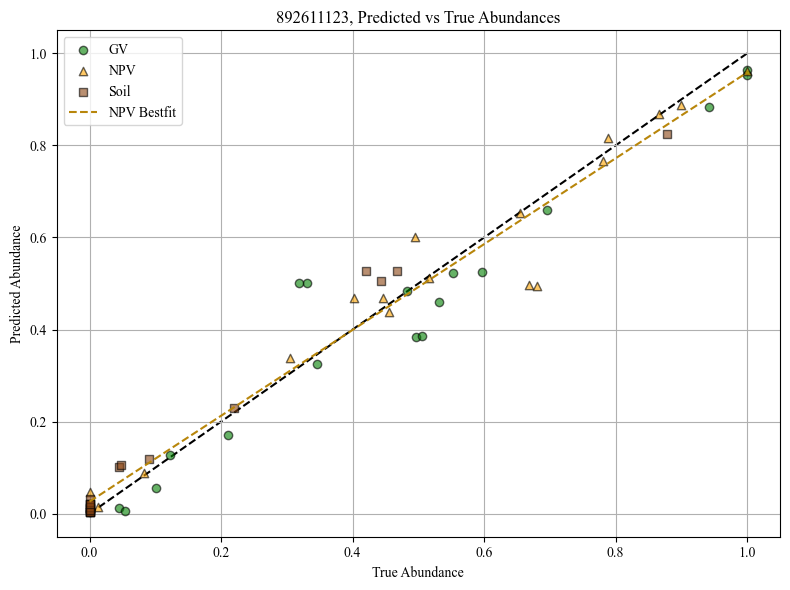

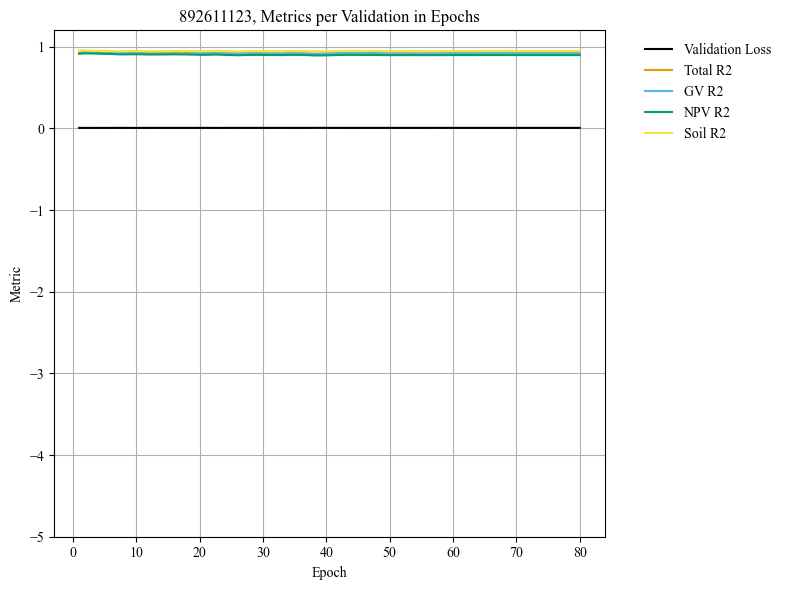

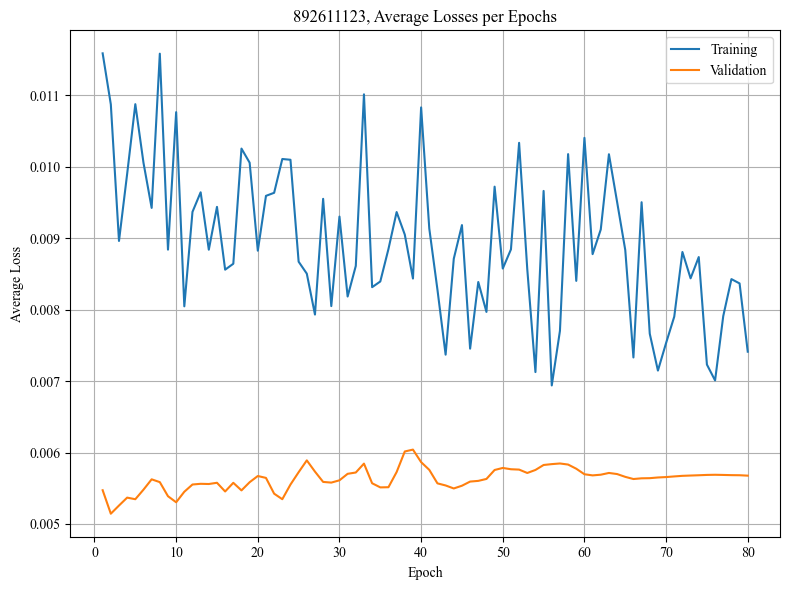

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.004256
Epoch 1/80, Step 2/5, Train Loss: 0.004375
Epoch 1/80, Step 3/5, Train Loss: 0.005853
Epoch 1/80, Step 4/5, Train Loss: 0.013375
Epoch 1/80, Step 5/5, Train Loss: 0.004653
Epoch 1/80 complete. Train Loss: 0.006502, Val Loss: 0.006745
Epoch 2/80, Step 1/5, Train Loss: 0.003082
Epoch 2/80, Step 2/5, Train Loss: 0.006630
Epoch 2/80, Step 3/5, Train Loss: 0.003430
Epoch 2/80, Step 4/5, Train Loss: 0.003330
Epoch 2/80, Step 5/5, Train Loss: 0.006411
Epoch 2/80 complete. Train Loss: 0.004577, Val Loss: 0.007064
Epoch 3/80, Step 1/5, Train Loss: 0.004674
Epoch 3/80, Step 2/5, Train Loss: 0.005940
Epoch 3/80, Step 3/5, Train Loss: 0.005326
Epoch 3/80, Step 4/5, Train Loss: 0.003479
Epoch 3/80, Step 5/5, Train Loss: 0.003555
Epoch 3/80 complete. Train Loss: 0.004595, Val Loss: 0.007054
Epoch 4/80, Step 1/5, Train Loss: 0.009730
Epoch 4/80, Step 2/5, Train Loss: 0.002729
Epoch 4/80, Step 3/5, Train Loss: 0.005749
Epoch 4/80, Step 4/5, Train Loss: 0.0088

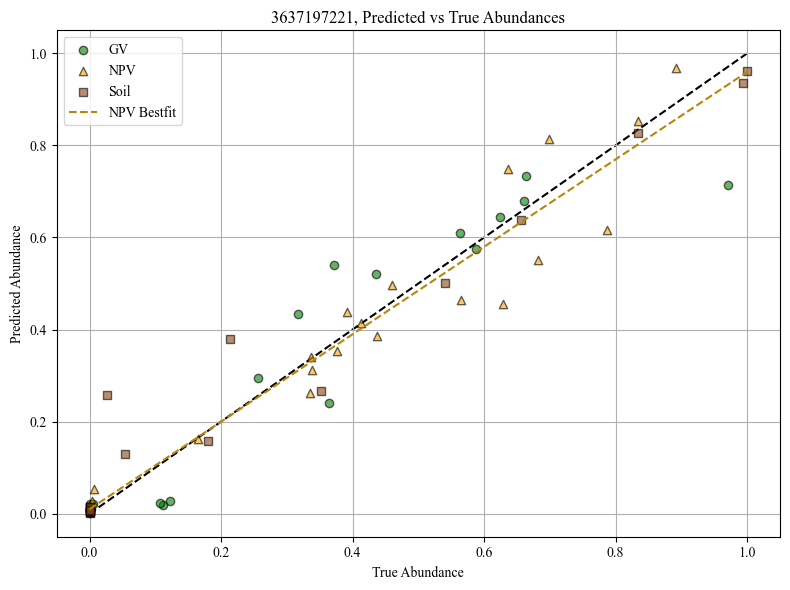

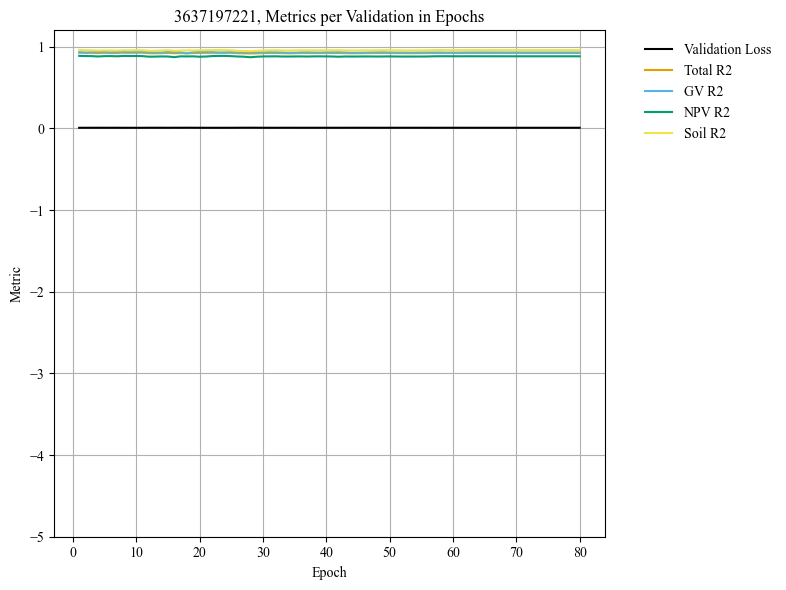

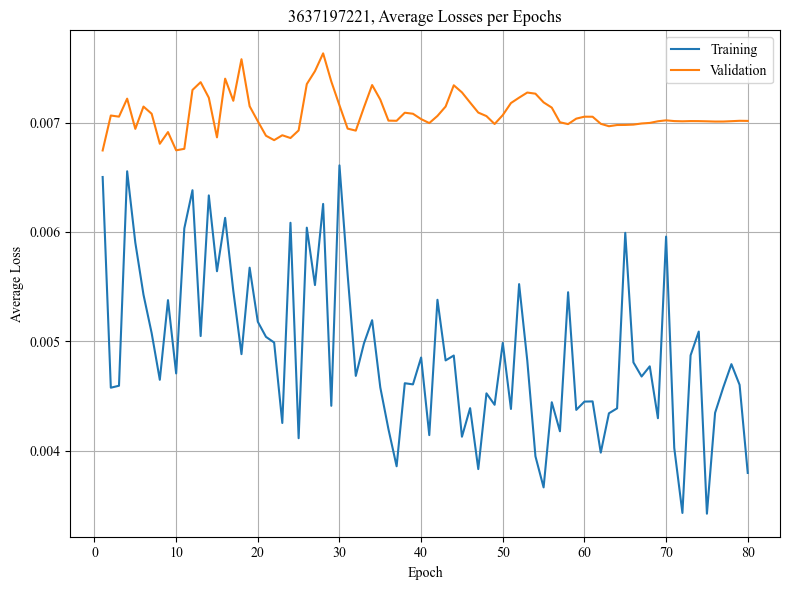

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.006439
Epoch 1/80, Step 2/5, Train Loss: 0.007467
Epoch 1/80, Step 3/5, Train Loss: 0.009033
Epoch 1/80, Step 4/5, Train Loss: 0.003091
Epoch 1/80, Step 5/5, Train Loss: 0.007608
Epoch 1/80 complete. Train Loss: 0.006727, Val Loss: 0.003923
Epoch 2/80, Step 1/5, Train Loss: 0.005222
Epoch 2/80, Step 2/5, Train Loss: 0.005886
Epoch 2/80, Step 3/5, Train Loss: 0.019374
Epoch 2/80, Step 4/5, Train Loss: 0.004081
Epoch 2/80, Step 5/5, Train Loss: 0.004199
Epoch 2/80 complete. Train Loss: 0.007753, Val Loss: 0.003475
Epoch 3/80, Step 1/5, Train Loss: 0.008351
Epoch 3/80, Step 2/5, Train Loss: 0.006580
Epoch 3/80, Step 3/5, Train Loss: 0.005166
Epoch 3/80, Step 4/5, Train Loss: 0.007648
Epoch 3/80, Step 5/5, Train Loss: 0.009539
Epoch 3/80 complete. Train Loss: 0.007457, Val Loss: 0.003602
Epoch 4/80, Step 1/5, Train Loss: 0.007721
Epoch 4/80, Step 2/5, Train Loss: 0.009999
Epoch 4/80, Step 3/5, Train Loss: 0.008695
Epoch 4/80, Step 4/5, Train Loss: 0.0077

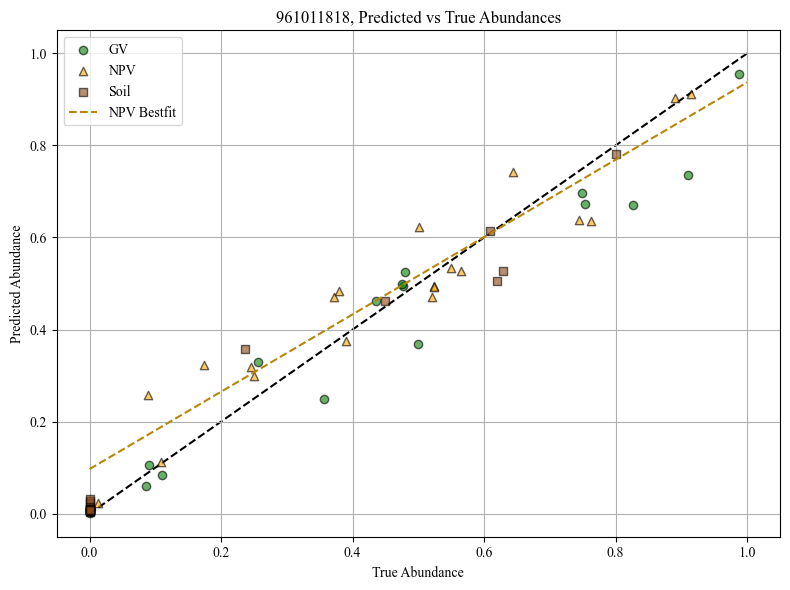

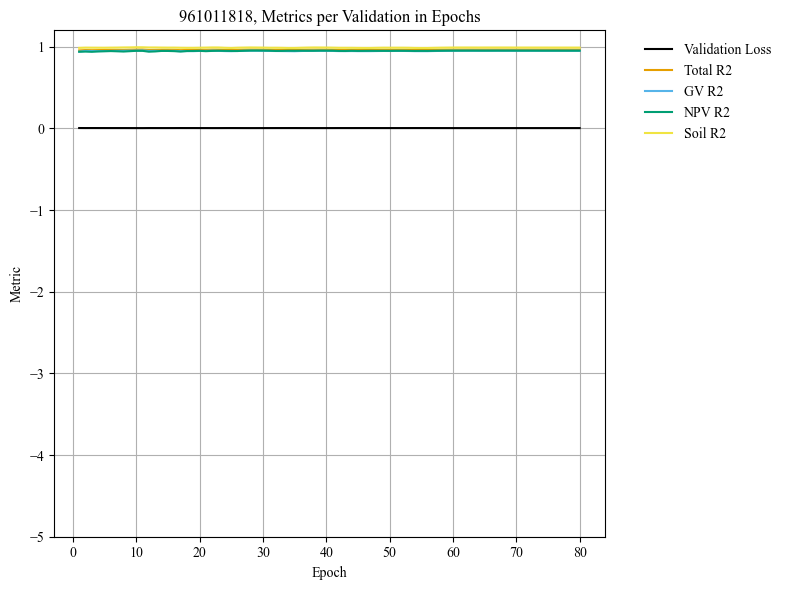

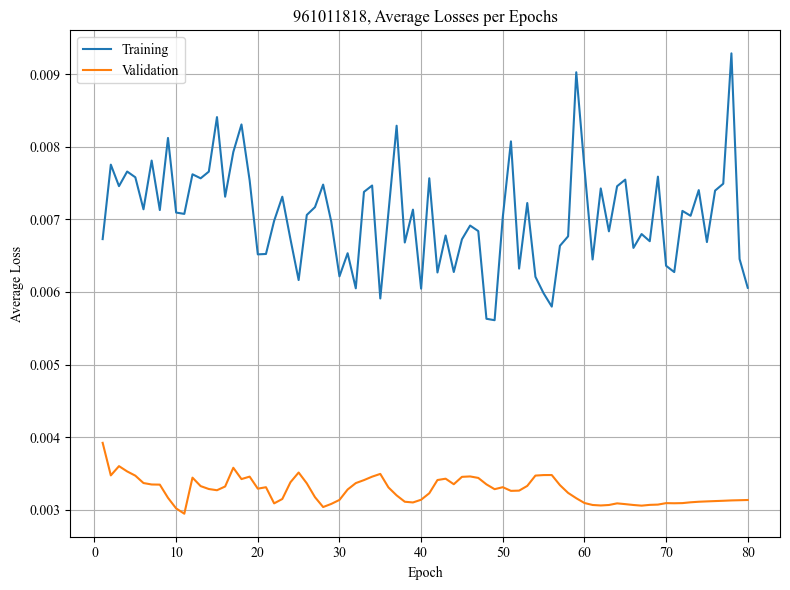

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.004628
Epoch 1/80, Step 2/5, Train Loss: 0.008334
Epoch 1/80, Step 3/5, Train Loss: 0.006029
Epoch 1/80, Step 4/5, Train Loss: 0.015808
Epoch 1/80, Step 5/5, Train Loss: 0.007955
Epoch 1/80 complete. Train Loss: 0.008551, Val Loss: 0.005500
Epoch 2/80, Step 1/5, Train Loss: 0.006383
Epoch 2/80, Step 2/5, Train Loss: 0.009059
Epoch 2/80, Step 3/5, Train Loss: 0.003219
Epoch 2/80, Step 4/5, Train Loss: 0.008189
Epoch 2/80, Step 5/5, Train Loss: 0.005169
Epoch 2/80 complete. Train Loss: 0.006404, Val Loss: 0.005273
Epoch 3/80, Step 1/5, Train Loss: 0.005406
Epoch 3/80, Step 2/5, Train Loss: 0.009169
Epoch 3/80, Step 3/5, Train Loss: 0.004527
Epoch 3/80, Step 4/5, Train Loss: 0.004448
Epoch 3/80, Step 5/5, Train Loss: 0.007208
Epoch 3/80 complete. Train Loss: 0.006152, Val Loss: 0.005135
Epoch 4/80, Step 1/5, Train Loss: 0.004924
Epoch 4/80, Step 2/5, Train Loss: 0.008281
Epoch 4/80, Step 3/5, Train Loss: 0.004040
Epoch 4/80, Step 4/5, Train Loss: 0.0093

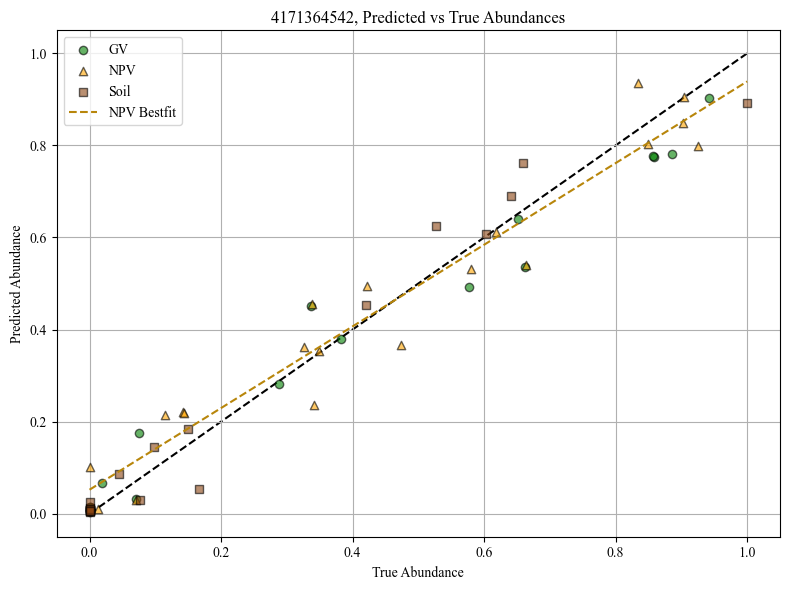

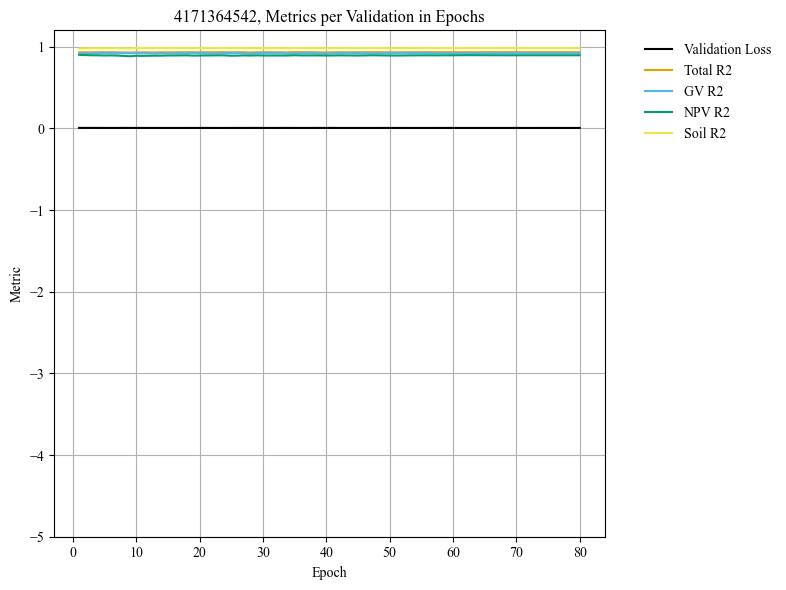

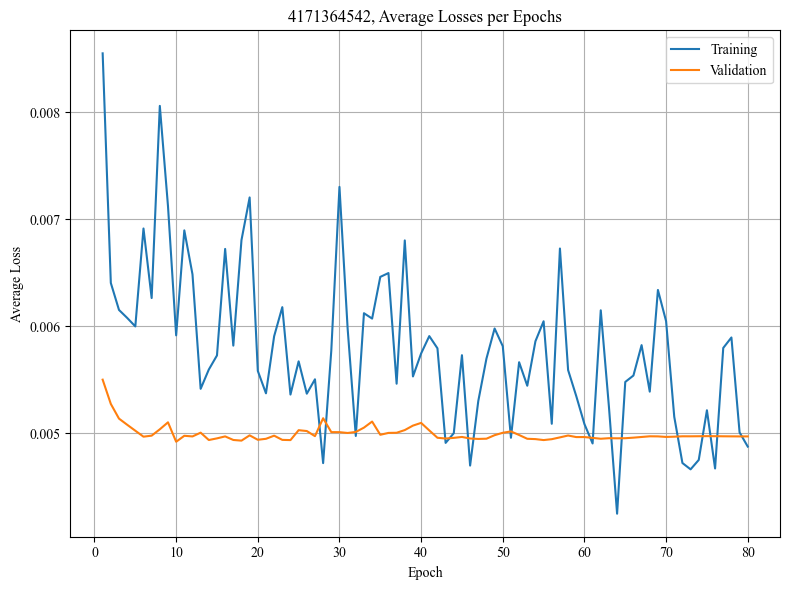

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.009189
Epoch 1/80, Step 2/5, Train Loss: 0.005233
Epoch 1/80, Step 3/5, Train Loss: 0.006740
Epoch 1/80, Step 4/5, Train Loss: 0.009581
Epoch 1/80, Step 5/5, Train Loss: 0.014528
Epoch 1/80 complete. Train Loss: 0.009054, Val Loss: 0.009934
Epoch 2/80, Step 1/5, Train Loss: 0.009774
Epoch 2/80, Step 2/5, Train Loss: 0.012985
Epoch 2/80, Step 3/5, Train Loss: 0.010626
Epoch 2/80, Step 4/5, Train Loss: 0.008713
Epoch 2/80, Step 5/5, Train Loss: 0.007004
Epoch 2/80 complete. Train Loss: 0.009820, Val Loss: 0.009131
Epoch 3/80, Step 1/5, Train Loss: 0.008012
Epoch 3/80, Step 2/5, Train Loss: 0.008056
Epoch 3/80, Step 3/5, Train Loss: 0.005187
Epoch 3/80, Step 4/5, Train Loss: 0.020890
Epoch 3/80, Step 5/5, Train Loss: 0.008034
Epoch 3/80 complete. Train Loss: 0.010036, Val Loss: 0.008337
Epoch 4/80, Step 1/5, Train Loss: 0.006515
Epoch 4/80, Step 2/5, Train Loss: 0.008896
Epoch 4/80, Step 3/5, Train Loss: 0.013530
Epoch 4/80, Step 4/5, Train Loss: 0.0130

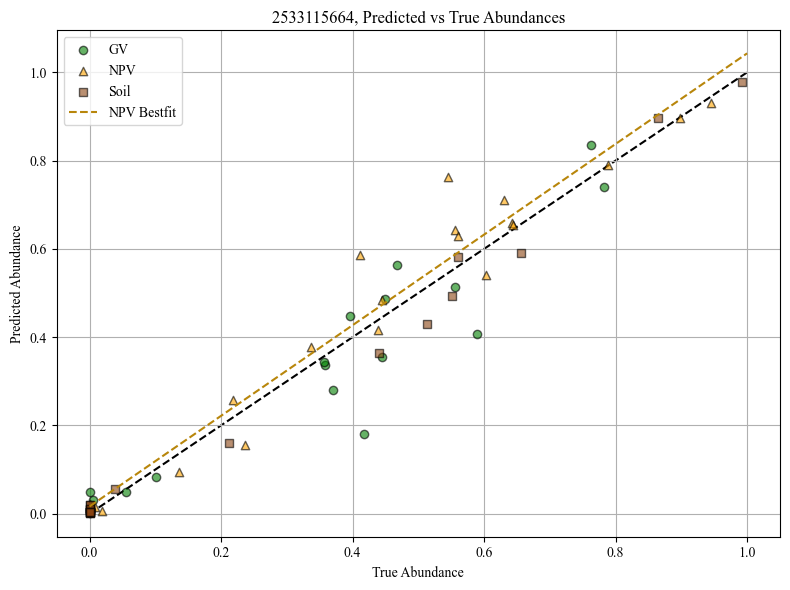

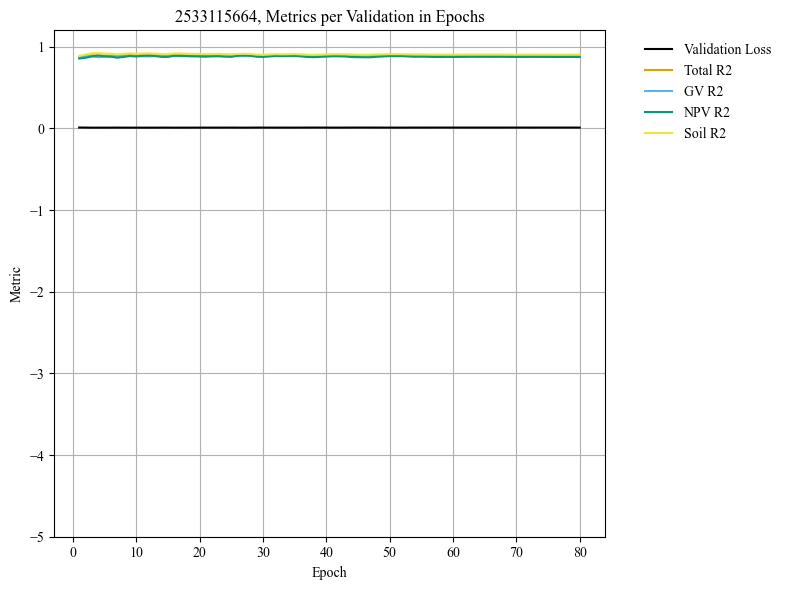

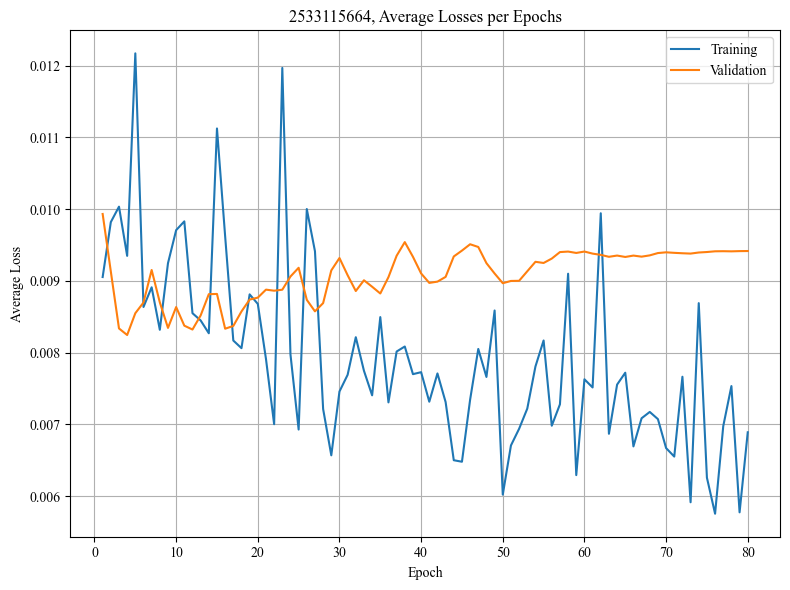

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.009036
Epoch 1/80, Step 2/5, Train Loss: 0.013241
Epoch 1/80, Step 3/5, Train Loss: 0.008409
Epoch 1/80, Step 4/5, Train Loss: 0.004941
Epoch 1/80, Step 5/5, Train Loss: 0.006568
Epoch 1/80 complete. Train Loss: 0.008439, Val Loss: 0.008204
Epoch 2/80, Step 1/5, Train Loss: 0.007285
Epoch 2/80, Step 2/5, Train Loss: 0.004787
Epoch 2/80, Step 3/5, Train Loss: 0.009096
Epoch 2/80, Step 4/5, Train Loss: 0.009782
Epoch 2/80, Step 5/5, Train Loss: 0.010792
Epoch 2/80 complete. Train Loss: 0.008348, Val Loss: 0.007652
Epoch 3/80, Step 1/5, Train Loss: 0.005528
Epoch 3/80, Step 2/5, Train Loss: 0.009191
Epoch 3/80, Step 3/5, Train Loss: 0.007515
Epoch 3/80, Step 4/5, Train Loss: 0.007977
Epoch 3/80, Step 5/5, Train Loss: 0.006372
Epoch 3/80 complete. Train Loss: 0.007316, Val Loss: 0.008045
Epoch 4/80, Step 1/5, Train Loss: 0.006331
Epoch 4/80, Step 2/5, Train Loss: 0.007126
Epoch 4/80, Step 3/5, Train Loss: 0.006616
Epoch 4/80, Step 4/5, Train Loss: 0.0047

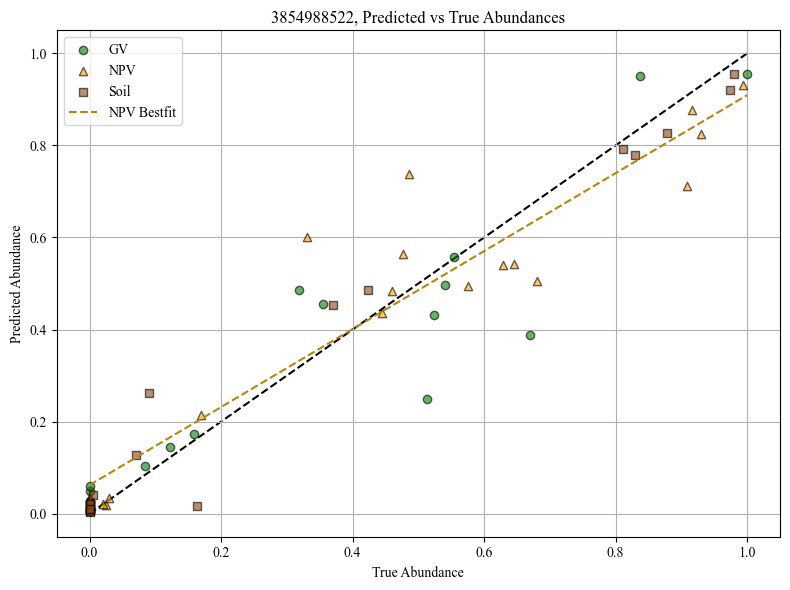

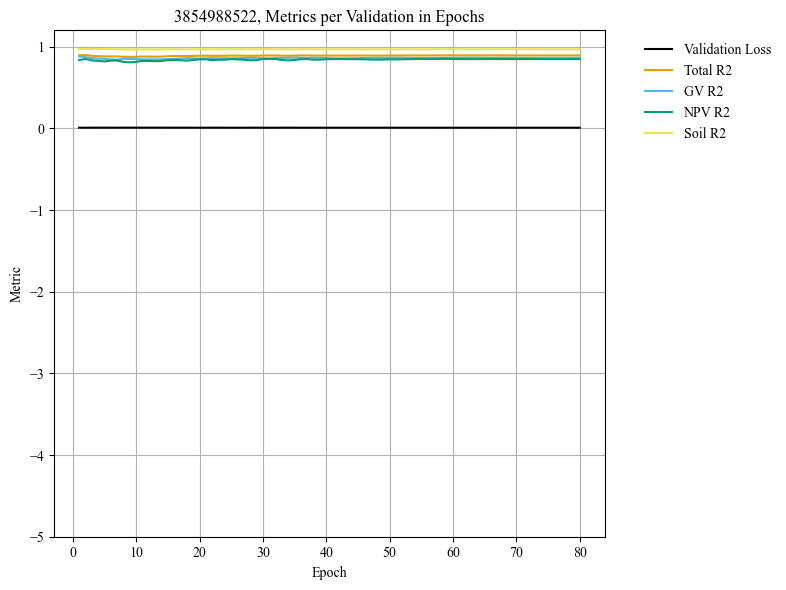

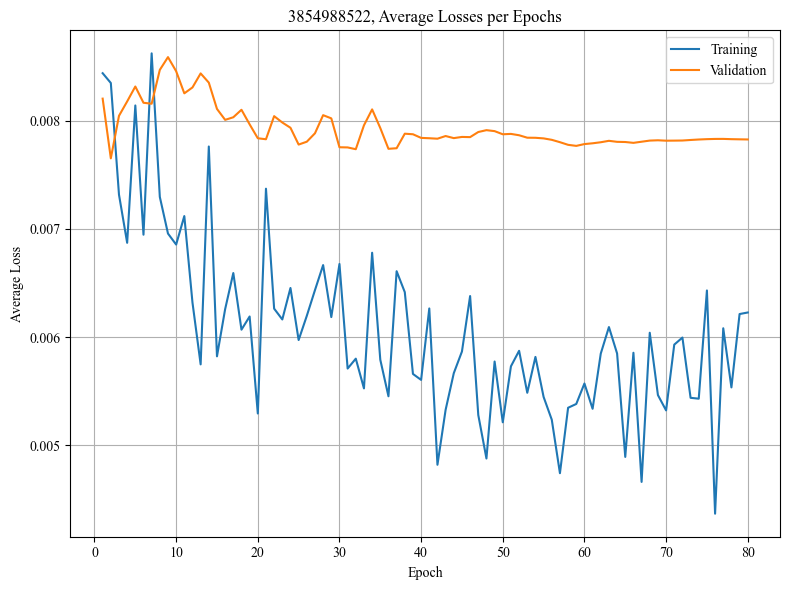

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.012021
Epoch 1/80, Step 2/5, Train Loss: 0.003050
Epoch 1/80, Step 3/5, Train Loss: 0.008319
Epoch 1/80, Step 4/5, Train Loss: 0.011010
Epoch 1/80, Step 5/5, Train Loss: 0.004976
Epoch 1/80 complete. Train Loss: 0.007875, Val Loss: 0.006269
Epoch 2/80, Step 1/5, Train Loss: 0.012171
Epoch 2/80, Step 2/5, Train Loss: 0.009924
Epoch 2/80, Step 3/5, Train Loss: 0.005299
Epoch 2/80, Step 4/5, Train Loss: 0.008109
Epoch 2/80, Step 5/5, Train Loss: 0.008144
Epoch 2/80 complete. Train Loss: 0.008729, Val Loss: 0.007327
Epoch 3/80, Step 1/5, Train Loss: 0.010782
Epoch 3/80, Step 2/5, Train Loss: 0.011718
Epoch 3/80, Step 3/5, Train Loss: 0.006771
Epoch 3/80, Step 4/5, Train Loss: 0.007986
Epoch 3/80, Step 5/5, Train Loss: 0.005716
Epoch 3/80 complete. Train Loss: 0.008594, Val Loss: 0.006962
Epoch 4/80, Step 1/5, Train Loss: 0.005211
Epoch 4/80, Step 2/5, Train Loss: 0.004226
Epoch 4/80, Step 3/5, Train Loss: 0.008687
Epoch 4/80, Step 4/5, Train Loss: 0.0076

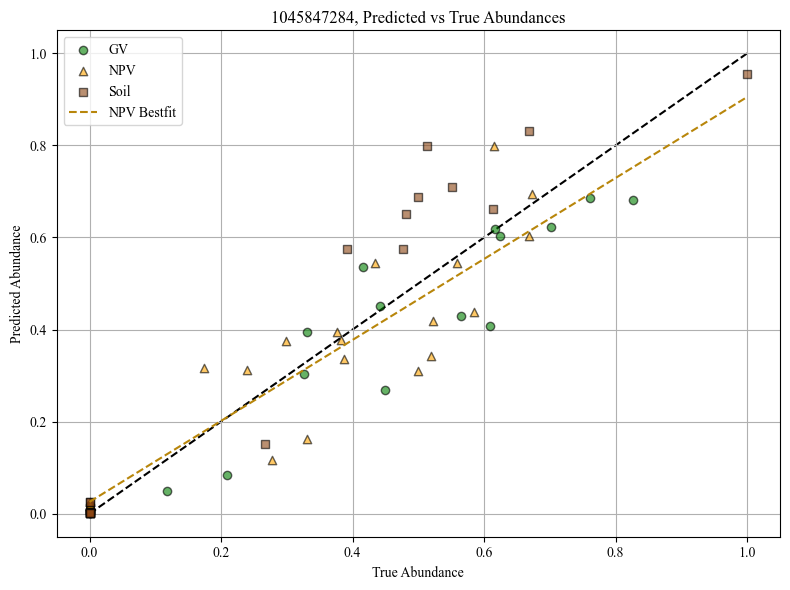

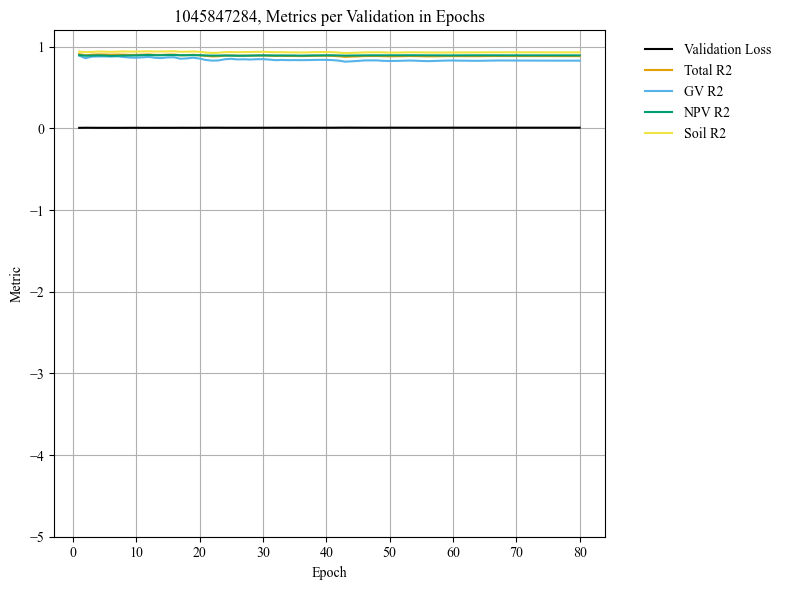

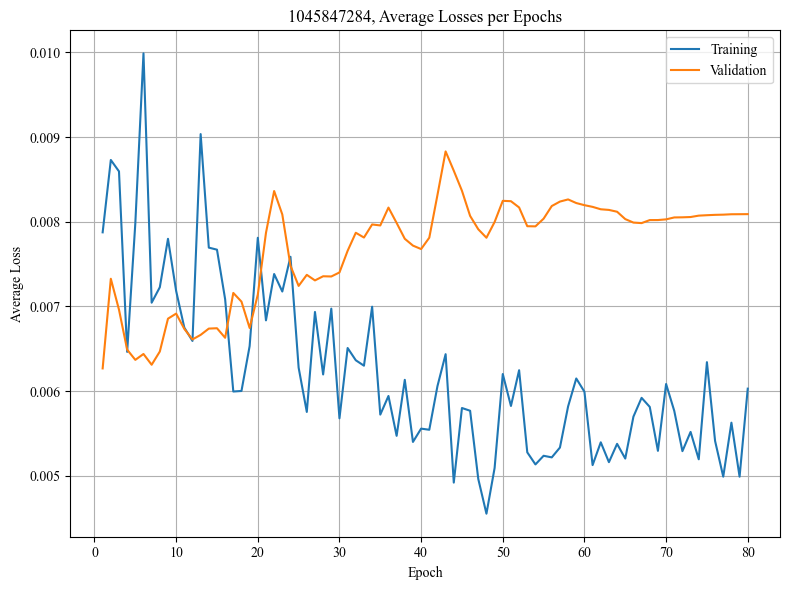

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.021976
Epoch 1/80, Step 2/5, Train Loss: 0.007840
Epoch 1/80, Step 3/5, Train Loss: 0.006259
Epoch 1/80, Step 4/5, Train Loss: 0.014015
Epoch 1/80, Step 5/5, Train Loss: 0.012049
Epoch 1/80 complete. Train Loss: 0.012428, Val Loss: 0.011345
Epoch 2/80, Step 1/5, Train Loss: 0.006543
Epoch 2/80, Step 2/5, Train Loss: 0.007286
Epoch 2/80, Step 3/5, Train Loss: 0.011629
Epoch 2/80, Step 4/5, Train Loss: 0.012410
Epoch 2/80, Step 5/5, Train Loss: 0.009845
Epoch 2/80 complete. Train Loss: 0.009543, Val Loss: 0.009464
Epoch 3/80, Step 1/5, Train Loss: 0.021907
Epoch 3/80, Step 2/5, Train Loss: 0.014167
Epoch 3/80, Step 3/5, Train Loss: 0.006415
Epoch 3/80, Step 4/5, Train Loss: 0.003817
Epoch 3/80, Step 5/5, Train Loss: 0.006426
Epoch 3/80 complete. Train Loss: 0.010546, Val Loss: 0.009266
Epoch 4/80, Step 1/5, Train Loss: 0.010584
Epoch 4/80, Step 2/5, Train Loss: 0.024127
Epoch 4/80, Step 3/5, Train Loss: 0.004463
Epoch 4/80, Step 4/5, Train Loss: 0.0040

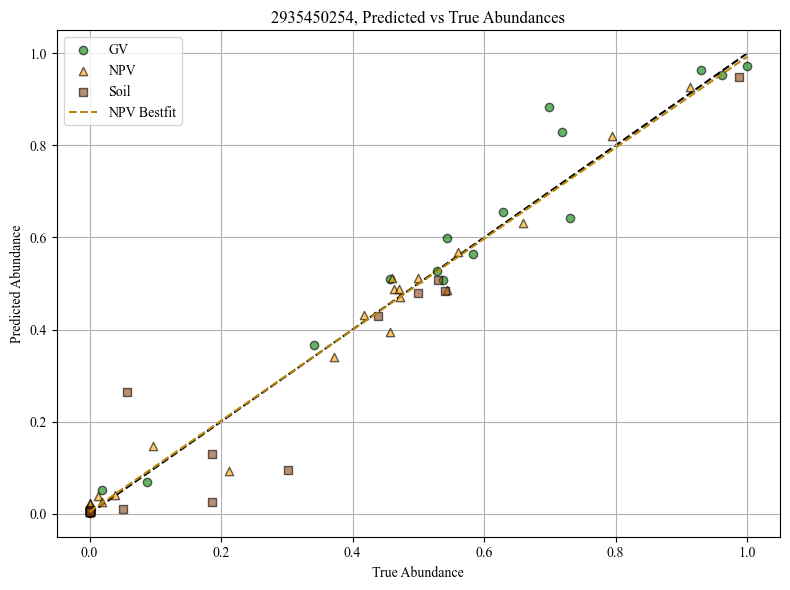

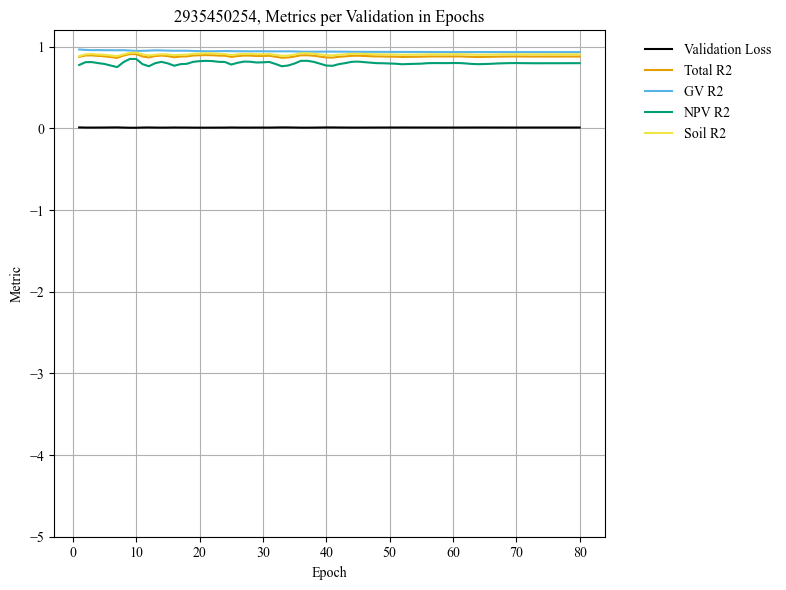

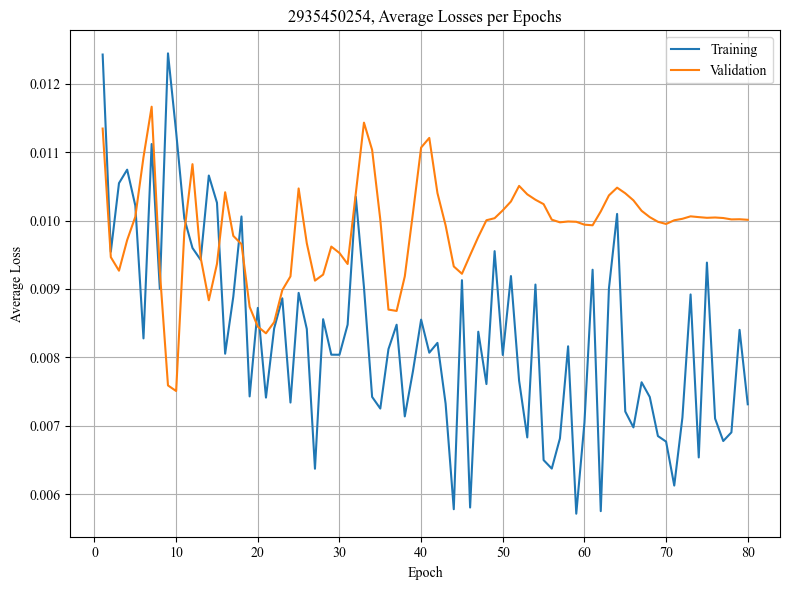

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.009003
Epoch 1/80, Step 2/5, Train Loss: 0.006180
Epoch 1/80, Step 3/5, Train Loss: 0.003379
Epoch 1/80, Step 4/5, Train Loss: 0.003239
Epoch 1/80, Step 5/5, Train Loss: 0.009272
Epoch 1/80 complete. Train Loss: 0.006214, Val Loss: 0.006316
Epoch 2/80, Step 1/5, Train Loss: 0.004566
Epoch 2/80, Step 2/5, Train Loss: 0.005674
Epoch 2/80, Step 3/5, Train Loss: 0.006584
Epoch 2/80, Step 4/5, Train Loss: 0.002617
Epoch 2/80, Step 5/5, Train Loss: 0.002198
Epoch 2/80 complete. Train Loss: 0.004328, Val Loss: 0.006293
Epoch 3/80, Step 1/5, Train Loss: 0.008352
Epoch 3/80, Step 2/5, Train Loss: 0.006751
Epoch 3/80, Step 3/5, Train Loss: 0.002591
Epoch 3/80, Step 4/5, Train Loss: 0.007206
Epoch 3/80, Step 5/5, Train Loss: 0.007074
Epoch 3/80 complete. Train Loss: 0.006395, Val Loss: 0.006022
Epoch 4/80, Step 1/5, Train Loss: 0.009631
Epoch 4/80, Step 2/5, Train Loss: 0.002973
Epoch 4/80, Step 3/5, Train Loss: 0.004713
Epoch 4/80, Step 4/5, Train Loss: 0.0024

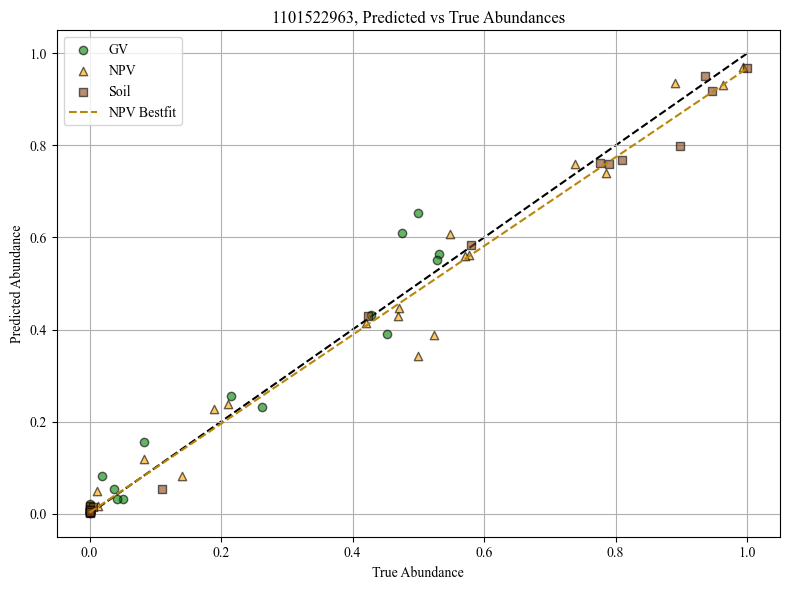

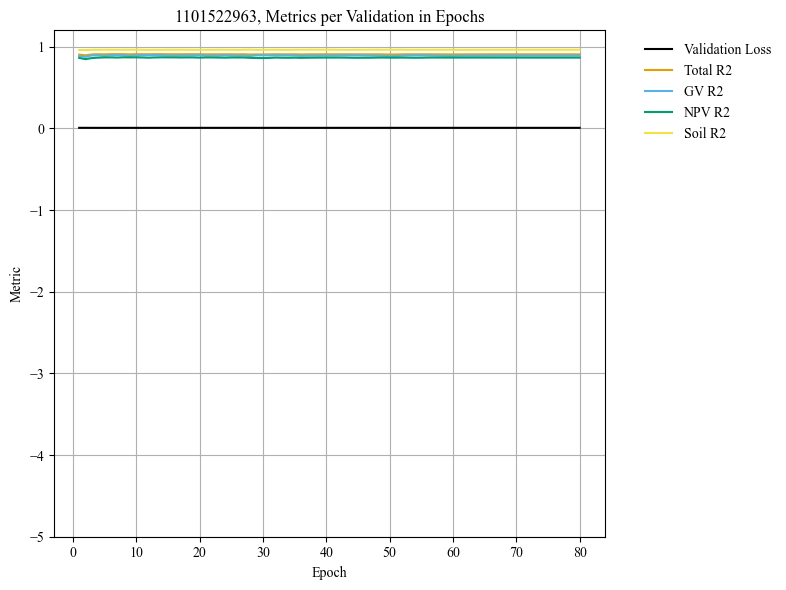

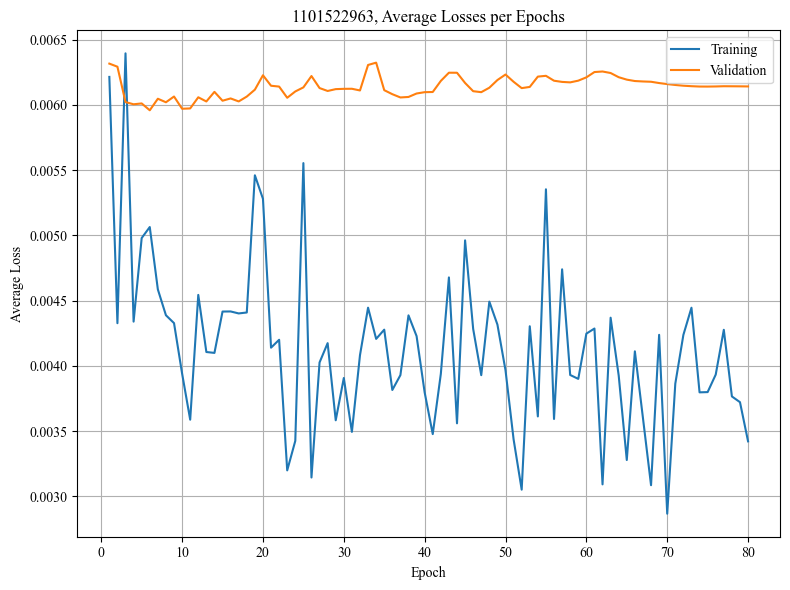

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.006436
Epoch 1/80, Step 2/5, Train Loss: 0.009809
Epoch 1/80, Step 3/5, Train Loss: 0.007690
Epoch 1/80, Step 4/5, Train Loss: 0.005171
Epoch 1/80, Step 5/5, Train Loss: 0.006237
Epoch 1/80 complete. Train Loss: 0.007069, Val Loss: 0.008028
Epoch 2/80, Step 1/5, Train Loss: 0.007316
Epoch 2/80, Step 2/5, Train Loss: 0.009263
Epoch 2/80, Step 3/5, Train Loss: 0.003967
Epoch 2/80, Step 4/5, Train Loss: 0.005120
Epoch 2/80, Step 5/5, Train Loss: 0.006437
Epoch 2/80 complete. Train Loss: 0.006421, Val Loss: 0.006646
Epoch 3/80, Step 1/5, Train Loss: 0.009695
Epoch 3/80, Step 2/5, Train Loss: 0.005714
Epoch 3/80, Step 3/5, Train Loss: 0.004648
Epoch 3/80, Step 4/5, Train Loss: 0.008251
Epoch 3/80, Step 5/5, Train Loss: 0.003507
Epoch 3/80 complete. Train Loss: 0.006363, Val Loss: 0.007368
Epoch 4/80, Step 1/5, Train Loss: 0.015223
Epoch 4/80, Step 2/5, Train Loss: 0.004827
Epoch 4/80, Step 3/5, Train Loss: 0.005035
Epoch 4/80, Step 4/5, Train Loss: 0.0046

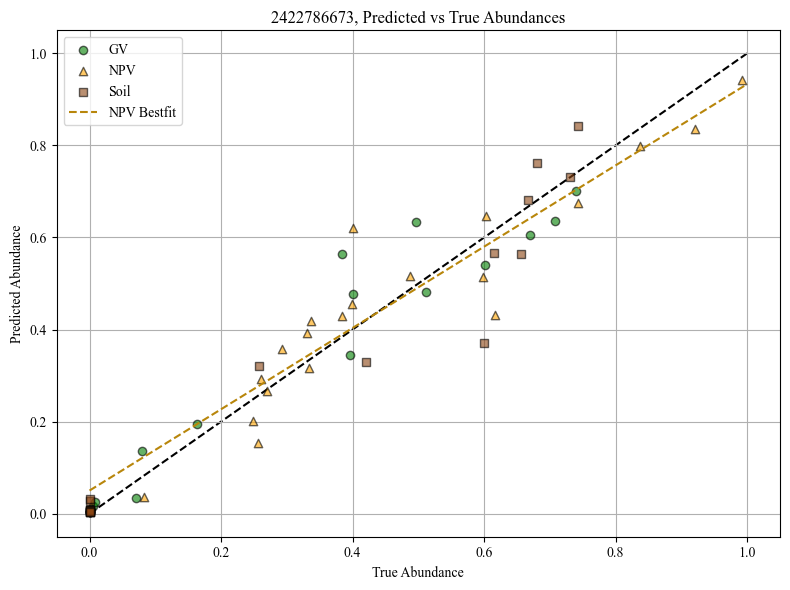

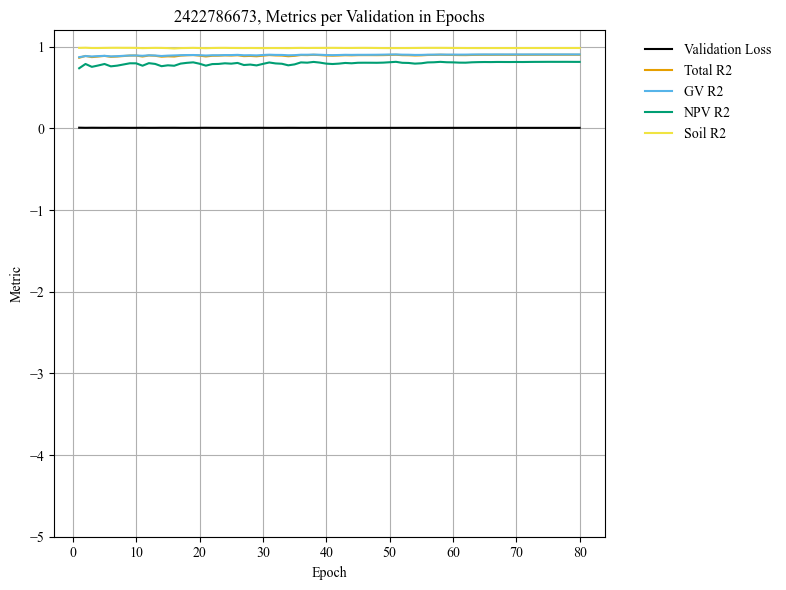

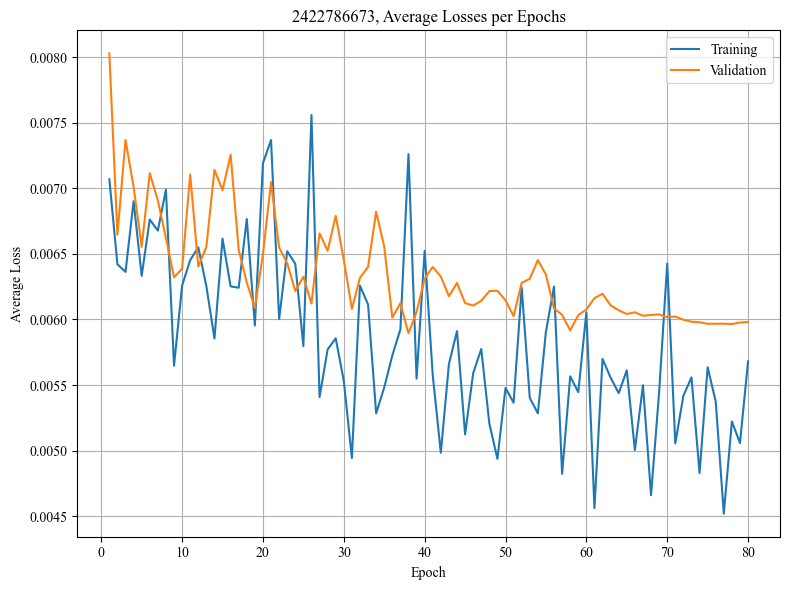

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.008920
Epoch 1/80, Step 2/5, Train Loss: 0.004137
Epoch 1/80, Step 3/5, Train Loss: 0.005121
Epoch 1/80, Step 4/5, Train Loss: 0.005837
Epoch 1/80, Step 5/5, Train Loss: 0.011464
Epoch 1/80 complete. Train Loss: 0.007096, Val Loss: 0.006223
Epoch 2/80, Step 1/5, Train Loss: 0.004852
Epoch 2/80, Step 2/5, Train Loss: 0.010469
Epoch 2/80, Step 3/5, Train Loss: 0.005841
Epoch 2/80, Step 4/5, Train Loss: 0.003751
Epoch 2/80, Step 5/5, Train Loss: 0.008495
Epoch 2/80 complete. Train Loss: 0.006681, Val Loss: 0.006491
Epoch 3/80, Step 1/5, Train Loss: 0.007579
Epoch 3/80, Step 2/5, Train Loss: 0.002792
Epoch 3/80, Step 3/5, Train Loss: 0.008343
Epoch 3/80, Step 4/5, Train Loss: 0.002320
Epoch 3/80, Step 5/5, Train Loss: 0.008468
Epoch 3/80 complete. Train Loss: 0.005900, Val Loss: 0.006492
Epoch 4/80, Step 1/5, Train Loss: 0.008339
Epoch 4/80, Step 2/5, Train Loss: 0.006509
Epoch 4/80, Step 3/5, Train Loss: 0.004558
Epoch 4/80, Step 4/5, Train Loss: 0.0051

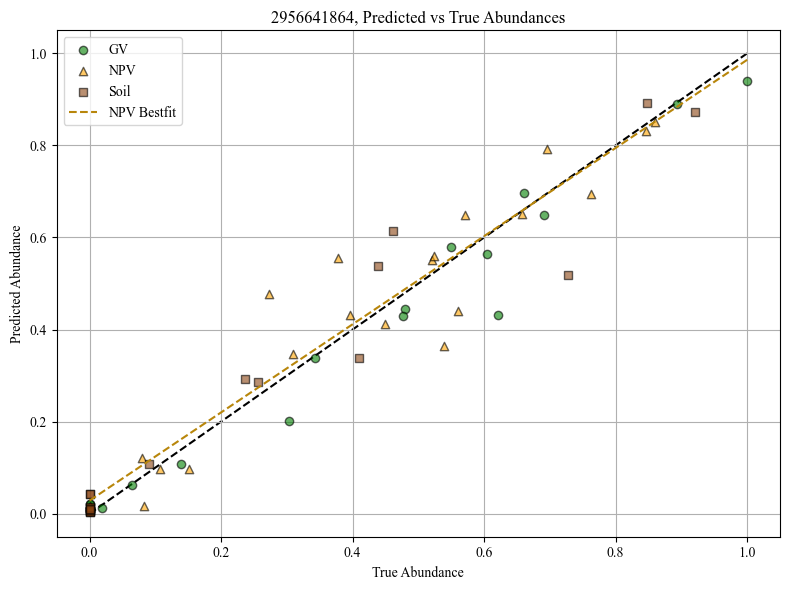

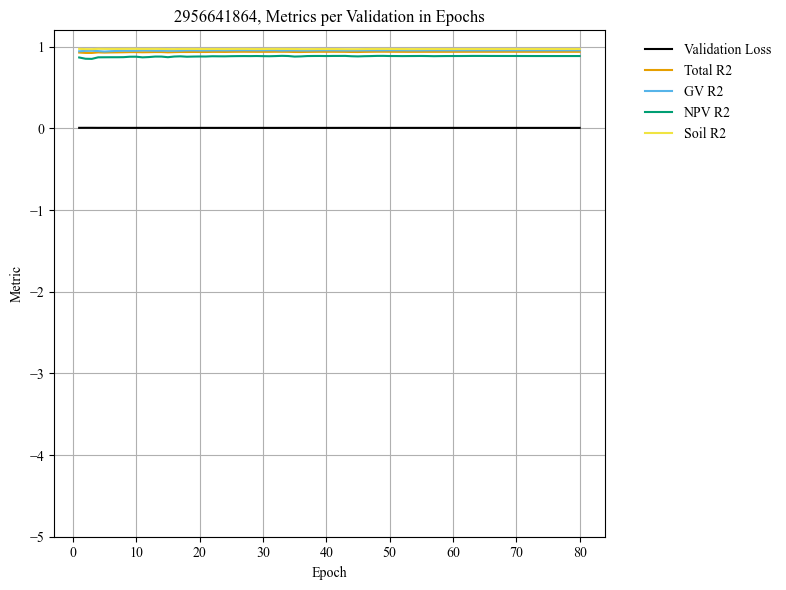

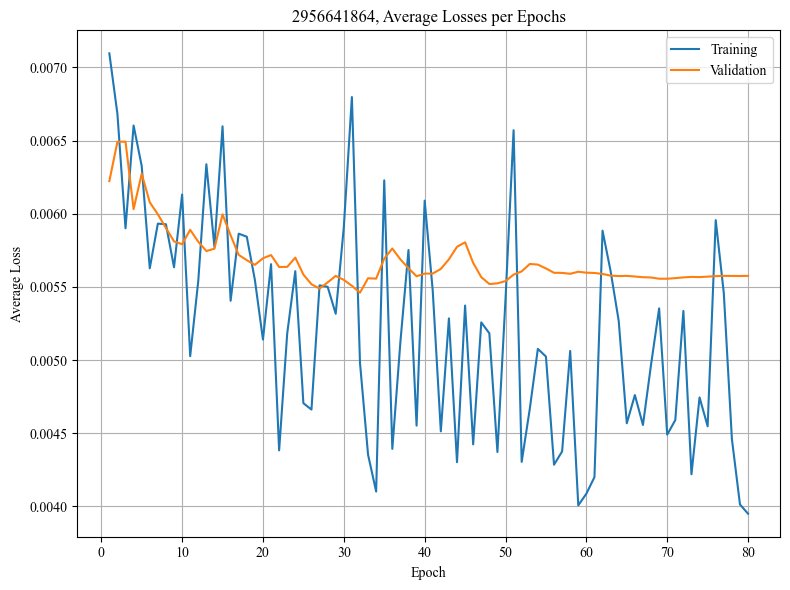

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.003637
Epoch 1/80, Step 2/5, Train Loss: 0.012518
Epoch 1/80, Step 3/5, Train Loss: 0.021593
Epoch 1/80, Step 4/5, Train Loss: 0.007479
Epoch 1/80, Step 5/5, Train Loss: 0.013090
Epoch 1/80 complete. Train Loss: 0.011664, Val Loss: 0.011433
Epoch 2/80, Step 1/5, Train Loss: 0.018740
Epoch 2/80, Step 2/5, Train Loss: 0.011109
Epoch 2/80, Step 3/5, Train Loss: 0.007273
Epoch 2/80, Step 4/5, Train Loss: 0.024215
Epoch 2/80, Step 5/5, Train Loss: 0.007681
Epoch 2/80 complete. Train Loss: 0.013804, Val Loss: 0.011765
Epoch 3/80, Step 1/5, Train Loss: 0.008384
Epoch 3/80, Step 2/5, Train Loss: 0.017295
Epoch 3/80, Step 3/5, Train Loss: 0.014606
Epoch 3/80, Step 4/5, Train Loss: 0.005851
Epoch 3/80, Step 5/5, Train Loss: 0.008338
Epoch 3/80 complete. Train Loss: 0.010895, Val Loss: 0.011885
Epoch 4/80, Step 1/5, Train Loss: 0.005731
Epoch 4/80, Step 2/5, Train Loss: 0.017429
Epoch 4/80, Step 3/5, Train Loss: 0.009035
Epoch 4/80, Step 4/5, Train Loss: 0.0149

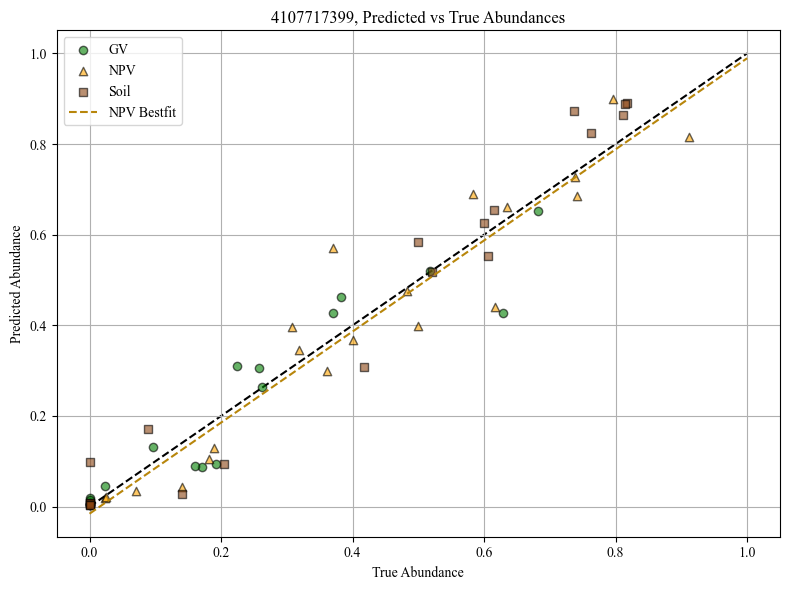

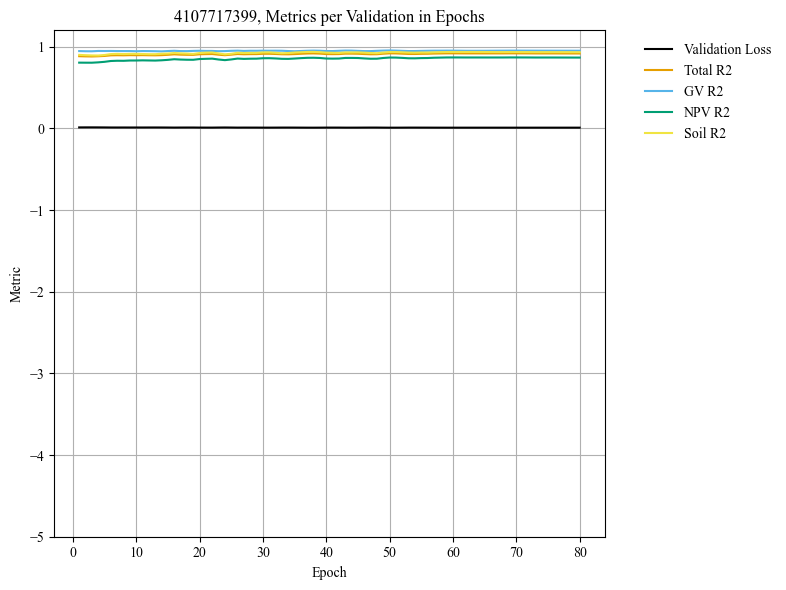

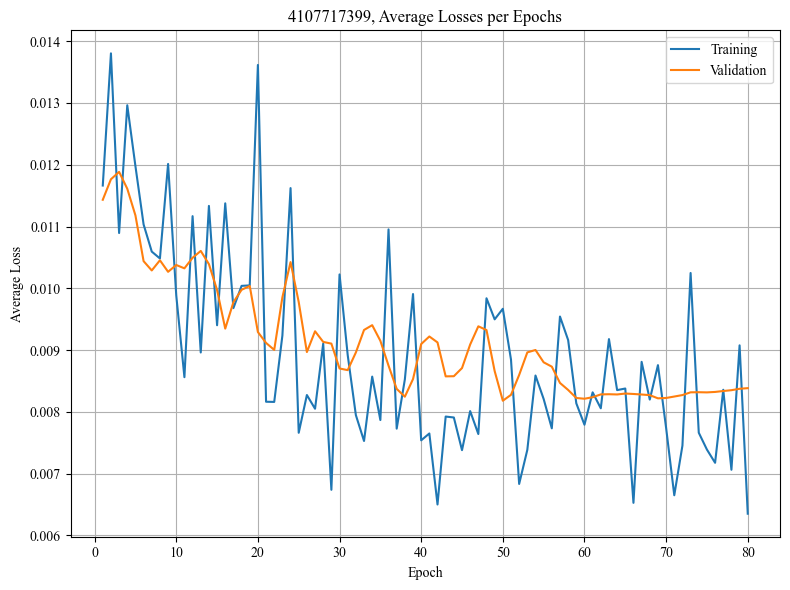

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.008292
Epoch 1/80, Step 2/5, Train Loss: 0.004225
Epoch 1/80, Step 3/5, Train Loss: 0.010080
Epoch 1/80, Step 4/5, Train Loss: 0.010159
Epoch 1/80, Step 5/5, Train Loss: 0.007796
Epoch 1/80 complete. Train Loss: 0.008110, Val Loss: 0.004320
Epoch 2/80, Step 1/5, Train Loss: 0.009501
Epoch 2/80, Step 2/5, Train Loss: 0.004578
Epoch 2/80, Step 3/5, Train Loss: 0.005923
Epoch 2/80, Step 4/5, Train Loss: 0.008020
Epoch 2/80, Step 5/5, Train Loss: 0.011230
Epoch 2/80 complete. Train Loss: 0.007850, Val Loss: 0.006651
Epoch 3/80, Step 1/5, Train Loss: 0.006496
Epoch 3/80, Step 2/5, Train Loss: 0.009388
Epoch 3/80, Step 3/5, Train Loss: 0.005763
Epoch 3/80, Step 4/5, Train Loss: 0.012188
Epoch 3/80, Step 5/5, Train Loss: 0.006811
Epoch 3/80 complete. Train Loss: 0.008129, Val Loss: 0.005282
Epoch 4/80, Step 1/5, Train Loss: 0.006001
Epoch 4/80, Step 2/5, Train Loss: 0.005870
Epoch 4/80, Step 3/5, Train Loss: 0.003722
Epoch 4/80, Step 4/5, Train Loss: 0.0101

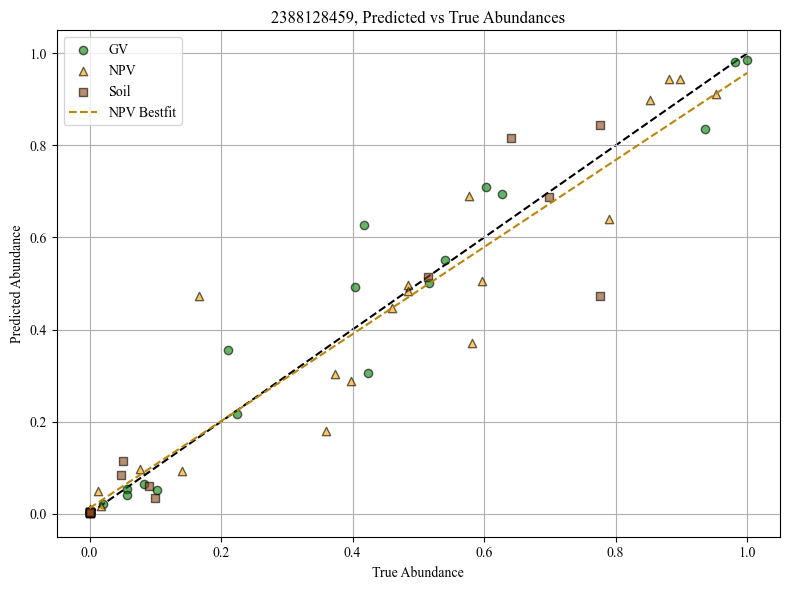

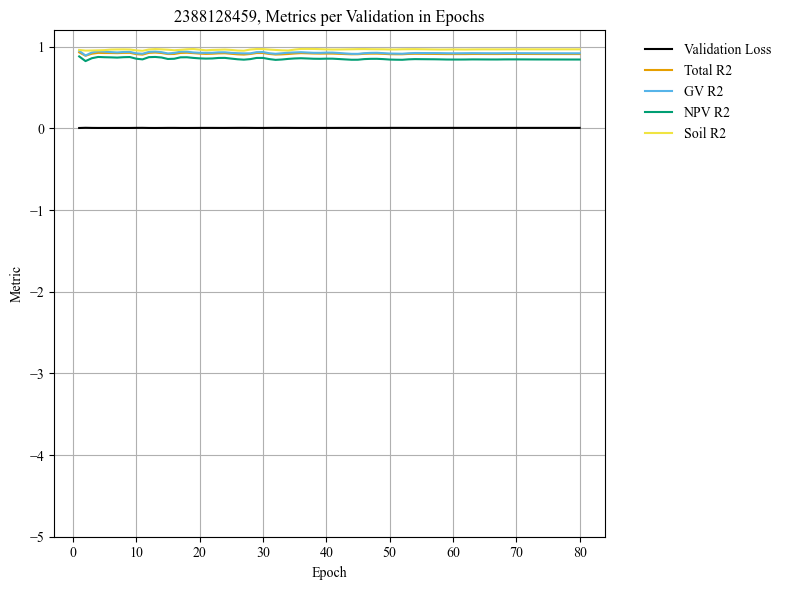

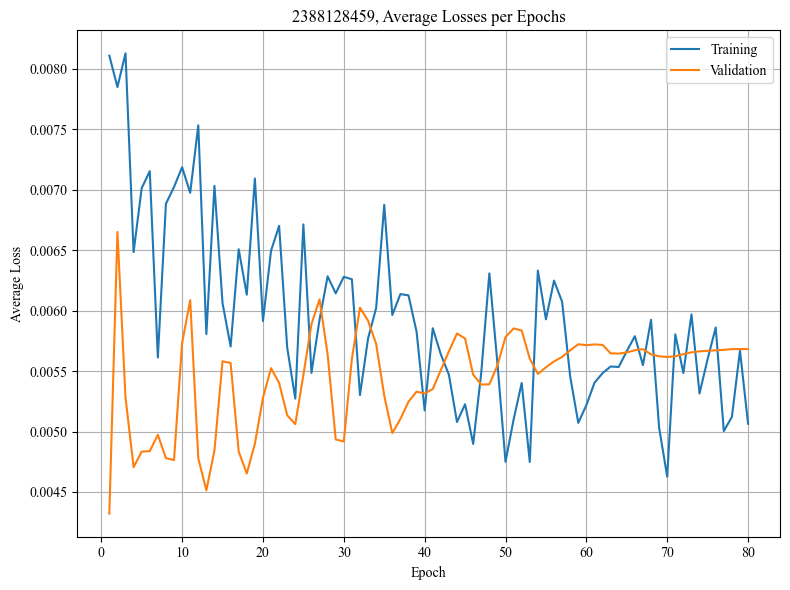

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.015551
Epoch 1/80, Step 2/5, Train Loss: 0.007987
Epoch 1/80, Step 3/5, Train Loss: 0.010816
Epoch 1/80, Step 4/5, Train Loss: 0.021412
Epoch 1/80, Step 5/5, Train Loss: 0.009016
Epoch 1/80 complete. Train Loss: 0.012956, Val Loss: 0.006403
Epoch 2/80, Step 1/5, Train Loss: 0.009359
Epoch 2/80, Step 2/5, Train Loss: 0.014355
Epoch 2/80, Step 3/5, Train Loss: 0.009305
Epoch 2/80, Step 4/5, Train Loss: 0.016635
Epoch 2/80, Step 5/5, Train Loss: 0.010215
Epoch 2/80 complete. Train Loss: 0.011974, Val Loss: 0.008047
Epoch 3/80, Step 1/5, Train Loss: 0.015244
Epoch 3/80, Step 2/5, Train Loss: 0.008465
Epoch 3/80, Step 3/5, Train Loss: 0.009789
Epoch 3/80, Step 4/5, Train Loss: 0.015353
Epoch 3/80, Step 5/5, Train Loss: 0.013304
Epoch 3/80 complete. Train Loss: 0.012431, Val Loss: 0.007789
Epoch 4/80, Step 1/5, Train Loss: 0.014254
Epoch 4/80, Step 2/5, Train Loss: 0.011403
Epoch 4/80, Step 3/5, Train Loss: 0.017424
Epoch 4/80, Step 4/5, Train Loss: 0.0073

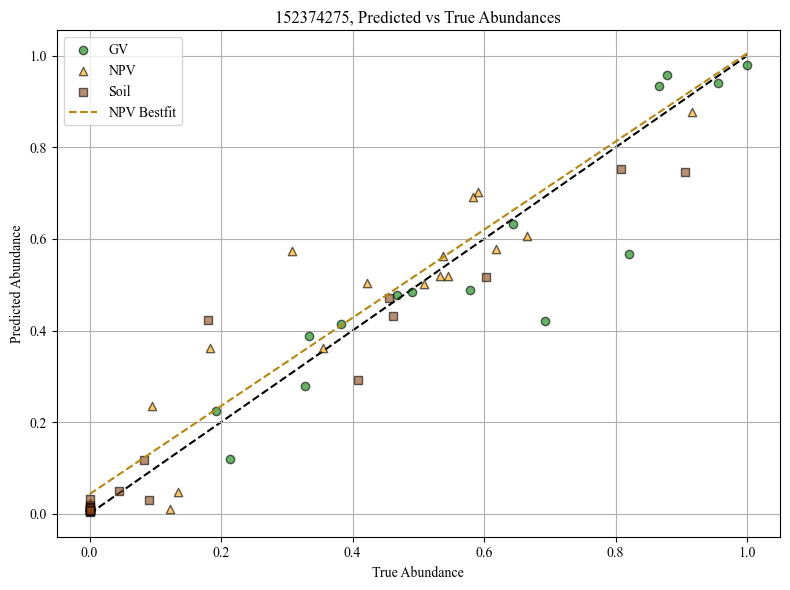

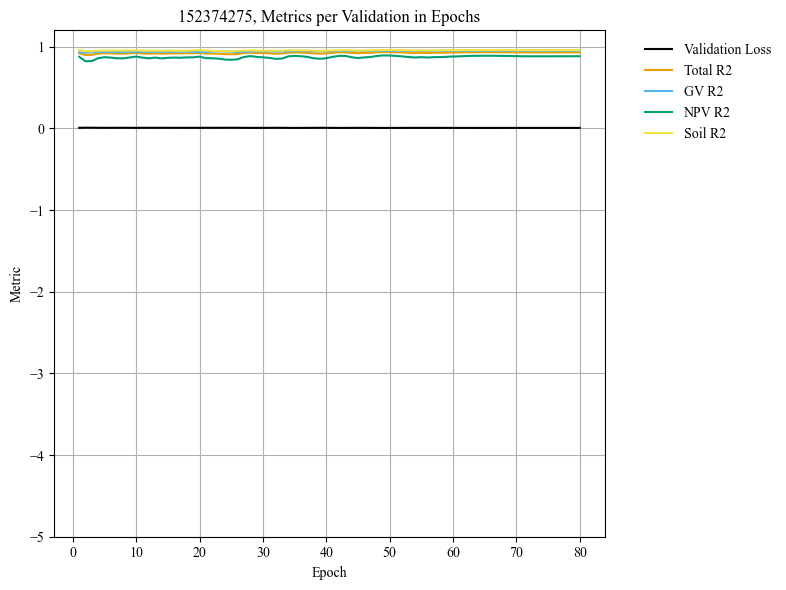

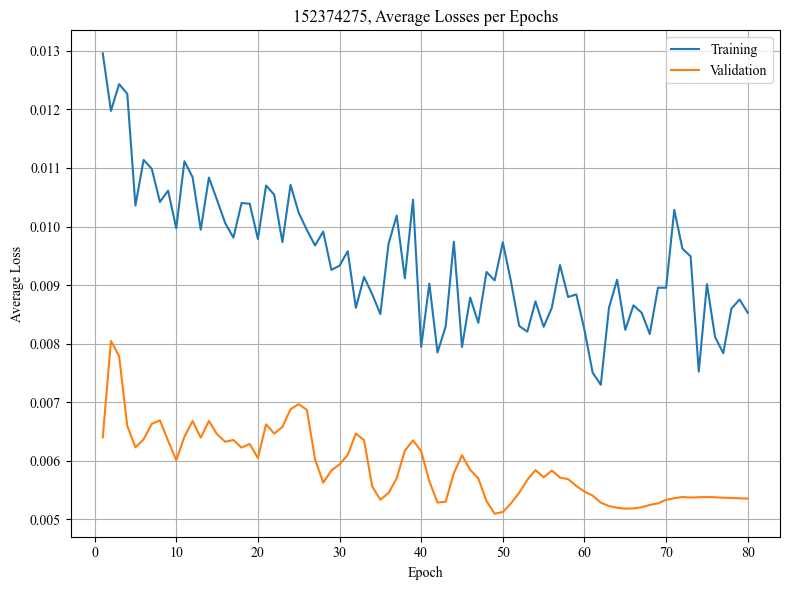

Testing complete


In [8]:
# Run the monte carlo cross validation loop

fno_128_dict = {}

for seed in mccv_seeds:
    torch.manual_seed(seed) # Set this as the global seed for all random ops in torch and numpy, just to be safe
    np.random.default_rng(seed)

    dataloaders = get_data(save_path=save_path, seed=seed, spec_range=[900, 1690], batch_size=batch_size, n_train=n_train, n_val=n_val, n_test=n_test)
    model = load_frozen(model_cfg, statedict_path, 'FNO').to(device)
    active_params = filter(lambda p: p.requires_grad, model.parameters()) # Filter the active params only
    optimizer = torch.optim.AdamW(active_params, lr=lr, weight_decay=weight_decay) # Only pass in the active params to the optim
    lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epoch*n_tb_epoch, eta_min=1e-6)
    loss = nn.MSELoss()

    model_dict = train_model(
        model=model,
        loss_fn=loss,
        optimizer=optimizer,
        lr_scheduler=lr_scheduler,
        configured_data=dataloaders,
        n_epoch=epoch,
        n_tb_epoch=n_tb_epoch,
        device=device,
        dtype=torch.float32,
        save_dir=str('results/'+str(seed)),
        model_name=str(seed),
        save_artifacts=True # Will only save metrics, artifacts are unnecessary
    )
    
    fno_128_dict[seed] = model_dict

In [9]:
import pickle
with open('fno_128_dict.pkl', 'wb') as fp:
    pickle.dump(fno_128_dict, fp)

NPV R^2 MCCV Results (M=50)
Mean (μ): 0.8403
Std (σ): ±0.1645
Min-Max: -0.0187-0.9773
Final Reported Metric: 0.8403 ± 0.1645


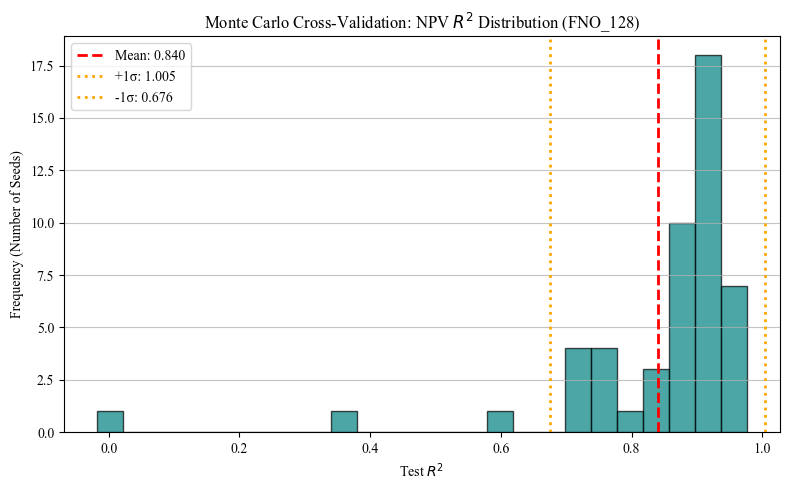

In [11]:
import numpy as np
import matplotlib.pyplot as plt

# Extract the NPV R2 metrics
npv_r2_list = [
    model_dict['metrics_total'][0][5] 
    for seed, model_dict in fno_128_dict.items()
]
npv_r2_array = np.array(npv_r2_list)

# Calculate the core statistical bounds
# Used ddof=1 for the unbiased sample standard deviation
mu_npv = np.mean(npv_r2_array)
sigma_npv = np.std(npv_r2_array, ddof=1)
min_npv = np.min(npv_r2_array)
max_npv = np.max(npv_r2_array)

# Plot stuff
print(f"NPV R^2 MCCV Results (M={len(npv_r2_array)})")
print(f"Mean (μ): {mu_npv:.4f}")
print(f"Std (σ): ±{sigma_npv:.4f}")
print(f"Min-Max: {min_npv:.4f}-{max_npv:.4f}")
print(f"Final Reported Metric: {mu_npv:.4f} ± {sigma_npv:.4f}")
plt.figure(figsize=(8, 5))
plt.hist(npv_r2_array, bins=25, color='teal', edgecolor='black', alpha=0.7)
plt.axvline(mu_npv, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mu_npv:.3f}')
plt.axvline(mu_npv + sigma_npv, color='orange', linestyle='dotted', linewidth=2, label=f'+1σ: {(mu_npv + sigma_npv):.3f}')
plt.axvline(mu_npv - sigma_npv, color='orange', linestyle='dotted', linewidth=2, label=f'-1σ: {(mu_npv - sigma_npv):.3f}')
plt.title('Monte Carlo Cross-Validation: NPV $R^2$ Distribution (FNO_128)')
plt.xlabel('Test $R^2$')
plt.ylabel('Frequency (Number of Seeds)')
plt.legend()
plt.grid(axis='y', alpha=0.75)
plt.tight_layout()
plt.savefig('mccv_npv_r2_distribution.svg')
plt.show()